In [1]:
import os
import sys
import json
from torch.utils.tensorboard import SummaryWriter
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets
from tqdm import tqdm

import torch.nn as nn
import torch

import matplotlib.pyplot as plt
import numpy as np

In [2]:
# Colab
# train_dir = r'/content/drive/MyDrive/cars_tanks/train'
# test_dir = r'/content/drive/MyDrive/cars_tanks/test'
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_channel, out_channel, stride=1, downsample=None, **kwargs):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=in_channel, out_channels=out_channel,
                               kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channel)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv2d(in_channels=out_channel, out_channels=out_channel,
                               kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channel)
        self.downsample = downsample

    def forward(self, x):
        identity = x
        if self.downsample is not None:
            identity = self.downsample(x)

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        out += identity
        out = self.relu(out)

        return out

In [4]:
class Bottleneck(nn.Module):

    expansion = 4

    def __init__(self, in_channel, out_channel, stride=1, downsample=None,
                 groups=1, width_per_group=64):
        super(Bottleneck, self).__init__()

        width = int(out_channel * (width_per_group / 64.)) * groups

        self.conv1 = nn.Conv2d(in_channels=in_channel, out_channels=width,
                               kernel_size=1, stride=1, bias=False)  # squeeze channels
        self.bn1 = nn.BatchNorm2d(width)
        # -----------------------------------------
        self.conv2 = nn.Conv2d(in_channels=width, out_channels=width, groups=groups,
                               kernel_size=3, stride=stride, bias=False, padding=1)
        self.bn2 = nn.BatchNorm2d(width)
        # -----------------------------------------
        self.conv3 = nn.Conv2d(in_channels=width, out_channels=out_channel*self.expansion,
                               kernel_size=1, stride=1, bias=False)  # unsqueeze channels
        self.bn3 = nn.BatchNorm2d(out_channel*self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample

    def forward(self, x):
        identity = x
        if self.downsample is not None:
            identity = self.downsample(x)

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        out += identity
        out = self.relu(out)

        return out

In [5]:
# CBAM attention
class CBAMLayer(nn.Module):
    def __init__(self, channel, reduction=16, spatial_kernel=7):
        super(CBAMLayer, self).__init__()

        # channel attention 
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.avg_pool = nn.AdaptiveAvgPool2d(1)

        # shared MLP
        self.mlp = nn.Sequential(
            # Conv2d比Linear
            # nn.Linear(channel, channel // reduction, bias=False)
            nn.Conv2d(channel, channel // reduction, 1, bias=False),
            # inplace=True
            nn.ReLU(inplace=True),
            # nn.Linear(channel // reduction, channel,bias=False)
            nn.Conv2d(channel // reduction, channel, 1, bias=False)
        )

        # spatial attention
        self.conv = nn.Conv2d(2, 1, kernel_size=spatial_kernel,
                              padding=spatial_kernel // 2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        max_out = self.mlp(self.max_pool(x))
        avg_out = self.mlp(self.avg_pool(x))
        channel_out = self.sigmoid(max_out + avg_out)
        x = channel_out * x

        # max_out, _ = torch.max(x, dim=1, keepdim=True)
        # avg_out = torch.mean(x, dim=1, keepdim=True)
        # spatial_out = self.sigmoid(self.conv(torch.cat([max_out, avg_out], dim=1)))
        # x = spatial_out * x
        return x

In [6]:
class tankCarCls(nn.Module):

    def __init__(self,
                 block,
                 blocks_num,
                 num_classes=1000,
                 include_top=True,
                 groups=1,
                 width_per_group=64):
        super(tankCarCls, self).__init__()
        self.include_top = include_top
        self.in_channel = 64

        self.groups = groups
        self.width_per_group = width_per_group

        self.conv1 = nn.Conv2d(3, self.in_channel, kernel_size=7, stride=2,
                               padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(self.in_channel)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, blocks_num[0])
        self.layer2 = self._make_layer(block, 128, blocks_num[1], stride=2)
        self.layer3 = self._make_layer(block, 256, blocks_num[2], stride=2)
        self.layer4 = self._make_layer(block, 512, blocks_num[3], stride=2)
        if self.include_top:
            self.avgpool = nn.AdaptiveAvgPool2d((1, 1))  # output size = (1, 1)
            self.fc = nn.Linear(512 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')

        self.channelAttention = CBAMLayer(64)

    def _make_layer(self, block, channel, block_num, stride=1):
        downsample = None
        if stride != 1 or self.in_channel != channel * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.in_channel, channel * block.expansion, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(channel * block.expansion))

        layers = []
        layers.append(block(self.in_channel,
                            channel,
                            downsample=downsample,
                            stride=stride,
                            groups=self.groups,
                            width_per_group=self.width_per_group))
        self.in_channel = channel * block.expansion

        for _ in range(1, block_num):
            layers.append(block(self.in_channel,
                                channel,
                                groups=self.groups,
                                width_per_group=self.width_per_group))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.channelAttention(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        if self.include_top:
            x = self.avgpool(x)
            x = torch.flatten(x, 1)
            x = self.fc(x)
        return x

In [7]:
def tankCarCls_v0(num_classes=2, include_top=True):
    return tankCarCls(Bottleneck, [3, 4, 6, 3], num_classes=num_classes, include_top=include_top)

In [8]:
def main():
    import os
    os.environ['CUDA_LAUNCH_BLOCKING'] = '1'  

    device = torch.device("cuda:0")
    # device = torch.device("cpu")
    print("using {} device.".format(device))

    data_transform = {
        "train": transforms.Compose([transforms.RandomResizedCrop(224),
                                     transforms.RandomHorizontalFlip(),
                                     transforms.ToTensor(),
                                     transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])]),
        "val": transforms.Compose([transforms.Resize(256),
                                   transforms.CenterCrop(224),
                                   transforms.ToTensor(),
                                   transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])}

    data_root = os.path.abspath(os.path.join(os.getcwd(), "../.."))  # get data root path
    #image_path = os.path.join(data_root, "car_tank_classi", "cars_tanks")  # flower data set path
    train_dataset = datasets.ImageFolder(root=os.path.join( "cars_tanks/train"),
                                         transform=data_transform["train"])
    train_num = len(train_dataset)

    flower_list = train_dataset.class_to_idx
    cla_dict = dict((val, key) for key, val in flower_list.items())
    # write dict into json file
    json_str = json.dumps(cla_dict, indent=2)
    with open('class_indices.json', 'w') as json_file:
        json_file.write(json_str)

    batch_size = 4
    nw = 0  # number of workers
    print('Using {} dataloader workers every process'.format(nw))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                                               batch_size=batch_size, shuffle=True,
                                               num_workers=nw)

    validate_dataset = datasets.ImageFolder(root=os.path.join( "cars_tanks/train"),
                                            transform=data_transform["val"])
    val_num = len(validate_dataset)
    validate_loader = torch.utils.data.DataLoader(validate_dataset,
                                                  batch_size=batch_size, shuffle=False,
                                                  num_workers=nw)

    print("using {} images for training, {} images for validation.".format(train_num,
                                                                           val_num))

    net = tankCarCls_v0()

    # change fc layer structure
    in_channel = net.fc.in_features
    net.fc = nn.Linear(in_channel, 2)
    net.to(device)

    # define loss function
    loss_function = nn.CrossEntropyLoss()

    # construct an optimizer
    params = [p for p in net.parameters() if p.requires_grad]
    optimizer = optim.Adam(params, lr=0.0001)

    epochs = 70
    best_acc = 0.0
    save_path = './tankCarCls_v1.pth'
    train_steps = len(train_loader)
    torch.cuda.empty_cache()
    writer = SummaryWriter("logs")

      # writer.add_scalar("Accuracy-epoch", val_accurate, epoch+1)
      #   writer.add_scalar("loss-epoch", running_loss, epoch+1)
      #   writer.add_scalar("Precision-epoch", Precision, epoch+1)
      #   writer.add_scalar("Recall-epoch", Recall, epoch+1)
      #   writer.add_scalar("Precision-Recall", Precision, Recall)
      #   writer.add_scalar("F1-epoch", F1, epoch + 1)
      #   writer.add_scalar("Sensitivity-epoch", Sensitivity, epoch + 1)
      #   writer.add_scalar("Specificity-epoch", Specificity, epoch + 1)
      #   writer.add_scalar("Sensitivity-Specificity", Sensitivity, Specificity)
    AccuracyL = []
    lossL = []
    PrecisionL = []
    RecallL = []
    F1L = []
    SensitivityL = []
    SpecificityL = []
    ThreatL = []
    x = []
    for epoch in range(epochs):
        # train
        net.train()
        running_loss = 0.0
        train_bar = tqdm(train_loader, file=sys.stdout)
        for step, data in enumerate(train_bar):
            images, labels = data
            optimizer.zero_grad()
            logits = net(images.to(device))
            loss = loss_function(logits, labels.to(device))
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss += loss.item()

            train_bar.desc = "train epoch[{}/{}] loss:{:.3f}".format(epoch + 1,
                                                                     epochs,
                                                                     loss)

        # validate
        net.eval()
        acc = 0.0  # accumulate accurate number / epoch
        TP = 0.0
        FP = 0.0
        FN = 0.0
        TN = 0.0

        with torch.no_grad():
            val_bar = tqdm(validate_loader, file=sys.stdout)
            for val_data in val_bar:
                val_images, val_labels = val_data
                outputs = net(val_images.to(device))
                # loss = loss_function(outputs, test_labels)
                predict_y = torch.max(outputs, dim=1)[1]


                acc += torch.eq(predict_y, val_labels.to(device)).sum().item()


                TP += (torch.eq(predict_y, val_labels.to(device)) & torch.eq(predict_y, 0)).sum().item()

                # 10
                FP += (torch.eq(predict_y, 1) & torch.eq(val_labels.to(device), 0)).sum().item()
                # 01
                FN += (torch.eq(predict_y, 0) & torch.eq(val_labels.to(device), 1)).sum().item()
                # 11
                TN += (torch.eq(predict_y, 1) & torch.eq(val_labels.to(device), 1)).sum().item()

                val_bar.desc = "valid epoch[{}/{}]".format(epoch + 1,
                                                           epochs)

        val_accurate = acc / val_num  #（TP+TN）/（TP+FP+TN+FN）
        # Precision=TP/（TP+FP）
        Precision = TP /(TP + FP)
        Recall = TP / (TP + FN)
        # Precision-recall
        # Confusion matrix
        F1 = 2 * (Precision * Recall) / (Precision + Recall)
        Sensitivity = TP / (TP + FN)
        Specificity = TN / (TN + FP)
        Threat = TP / (TP + FN + FP)
        
        print('[epoch %d] loss: %.3f  accuracy: %.3f  Precision: %.3f  Recall: %.3f  F1: %3f  Sensitivity: %.3f  Specificity: %.3f  Threat: %.3f'   %
              (epoch + 1, running_loss / train_steps, val_accurate,Precision,Recall, F1, Sensitivity, Specificity, Threat))

        writer.add_scalar("Accuracy-epoch", val_accurate, epoch+1)
        writer.add_scalar("loss-epoch", running_loss, epoch+1)
        writer.add_scalar("Precision-epoch", Precision, epoch+1)
        writer.add_scalar("Recall-epoch", Recall, epoch+1)
        writer.add_scalar("Precision-Recall", Precision, Recall)
        writer.add_scalar("F1-epoch", F1, epoch + 1)
        writer.add_scalar("Sensitivity-epoch", Sensitivity, epoch + 1)
        writer.add_scalar("Specificity-epoch", Specificity, epoch + 1)
        writer.add_scalar("Sensitivity-Specificity", Sensitivity, Specificity)
        writer.add_scalar("Threat-epoch", Threat, epoch + 1)

        AccuracyL.append(val_accurate)
        x.append(epoch)
        lossL.append(running_loss)
        PrecisionL.append(Precision)
        RecallL.append(Recall)
        F1L.append(F1)
        SensitivityL.append(Sensitivity)
        SpecificityL.append(Specificity)
        ThreatL.append(Threat)
#        import matplotlib.pyplot as plt

#        import numpy as np

        # AccuracyL = []
        y=AccuracyL
        plt.figure(figsize=(3,3))
        plt.plot(x,y)
        plt.xlabel("epoch")
        plt.ylabel("Accuracy")
        plt.title("Accuracy-epoch")
        plt.show()

        # lossL = []
        y=lossL
        plt.figure(figsize=(3,3))
        plt.plot(x,y)
        plt.xlabel("epoch")
        plt.ylabel("loss")
        plt.title("loss-epoch")
        plt.show()
        # PrecisionL = []
        y=PrecisionL
        plt.figure(figsize=(3,3))
        plt.plot(x,y)
        plt.xlabel("epoch")
        plt.ylabel("Precision")
        plt.title("Precision-epoch")
        plt.show()
        # RecallL = []
        y=RecallL
        plt.figure(figsize=(3,3))
        plt.plot(x,y)
        plt.xlabel("epoch")
        plt.ylabel("Recall")
        plt.title("Recall-epoch")
        # F1L = []
        y=F1L
        plt.figure(figsize=(3,3))
        plt.plot(x,y)
        plt.xlabel("epoch")
        plt.ylabel("F1")
        plt.title("F1-epoch")
        # SensitivityL = []
        y=SensitivityL
        plt.figure(figsize=(3,3))
        plt.plot(x,y)
        plt.xlabel("epoch")
        plt.ylabel("Sensitivity")
        plt.title("Sensitivity-epoch")
        # SpecificityL = []
        y=SpecificityL
        plt.figure(figsize=(3,3))
        plt.plot(x,y)
        plt.xlabel("epoch")
        plt.ylabel("Specificity")
        plt.title("Specificity-epoch")
        # ThreatL = []
        y=ThreatL
        plt.figure(figsize=(3,3))
        plt.plot(x,y)
        plt.xlabel("epoch")
        plt.ylabel("Threat")
        plt.title("Threat-epoch")
        
        # precision-recall = []
        y1=RecallL
        y2=PrecisionL
        plt.figure(figsize=(3,3))
        plt.plot(y2,y1)
        plt.xlabel("recall")
        plt.ylabel("precision")
        plt.title("precision-recall")
        
        # Sensitivity-Specificity = []
        y1=SpecificityL
        y2=SensitivityL
        plt.figure(figsize=(3,3))
        plt.plot(y1,y2)
        plt.xlabel("SpecificityL")
        plt.ylabel("SensitivityL")
        plt.title("Sensitivity-Specificity")
        
        



        if val_accurate > best_acc:
            best_acc = val_accurate
            torch.save(net.state_dict(), save_path)
    writer.close()
    print('Finished Training')

using cuda:0 device.
Using 0 dataloader workers every process
using 1303 images for training, 1303 images for validation.
valid epoch[1/70]: 100%|██████████| 326/326 [00:06<00:00, 52.19it/s]
[epoch 1] loss: 0.664  accuracy: 0.565  Precision: 1.000  Recall: 0.565  F1: 0.721649  Sensitivity: 0.565  Specificity: 1.000  Threat: 0.565


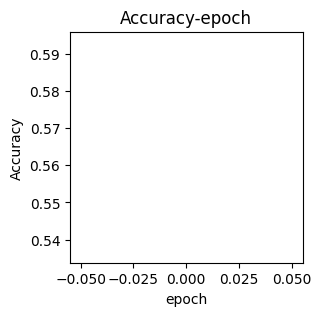

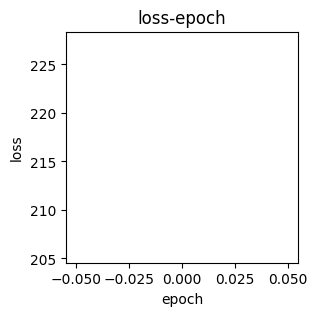

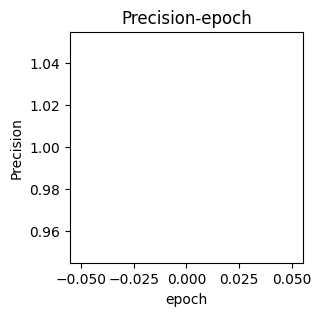

valid epoch[2/70]: 100%|██████████| 326/326 [00:06<00:00, 52.11it/s]
[epoch 2] loss: 0.646  accuracy: 0.779  Precision: 0.922  Recall: 0.746  F1: 0.824818  Sensitivity: 0.746  Specificity: 0.855  Threat: 0.702


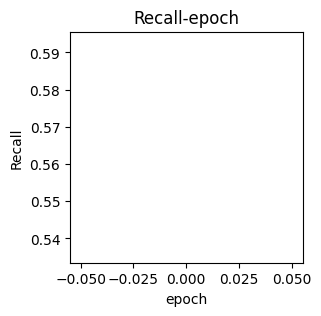

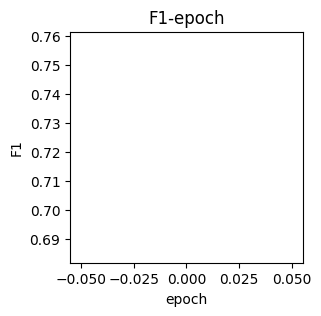

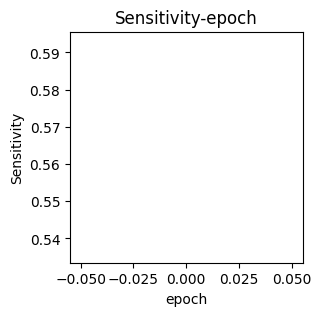

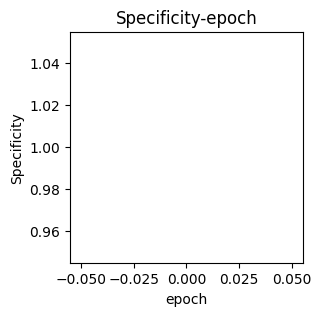

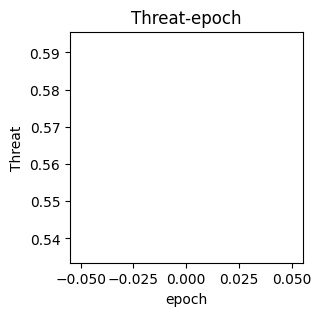

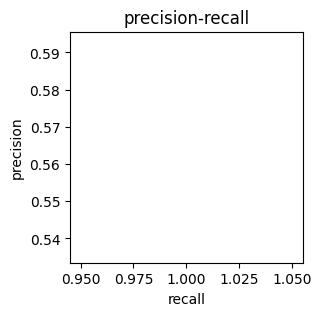

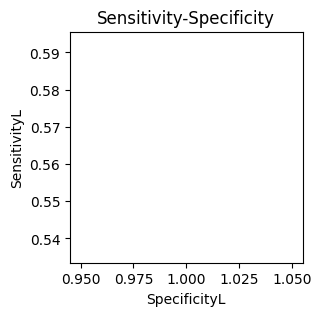

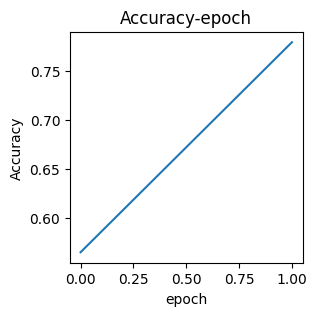

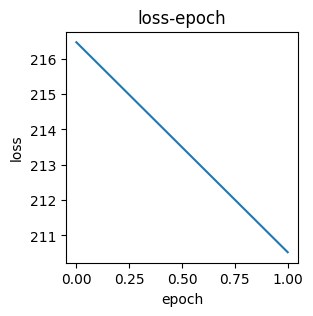

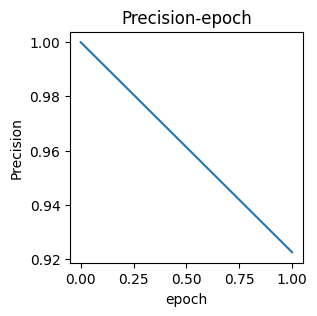

valid epoch[3/70]: 100%|██████████| 326/326 [00:06<00:00, 51.19it/s]
[epoch 3] loss: 0.593  accuracy: 0.609  Precision: 0.811  Recall: 0.616  F1: 0.700353  Sensitivity: 0.616  Specificity: 0.586  Threat: 0.539


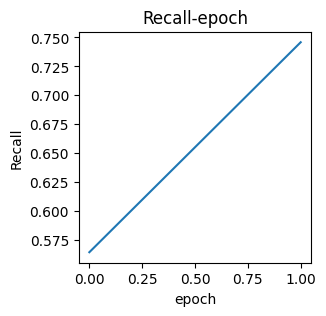

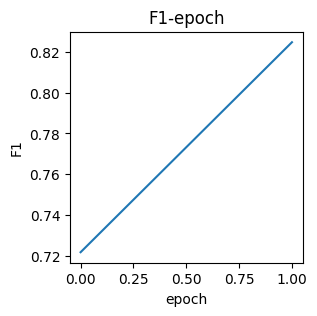

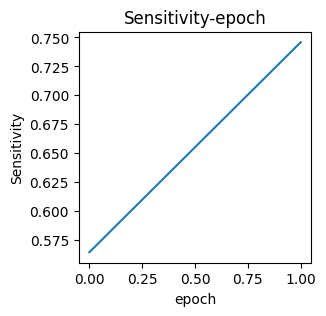

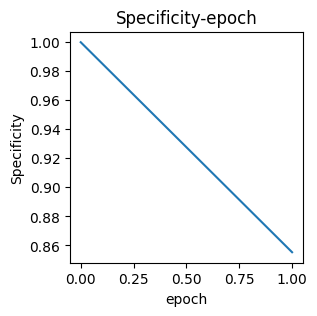

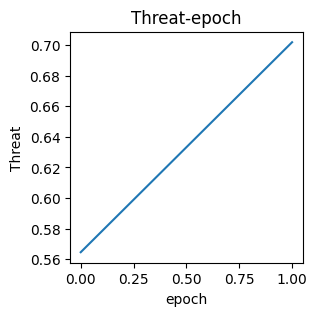

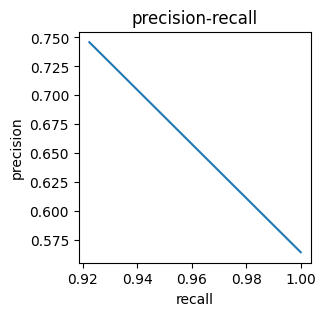

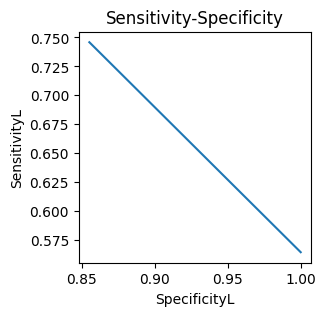

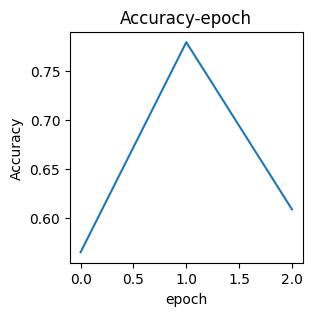

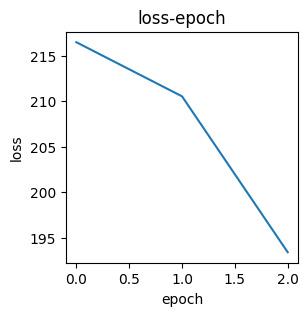

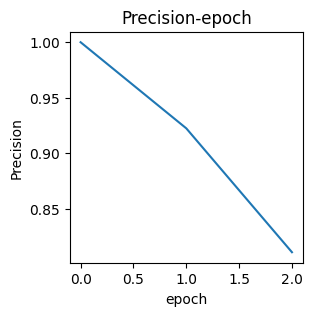

valid epoch[4/70]: 100%|██████████| 326/326 [00:06<00:00, 50.15it/s]
[epoch 4] loss: 0.592  accuracy: 0.793  Precision: 0.948  Recall: 0.750  F1: 0.837740  Sensitivity: 0.750  Specificity: 0.898  Threat: 0.721


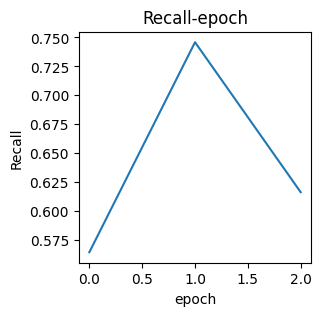

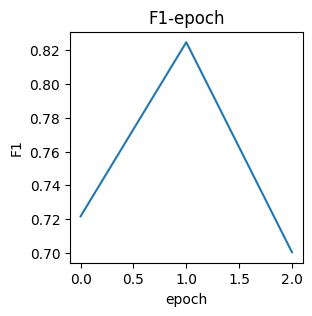

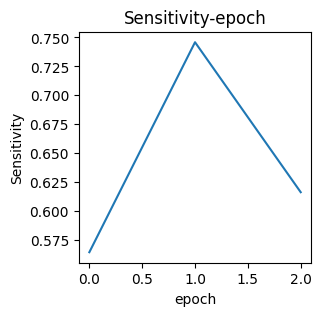

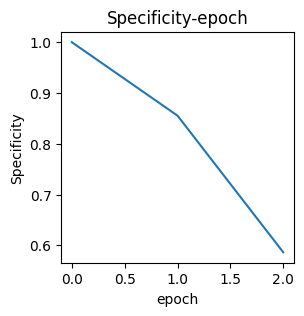

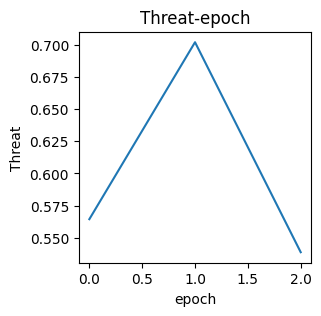

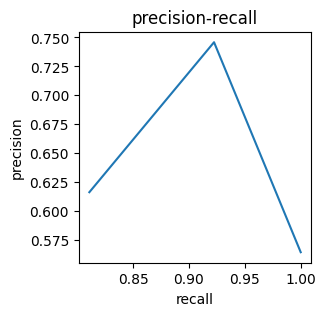

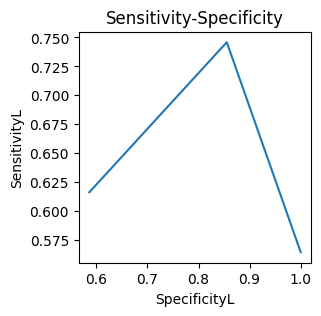

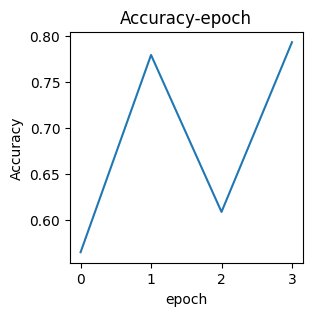

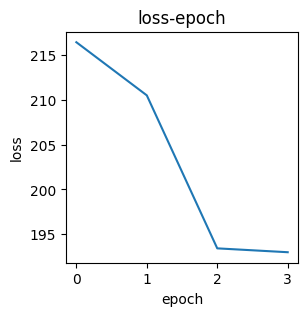

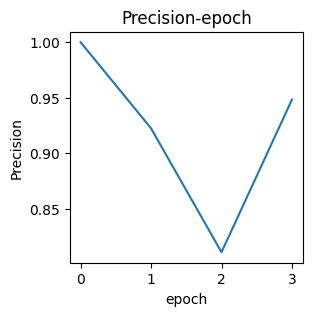

valid epoch[5/70]: 100%|██████████| 326/326 [00:06<00:00, 53.40it/s]
[epoch 5] loss: 0.548  accuracy: 0.655  Precision: 0.427  Recall: 0.918  F1: 0.583101  Sensitivity: 0.918  Specificity: 0.562  Threat: 0.412


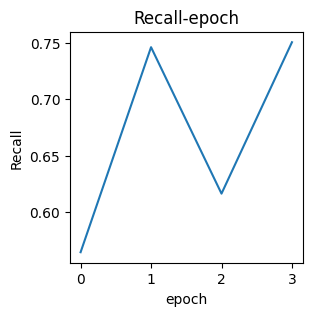

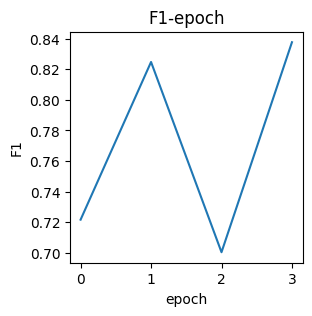

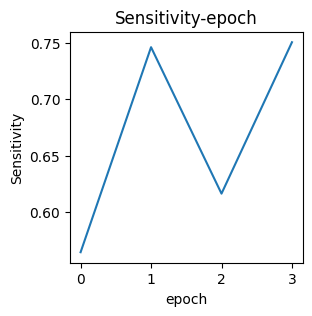

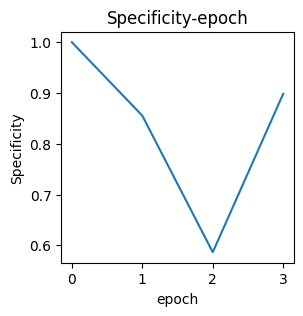

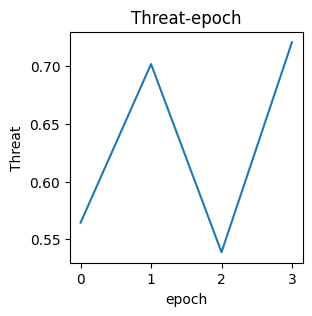

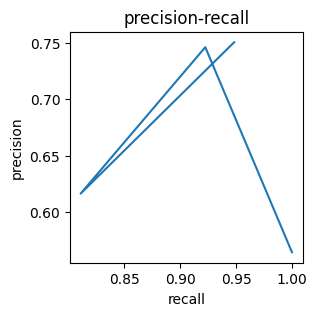

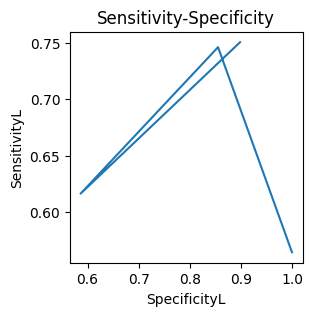

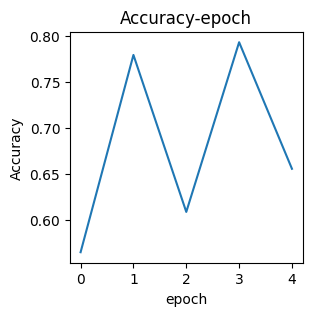

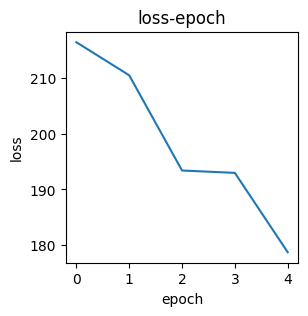

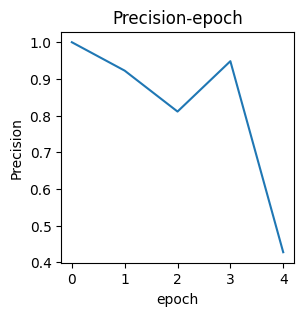

valid epoch[6/70]: 100%|██████████| 326/326 [00:06<00:00, 53.56it/s]
[epoch 6] loss: 0.536  accuracy: 0.807  Precision: 0.918  Recall: 0.779  F1: 0.843223  Sensitivity: 0.779  Specificity: 0.863  Threat: 0.729


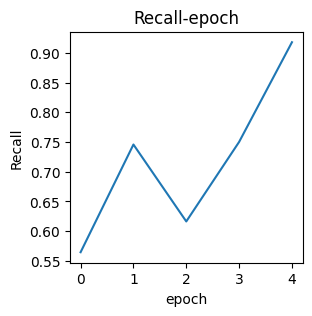

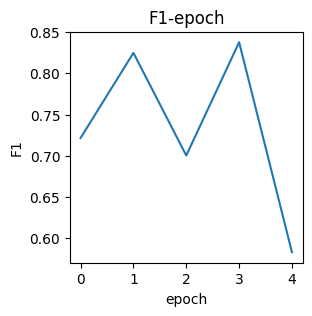

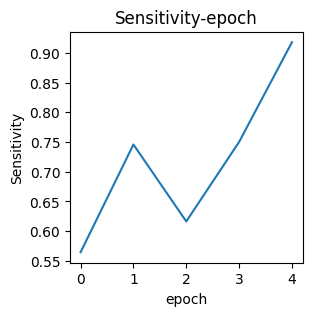

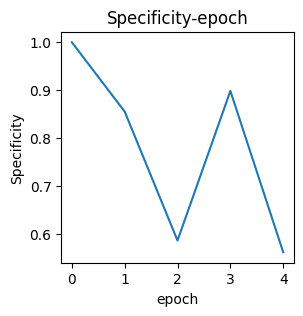

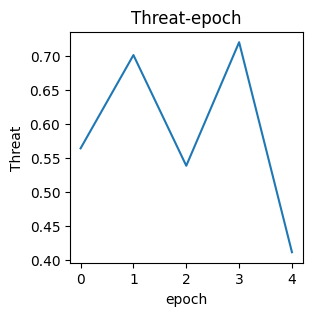

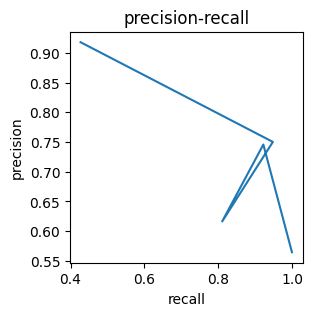

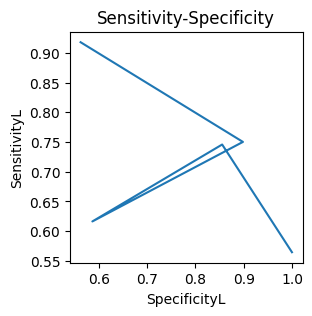

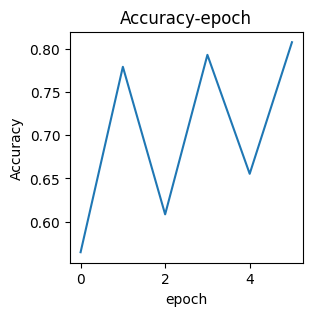

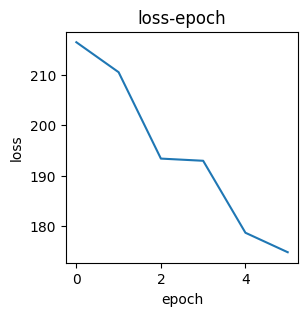

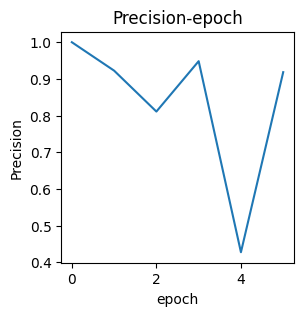

valid epoch[7/70]: 100%|██████████| 326/326 [00:06<00:00, 50.69it/s]
[epoch 7] loss: 0.561  accuracy: 0.817  Precision: 0.822  Recall: 0.848  F1: 0.834831  Sensitivity: 0.848  Specificity: 0.778  Threat: 0.716


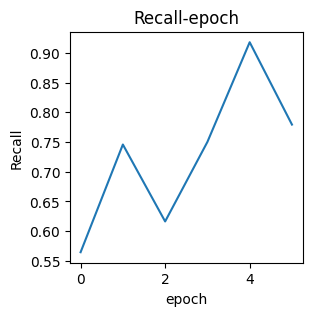

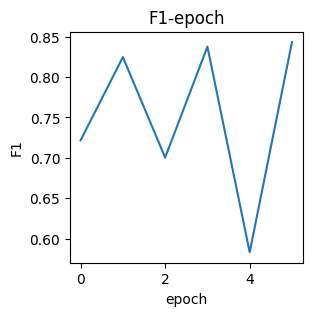

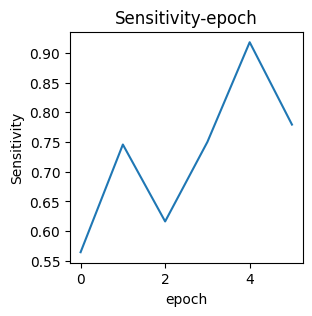

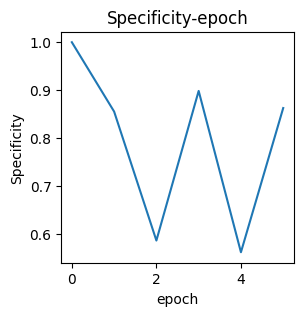

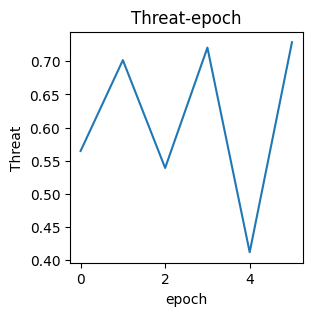

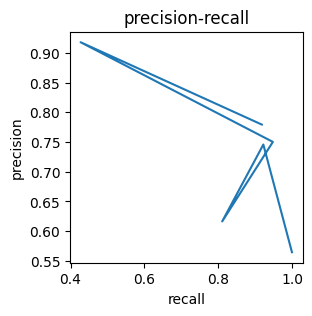

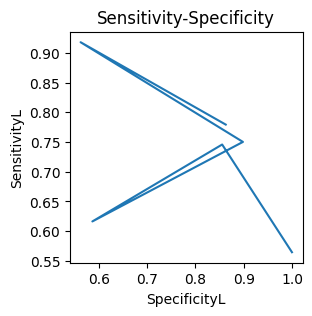

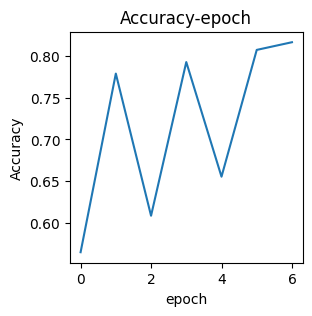

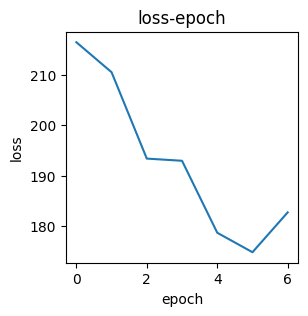

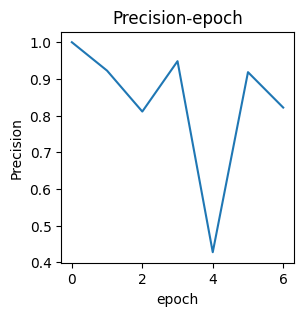

valid epoch[8/70]: 100%|██████████| 326/326 [00:06<00:00, 50.94it/s]
[epoch 8] loss: 0.492  accuracy: 0.840  Precision: 0.887  Recall: 0.839  F1: 0.862434  Sensitivity: 0.839  Specificity: 0.842  Threat: 0.758


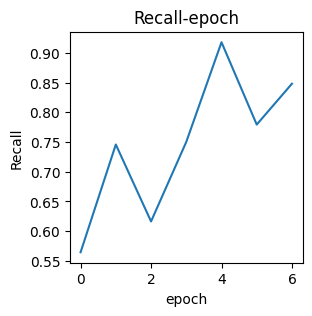

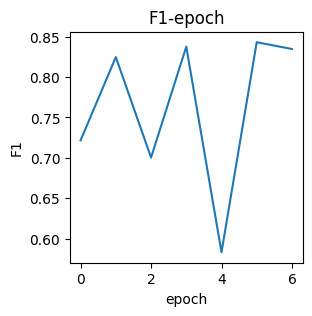

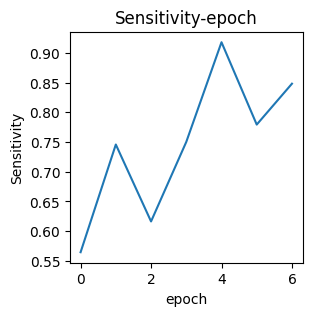

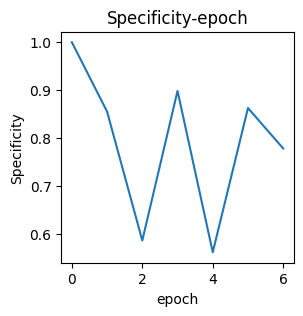

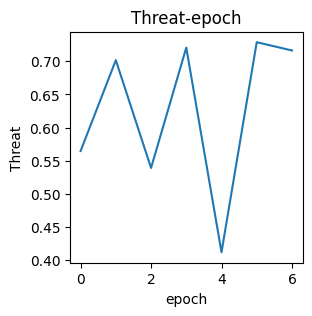

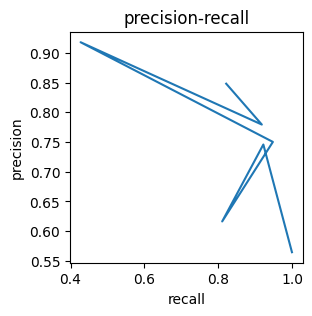

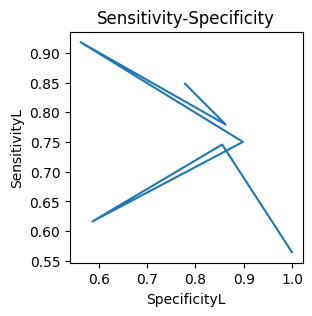

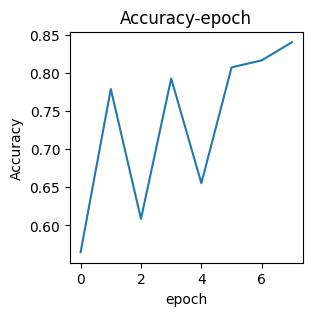

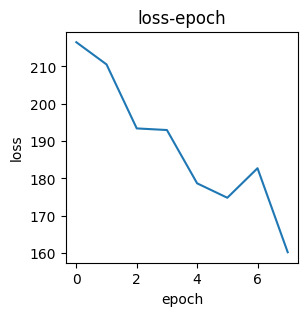

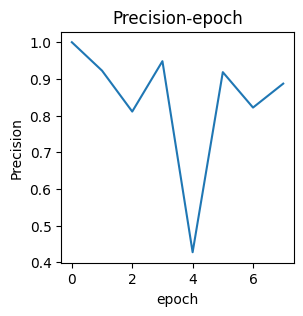

valid epoch[9/70]: 100%|██████████| 326/326 [00:06<00:00, 52.00it/s]
[epoch 9] loss: 0.495  accuracy: 0.783  Precision: 0.705  Recall: 0.887  F1: 0.785444  Sensitivity: 0.887  Specificity: 0.698  Threat: 0.647


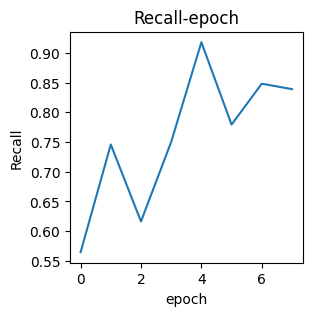

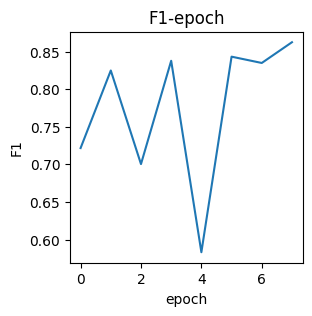

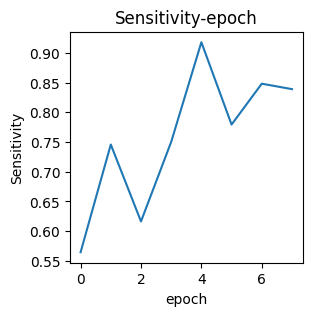

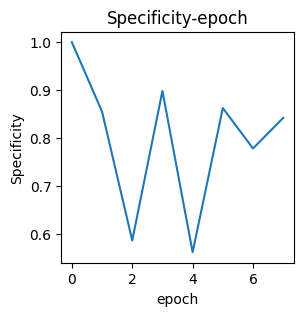

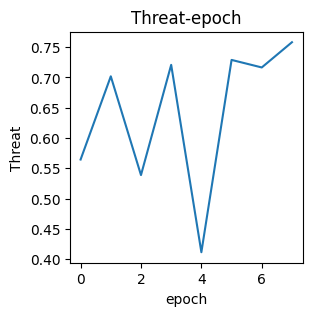

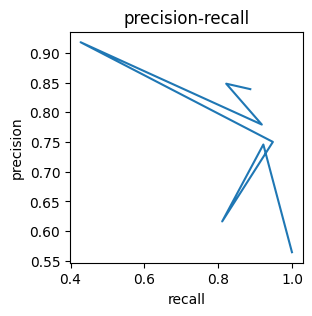

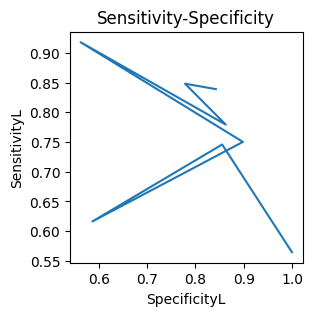

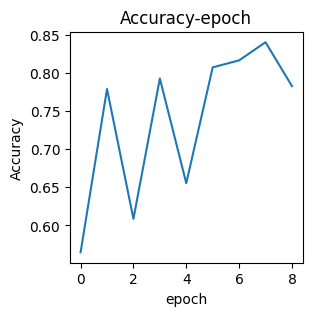

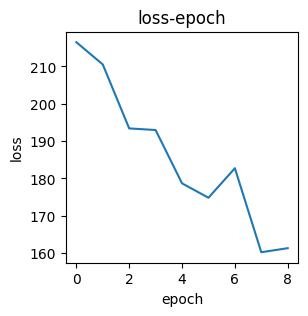

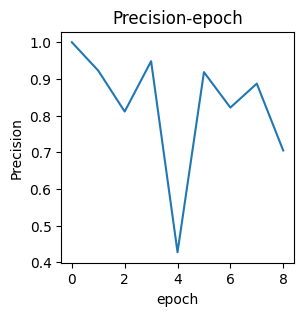

valid epoch[10/70]: 100%|██████████| 326/326 [00:06<00:00, 49.03it/s]
[epoch 10] loss: 0.492  accuracy: 0.852  Precision: 0.898  Recall: 0.848  F1: 0.872439  Sensitivity: 0.848  Specificity: 0.857  Threat: 0.774


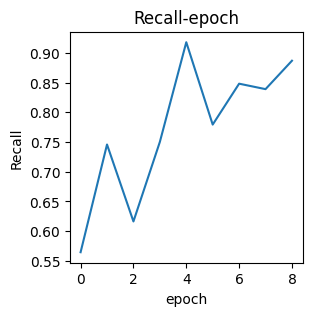

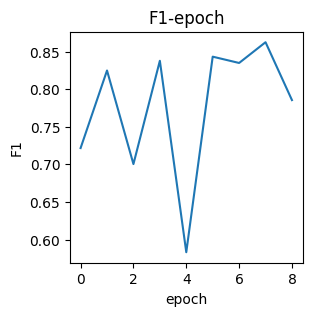

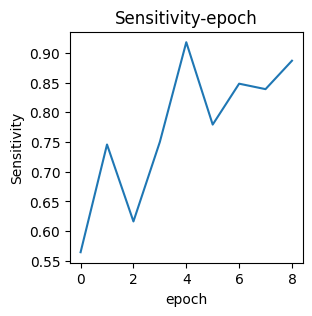

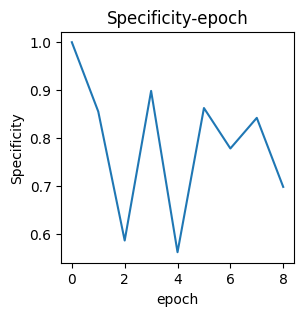

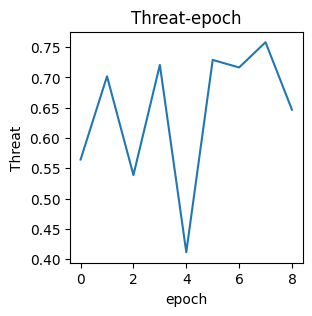

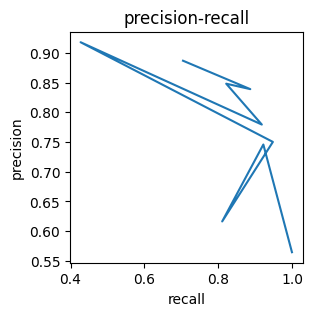

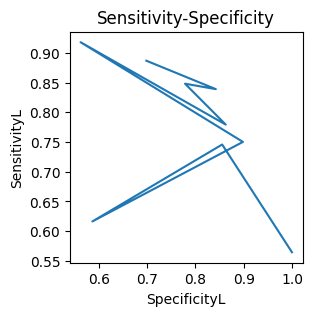

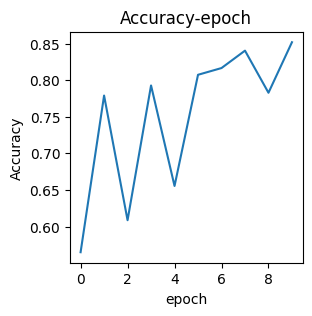

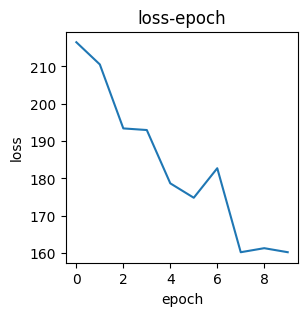

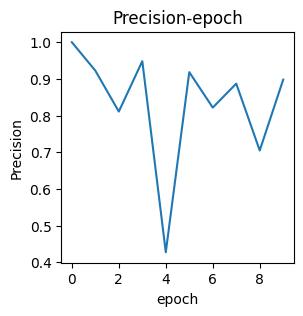

valid epoch[11/70]: 100%|██████████| 326/326 [00:06<00:00, 50.06it/s]
[epoch 11] loss: 0.480  accuracy: 0.838  Precision: 0.852  Recall: 0.860  F1: 0.855776  Sensitivity: 0.860  Specificity: 0.810  Threat: 0.748


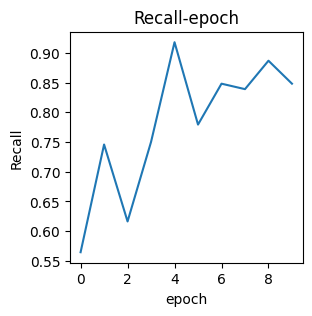

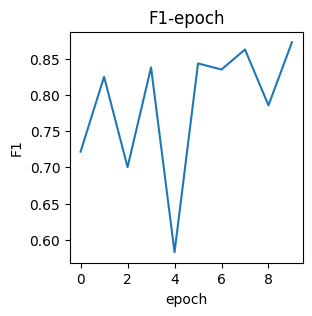

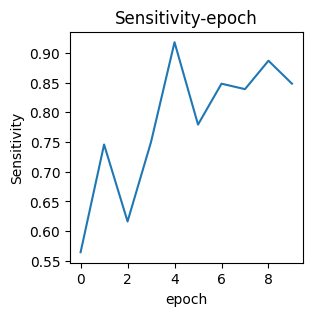

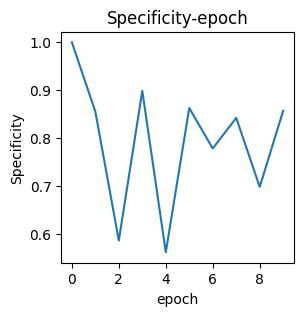

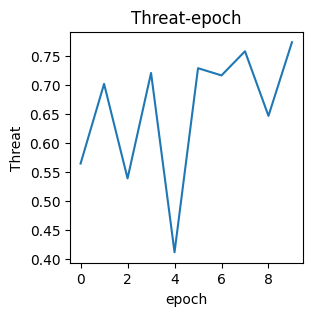

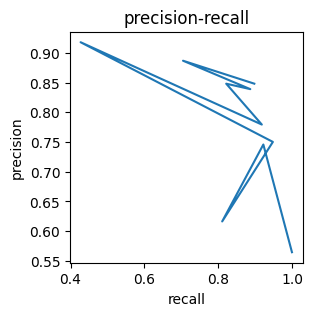

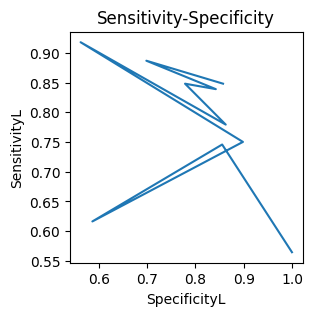

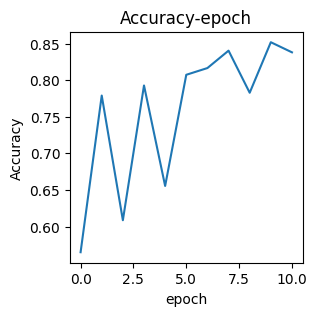

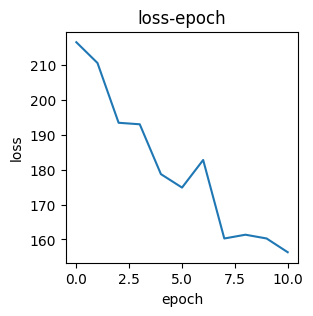

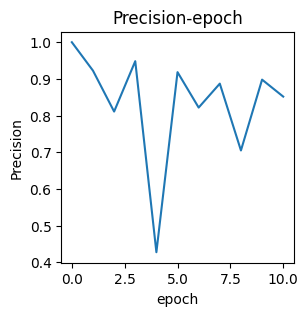

valid epoch[12/70]: 100%|██████████| 326/326 [00:06<00:00, 49.11it/s]
[epoch 12] loss: 0.472  accuracy: 0.794  Precision: 0.980  Recall: 0.739  F1: 0.842598  Sensitivity: 0.739  Specificity: 0.954  Threat: 0.728


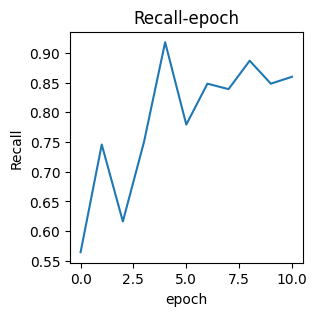

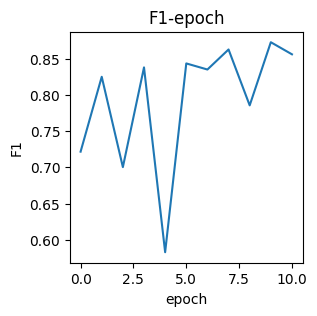

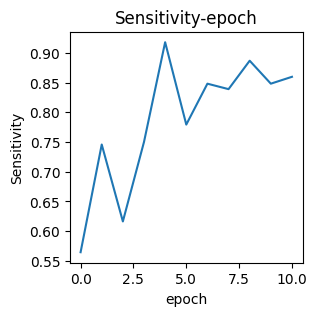

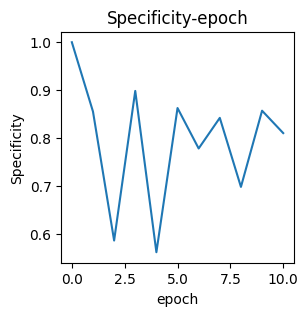

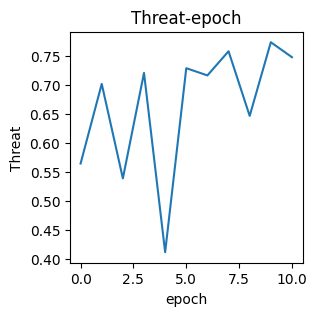

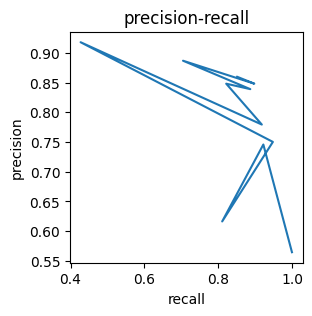

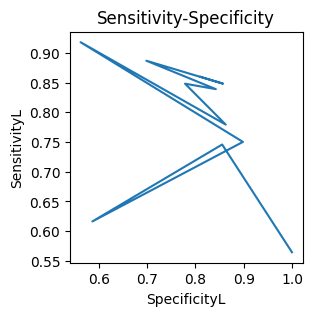

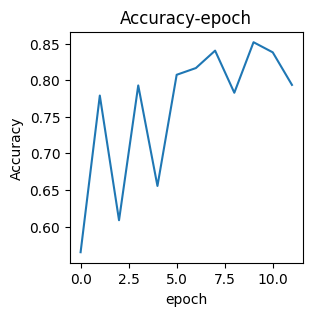

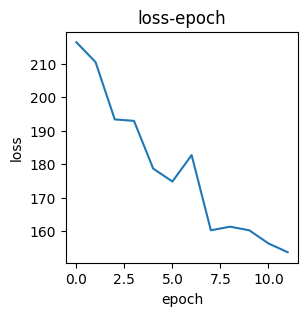

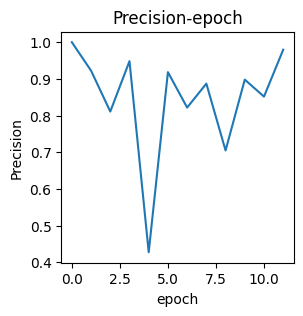

valid epoch[13/70]: 100%|██████████| 326/326 [00:06<00:00, 49.85it/s]
[epoch 13] loss: 0.464  accuracy: 0.842  Precision: 0.899  Recall: 0.834  F1: 0.865183  Sensitivity: 0.834  Specificity: 0.855  Threat: 0.762


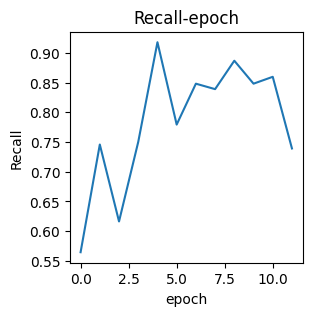

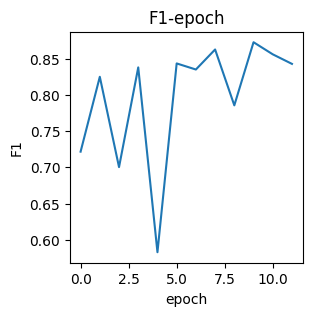

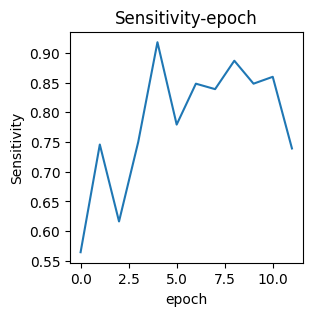

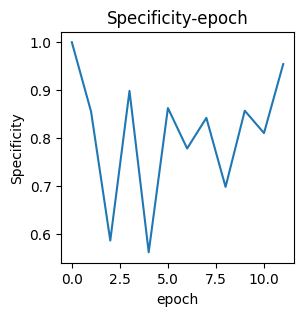

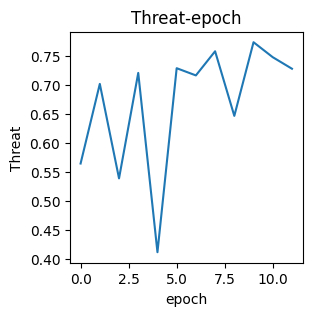

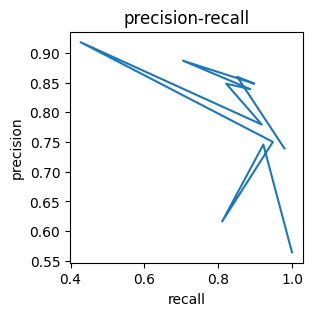

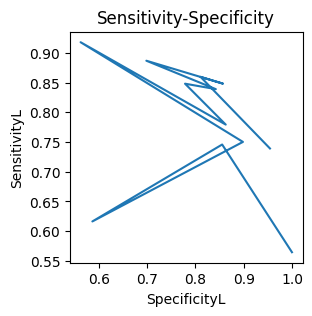

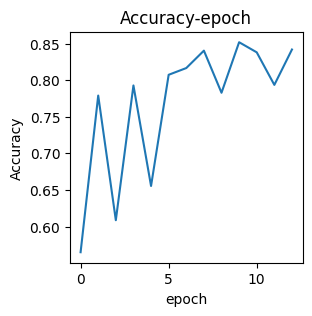

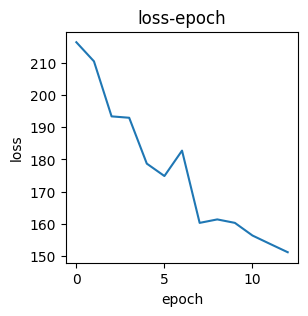

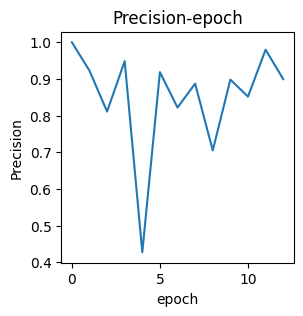

valid epoch[14/70]: 100%|██████████| 326/326 [00:06<00:00, 49.75it/s]
[epoch 14] loss: 0.436  accuracy: 0.823  Precision: 0.784  Recall: 0.889  F1: 0.832972  Sensitivity: 0.889  Specificity: 0.757  Threat: 0.714


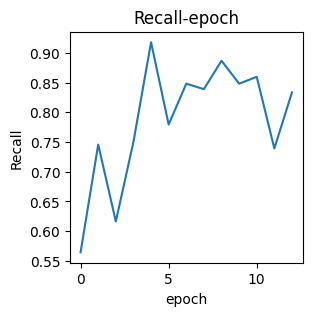

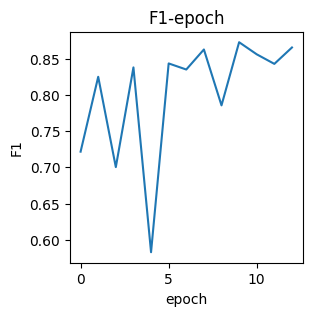

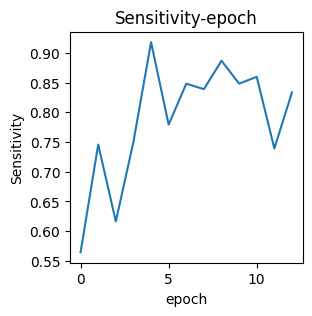

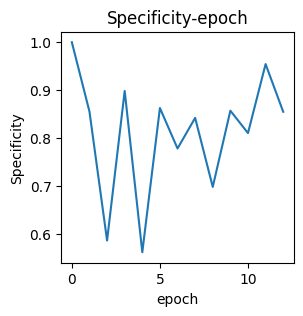

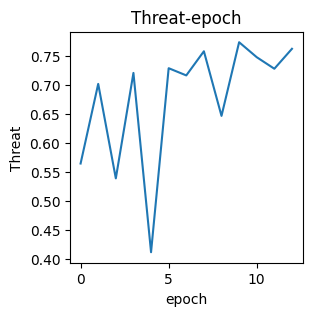

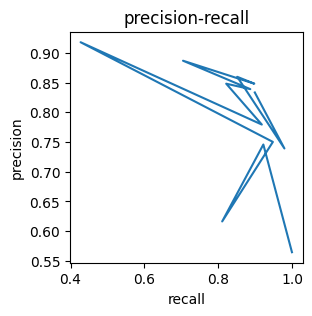

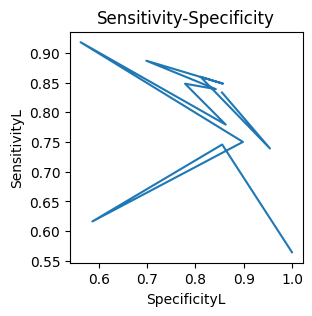

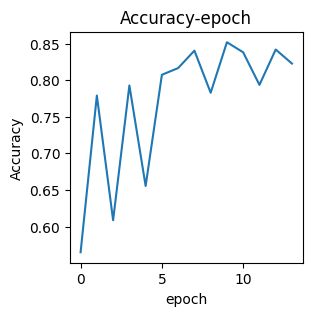

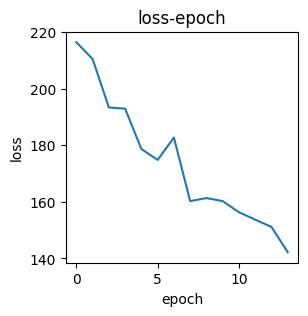

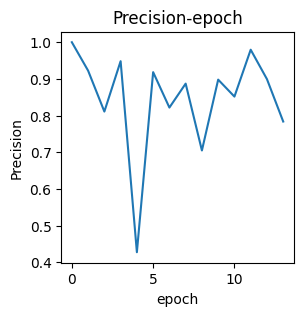

valid epoch[15/70]: 100%|██████████| 326/326 [00:06<00:00, 49.31it/s]
[epoch 15] loss: 0.443  accuracy: 0.856  Precision: 0.886  Recall: 0.863  F1: 0.874412  Sensitivity: 0.863  Specificity: 0.847  Threat: 0.777


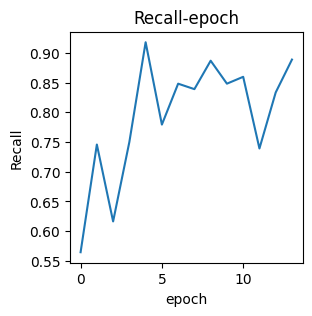

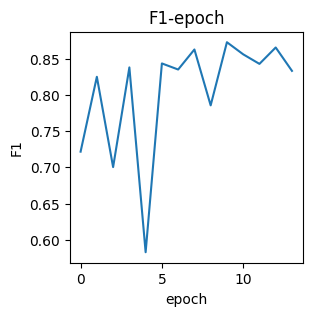

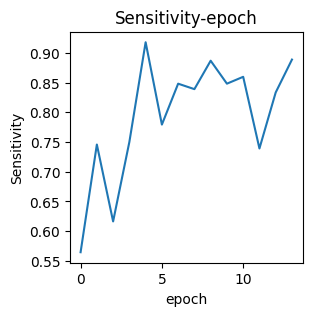

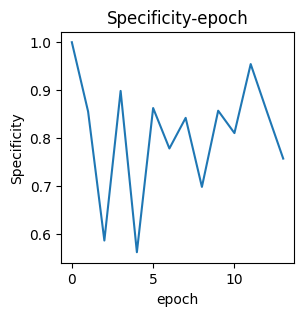

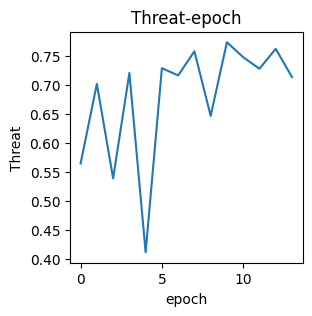

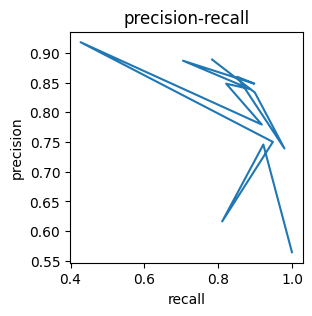

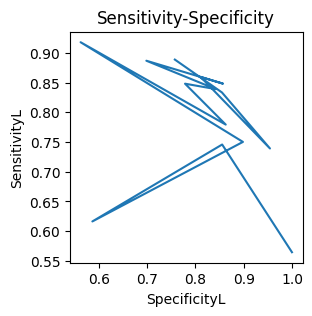

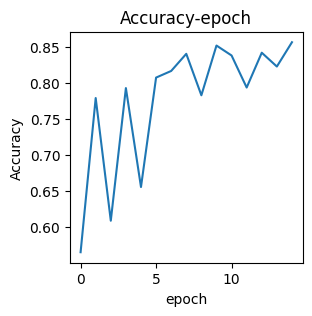

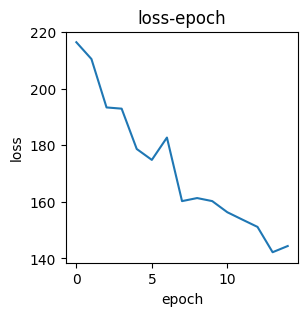

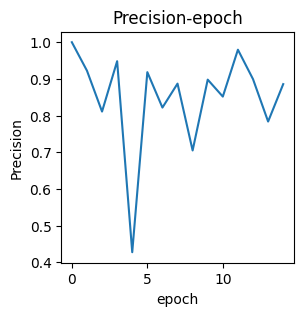

valid epoch[16/70]: 100%|██████████| 326/326 [00:06<00:00, 48.56it/s]
[epoch 16] loss: 0.461  accuracy: 0.873  Precision: 0.931  Recall: 0.856  F1: 0.891786  Sensitivity: 0.856  Specificity: 0.899  Threat: 0.805


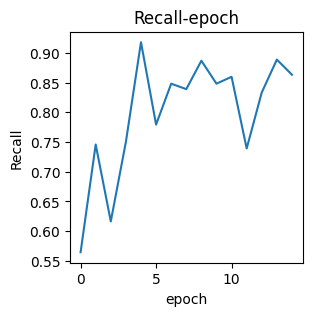

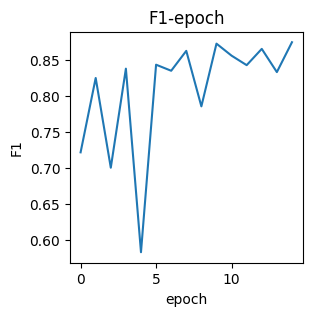

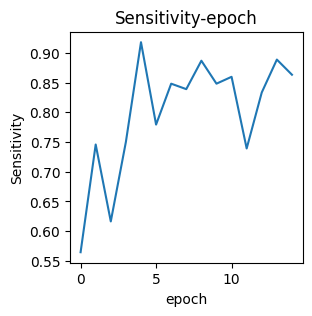

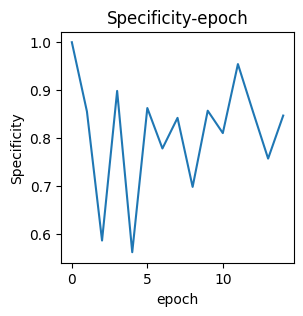

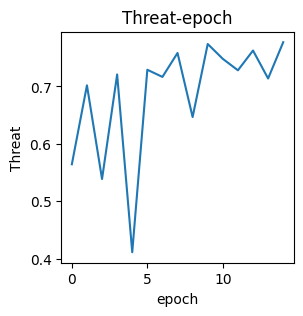

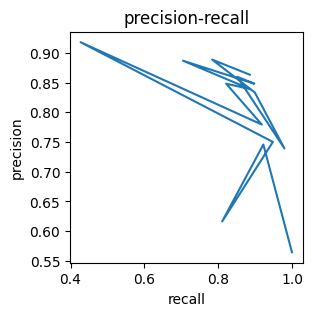

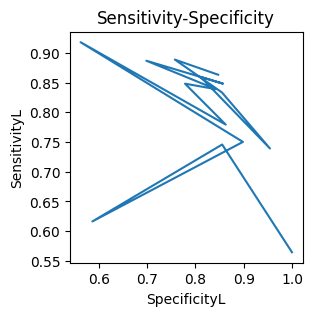

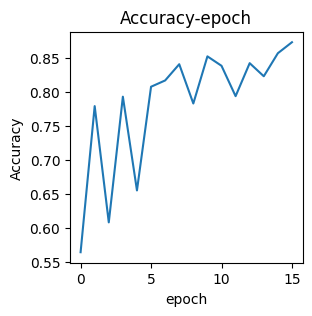

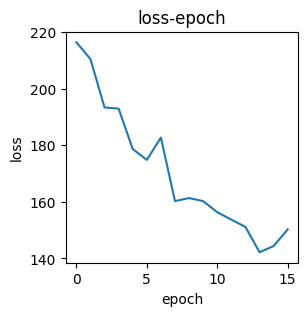

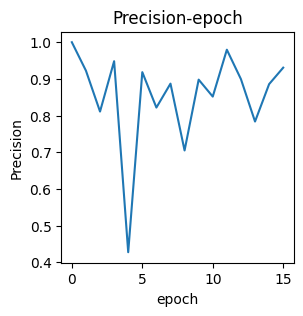

valid epoch[17/70]: 100%|██████████| 326/326 [00:06<00:00, 49.14it/s]
[epoch 17] loss: 0.435  accuracy: 0.860  Precision: 0.958  Recall: 0.822  F1: 0.884978  Sensitivity: 0.822  Specificity: 0.931  Threat: 0.794


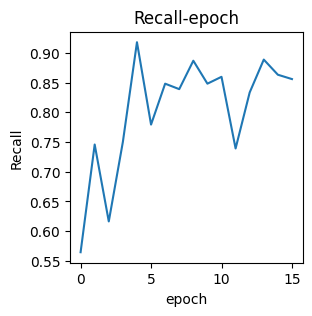

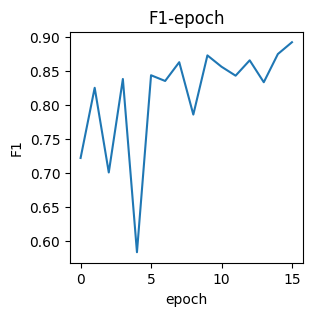

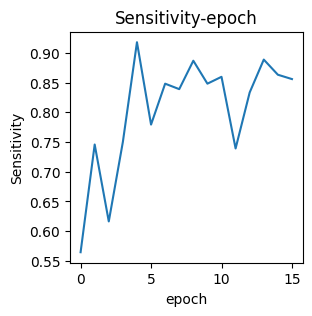

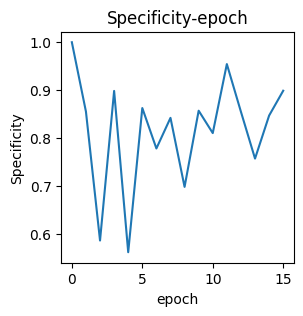

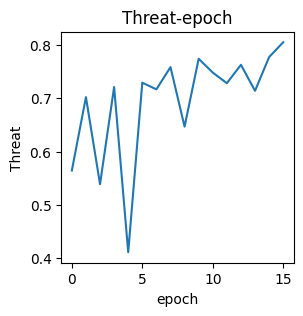

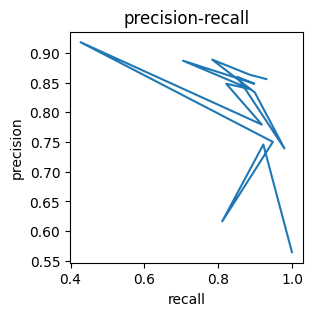

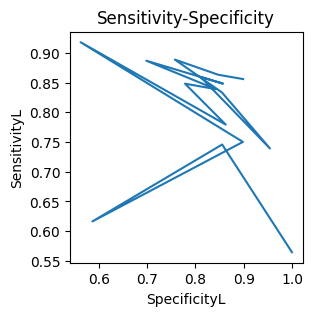

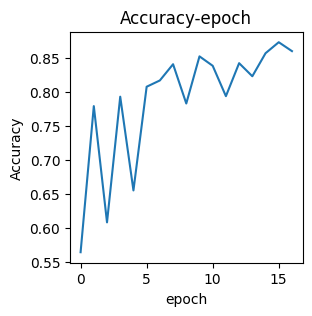

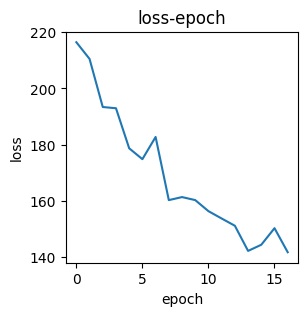

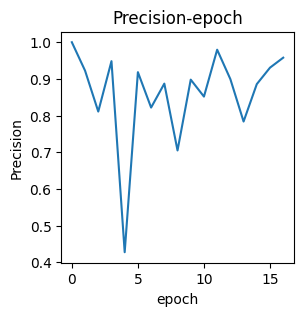

valid epoch[18/70]: 100%|██████████| 326/326 [00:06<00:00, 48.66it/s]
[epoch 18] loss: 0.436  accuracy: 0.854  Precision: 0.901  Recall: 0.850  F1: 0.874505  Sensitivity: 0.850  Specificity: 0.861  Threat: 0.777


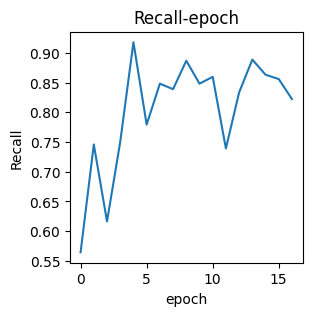

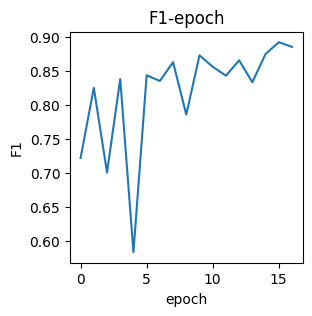

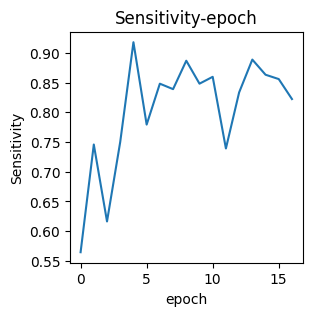

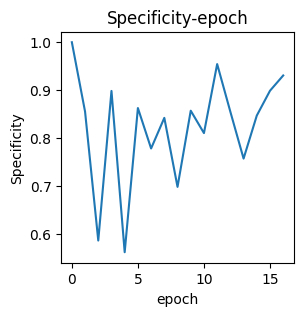

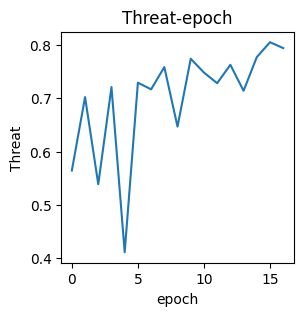

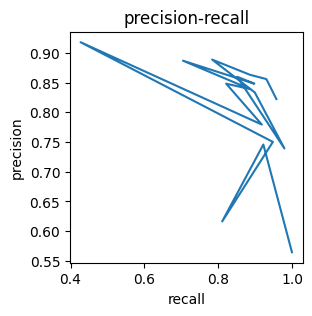

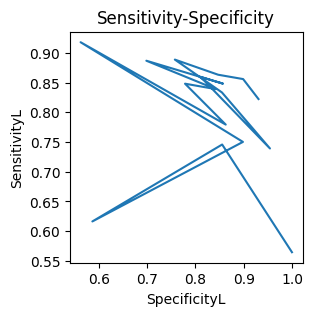

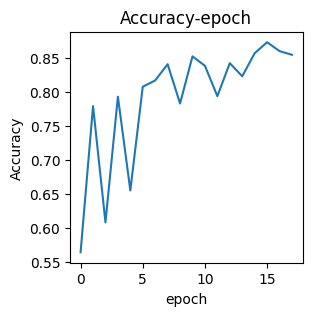

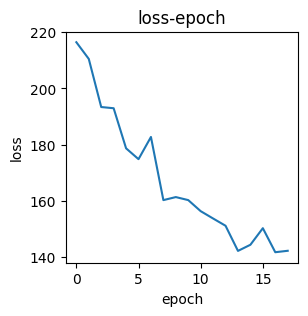

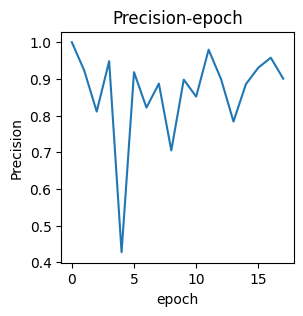

valid epoch[19/70]: 100%|██████████| 326/326 [00:06<00:00, 51.37it/s]
[epoch 19] loss: 0.408  accuracy: 0.850  Precision: 0.857  Recall: 0.874  F1: 0.865385  Sensitivity: 0.874  Specificity: 0.820  Threat: 0.763


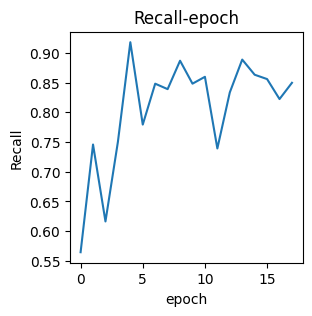

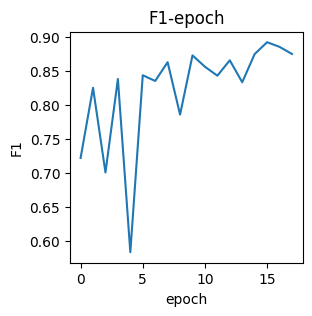

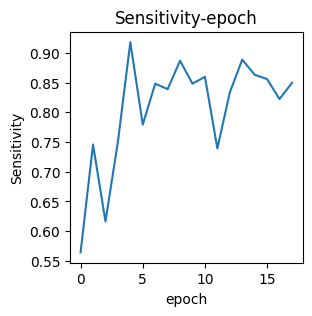

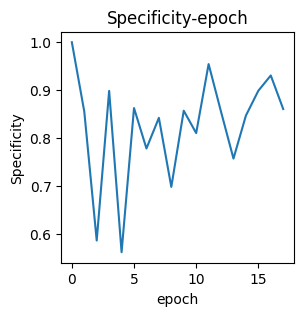

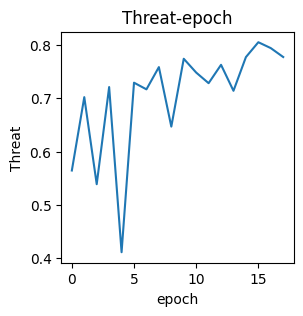

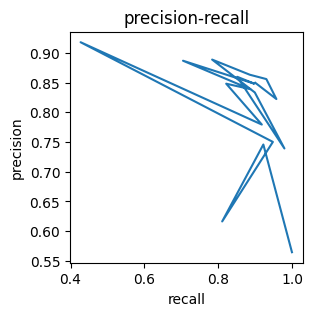

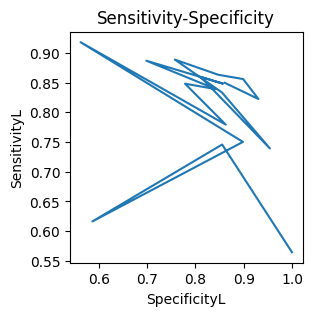

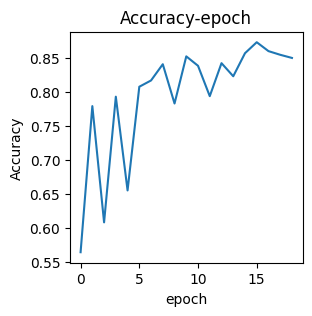

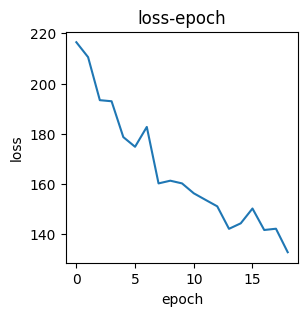

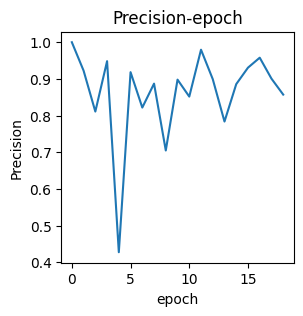

valid epoch[20/70]: 100%|██████████| 326/326 [00:06<00:00, 49.22it/s]
[epoch 20] loss: 0.417  accuracy: 0.843  Precision: 0.978  Recall: 0.792  F1: 0.875228  Sensitivity: 0.792  Specificity: 0.959  Threat: 0.778


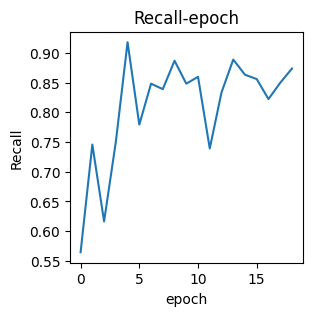

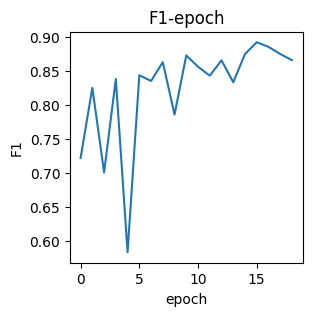

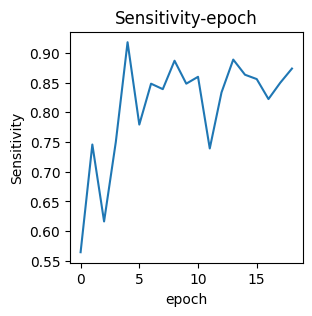

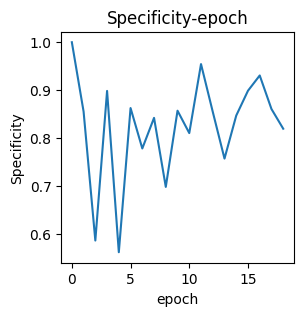

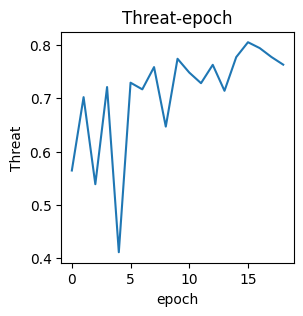

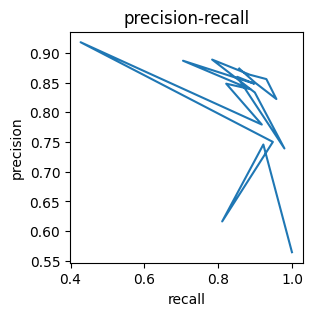

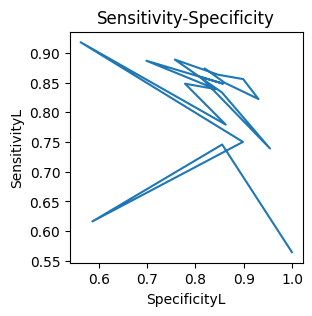

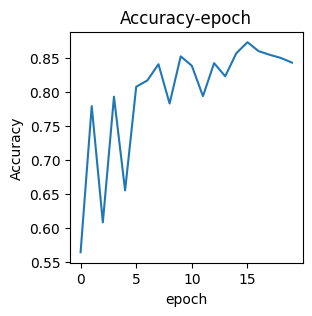

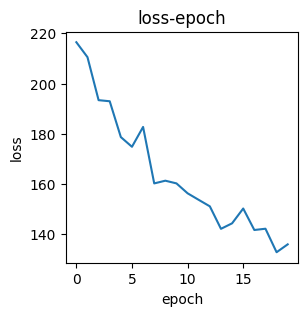

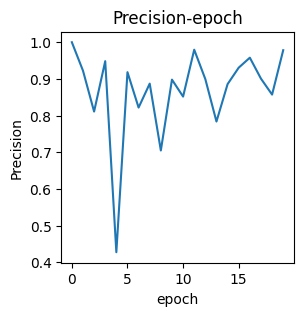

valid epoch[21/70]: 100%|██████████| 326/326 [00:06<00:00, 49.12it/s]
[epoch 21] loss: 0.412  accuracy: 0.857  Precision: 0.899  Recall: 0.855  F1: 0.876658  Sensitivity: 0.855  Specificity: 0.860  Threat: 0.780


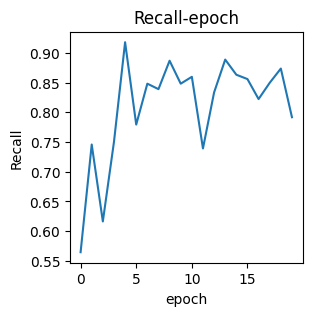

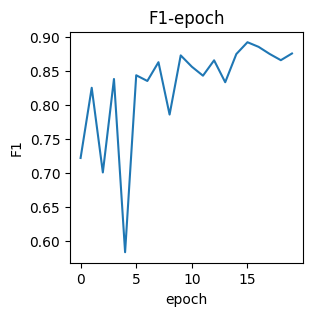

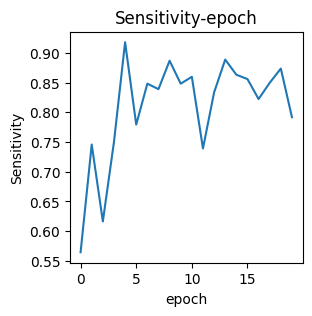

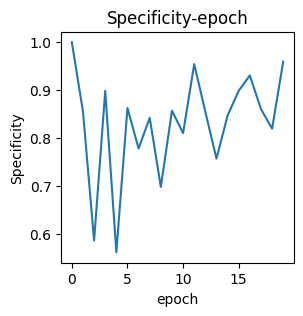

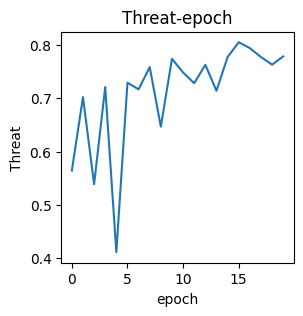

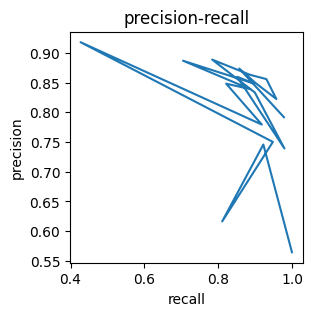

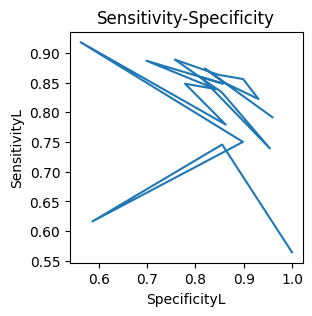

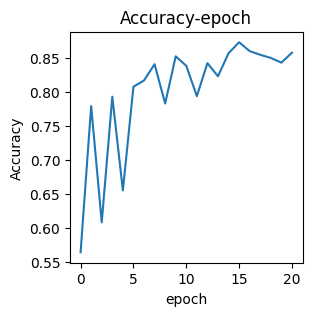

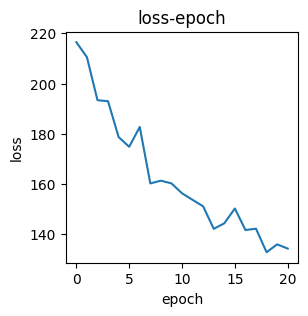

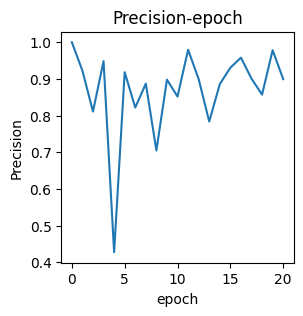

valid epoch[22/70]: 100%|██████████| 326/326 [00:06<00:00, 48.82it/s]
[epoch 22] loss: 0.424  accuracy: 0.863  Precision: 0.943  Recall: 0.836  F1: 0.886189  Sensitivity: 0.836  Specificity: 0.911  Threat: 0.796


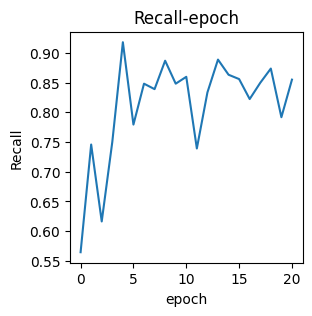

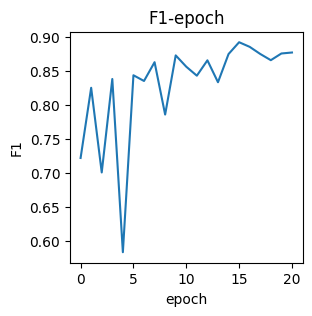

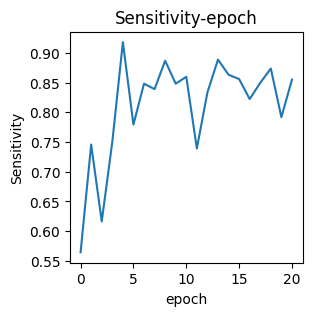

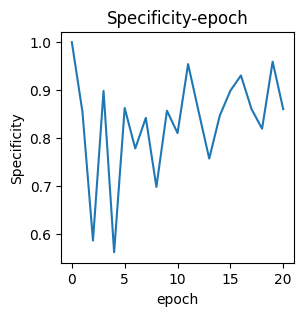

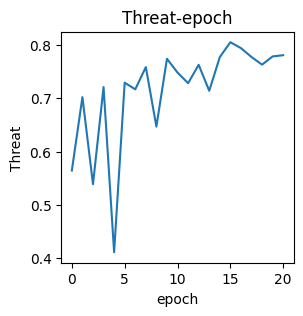

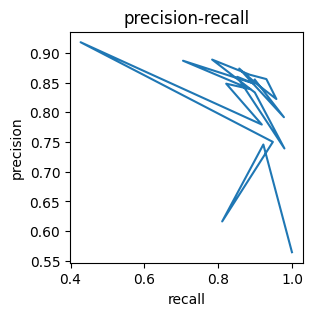

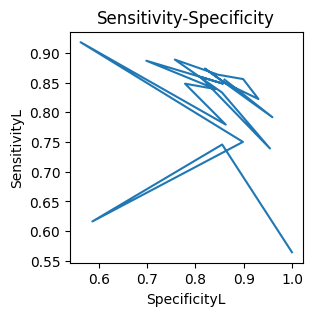

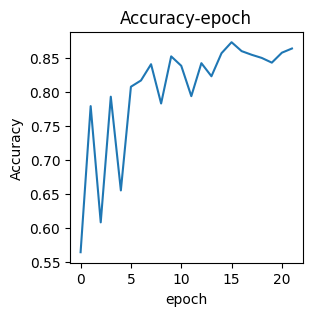

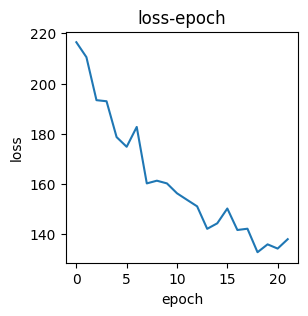

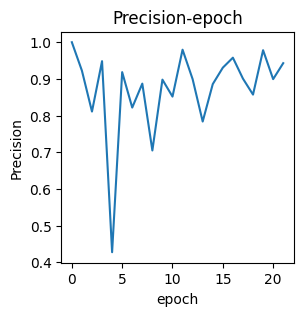

valid epoch[23/70]: 100%|██████████| 326/326 [00:06<00:00, 49.38it/s]
[epoch 23] loss: 0.412  accuracy: 0.813  Precision: 0.992  Recall: 0.754  F1: 0.856639  Sensitivity: 0.754  Specificity: 0.982  Threat: 0.749


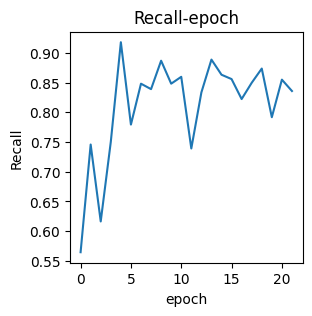

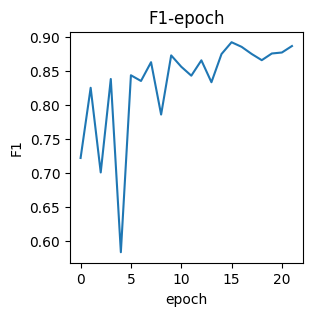

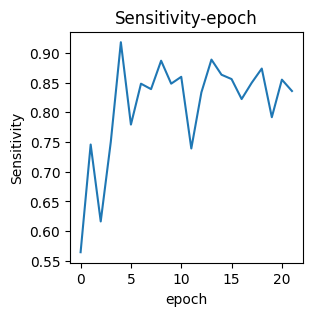

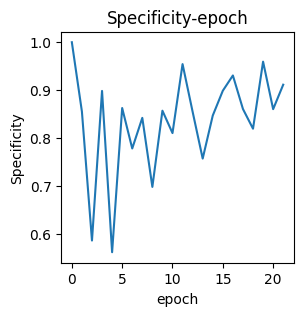

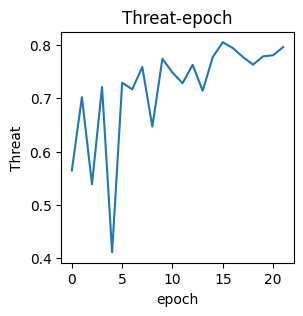

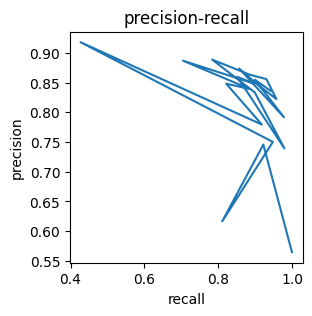

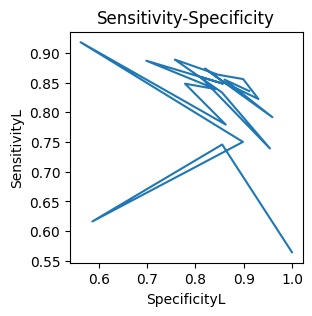

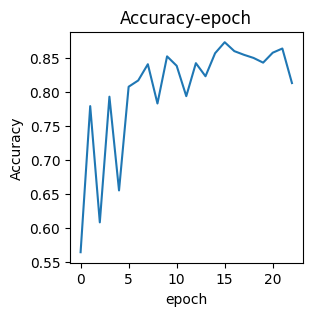

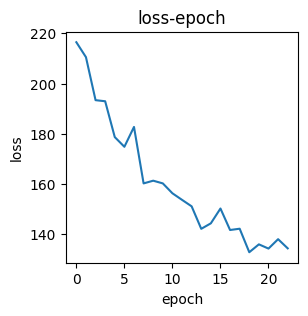

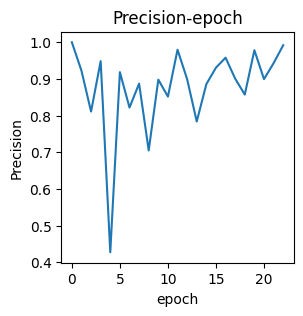

valid epoch[24/70]: 100%|██████████| 326/326 [00:06<00:00, 48.37it/s]
[epoch 24] loss: 0.397  accuracy: 0.814  Precision: 0.988  Recall: 0.757  F1: 0.857143  Sensitivity: 0.757  Specificity: 0.974  Threat: 0.750


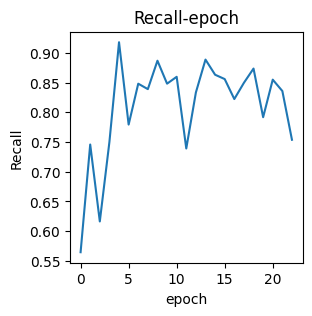

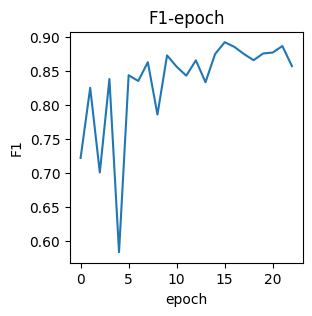

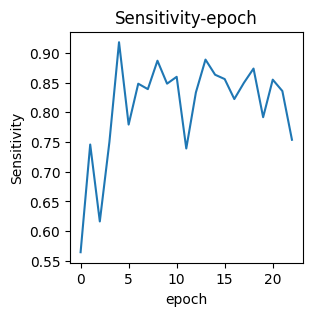

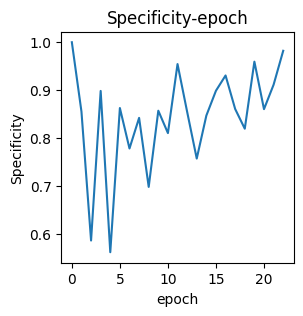

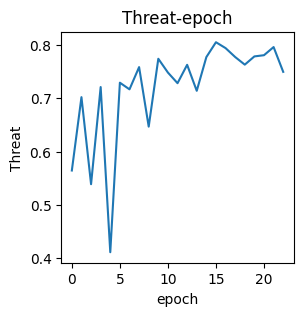

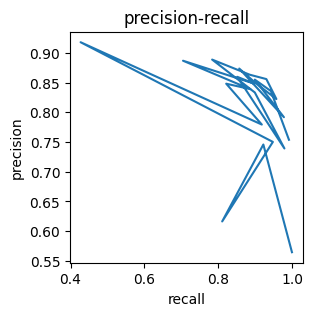

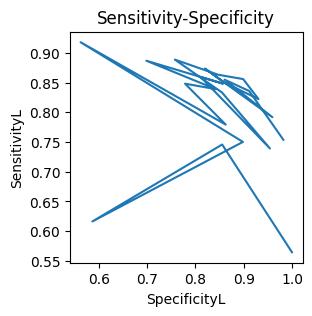

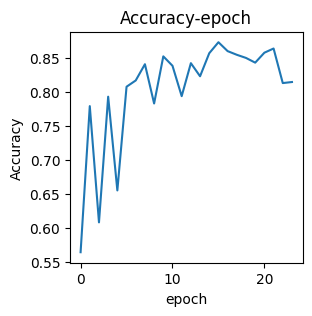

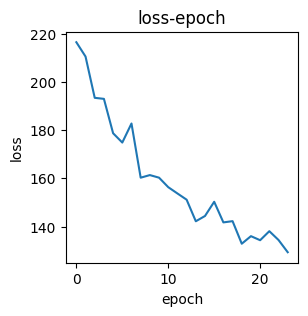

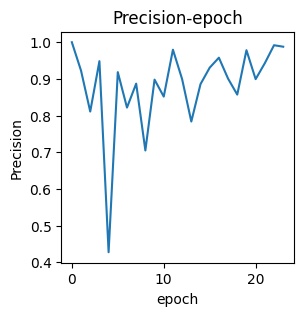

valid epoch[25/70]: 100%|██████████| 326/326 [00:06<00:00, 47.45it/s]
[epoch 25] loss: 0.377  accuracy: 0.869  Precision: 0.897  Recall: 0.874  F1: 0.885158  Sensitivity: 0.874  Specificity: 0.862  Threat: 0.794


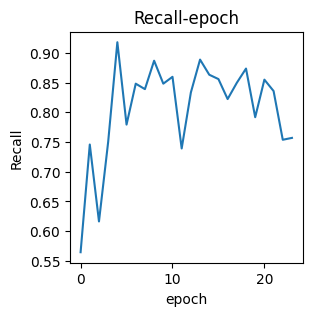

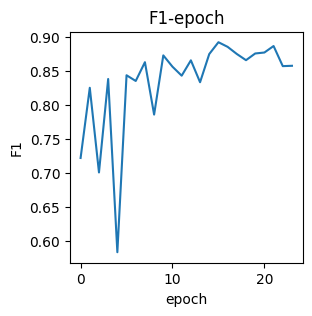

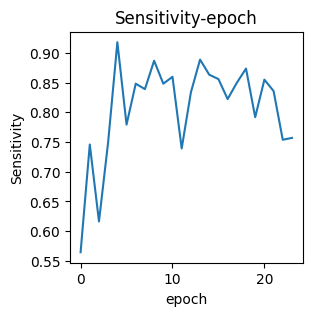

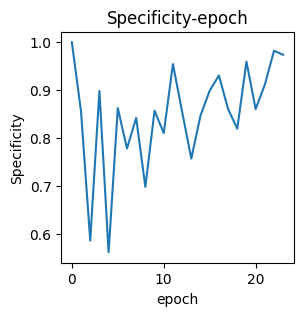

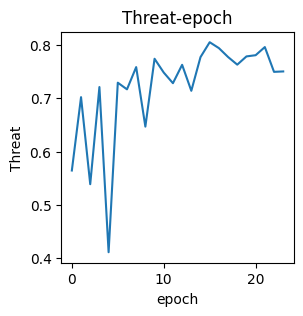

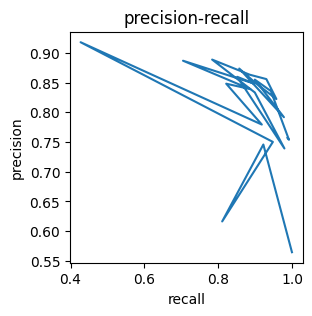

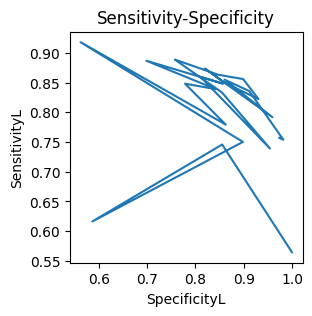

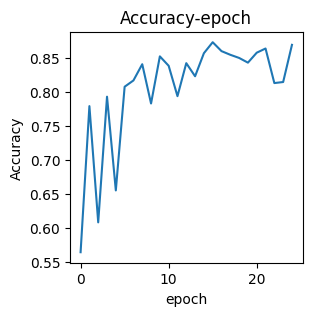

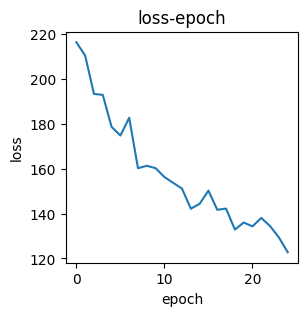

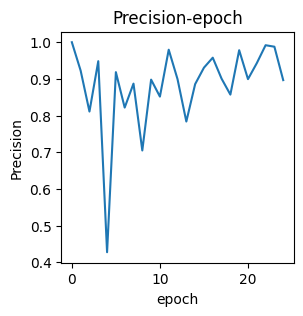

valid epoch[26/70]: 100%|██████████| 326/326 [00:06<00:00, 48.20it/s]
[epoch 26] loss: 0.390  accuracy: 0.861  Precision: 0.969  Recall: 0.818  F1: 0.887227  Sensitivity: 0.818  Specificity: 0.947  Threat: 0.797


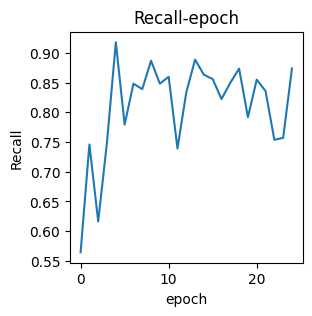

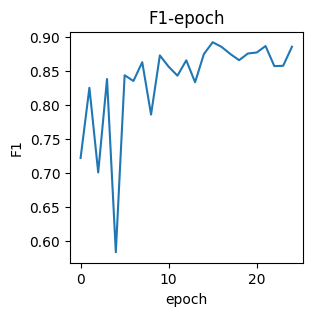

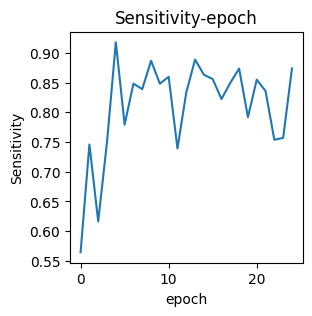

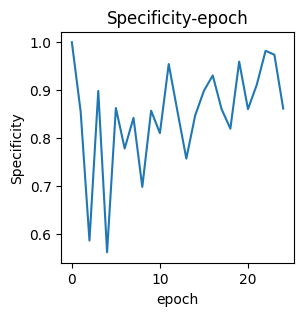

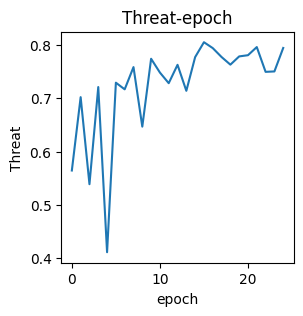

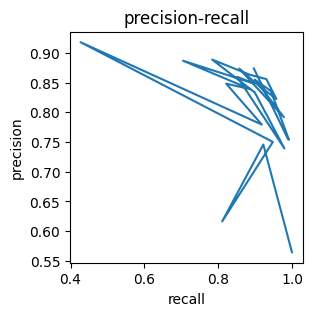

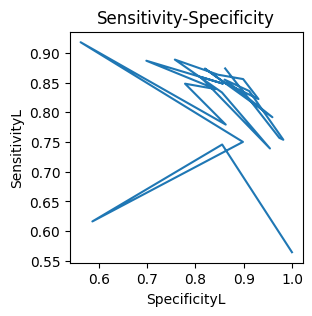

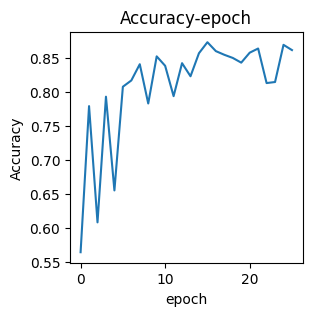

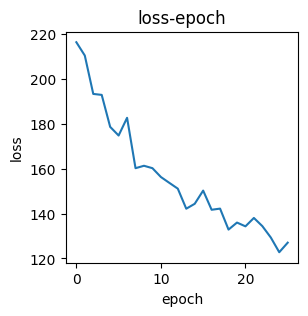

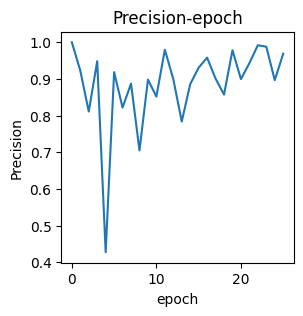

valid epoch[27/70]: 100%|██████████| 326/326 [00:06<00:00, 49.52it/s]
[epoch 27] loss: 0.396  accuracy: 0.860  Precision: 0.952  Recall: 0.826  F1: 0.884956  Sensitivity: 0.826  Specificity: 0.923  Threat: 0.794


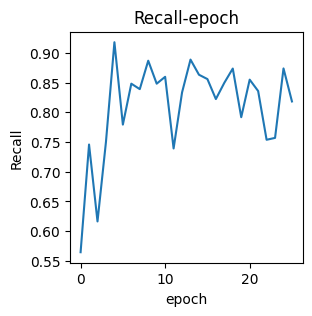

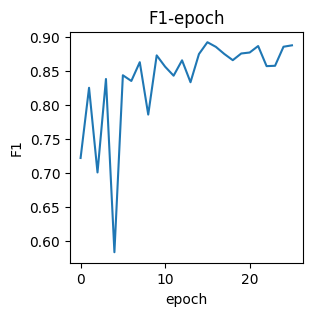

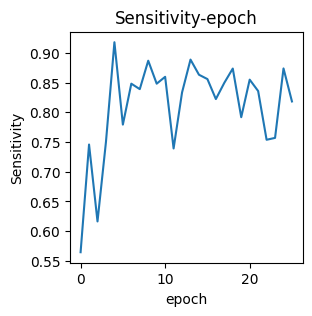

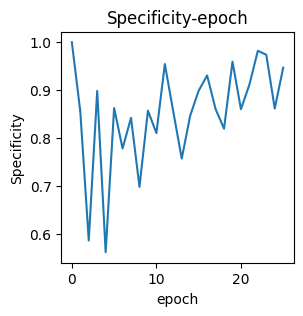

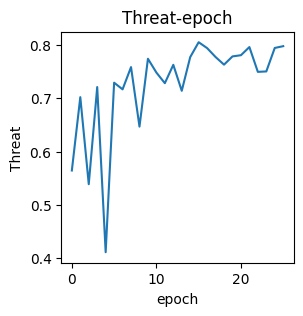

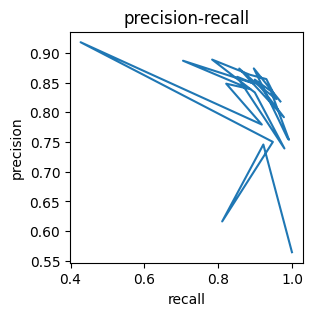

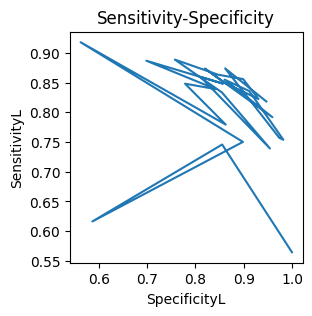

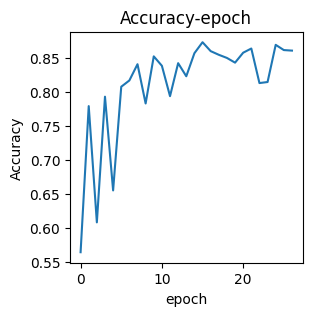

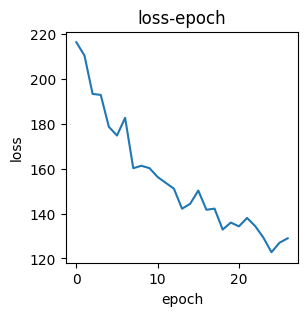

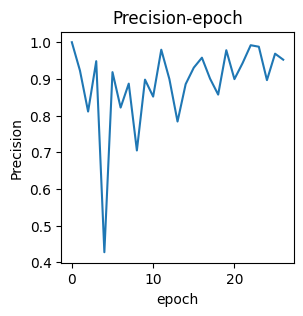

valid epoch[28/70]: 100%|██████████| 326/326 [00:06<00:00, 49.79it/s]
[epoch 28] loss: 0.398  accuracy: 0.861  Precision: 0.990  Recall: 0.807  F1: 0.889432  Sensitivity: 0.807  Specificity: 0.983  Threat: 0.801


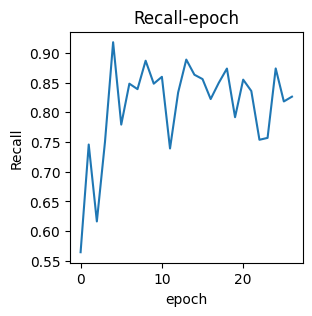

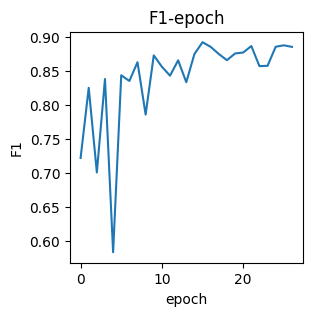

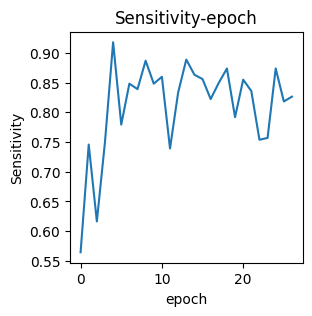

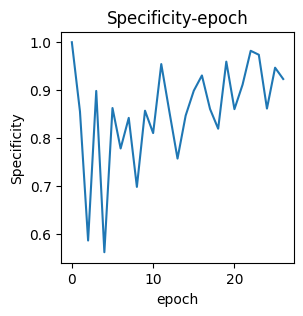

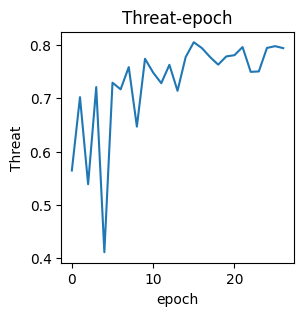

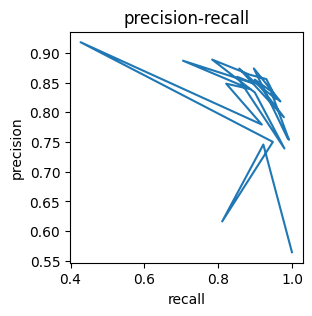

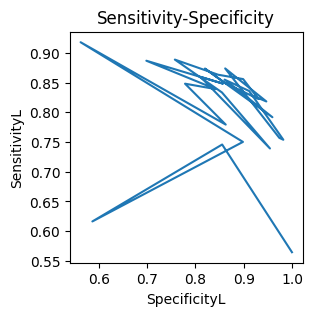

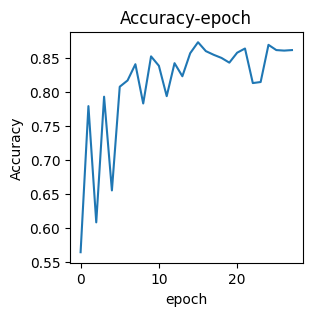

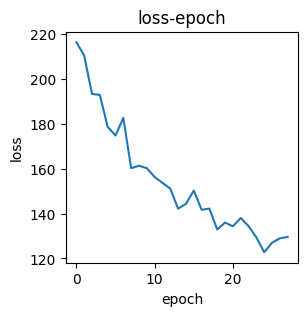

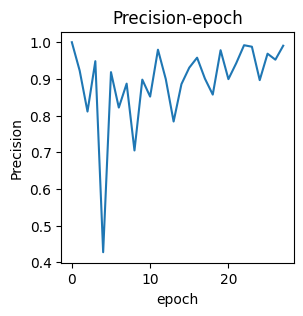

valid epoch[29/70]: 100%|██████████| 326/326 [00:06<00:00, 49.63it/s]
[epoch 29] loss: 0.401  accuracy: 0.903  Precision: 0.971  Recall: 0.872  F1: 0.918919  Sensitivity: 0.872  Specificity: 0.957  Threat: 0.850


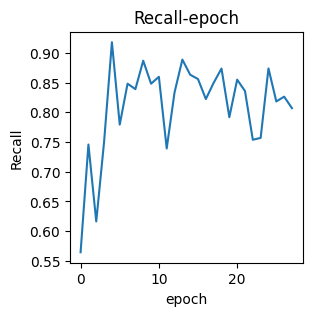

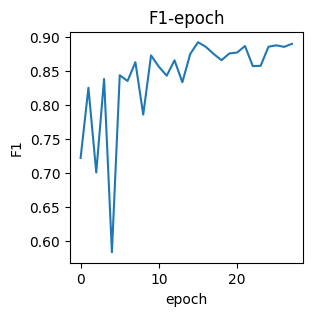

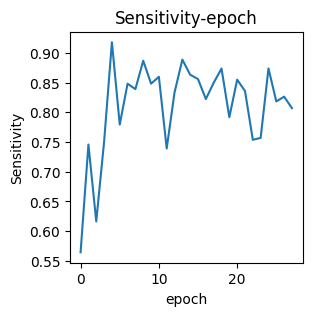

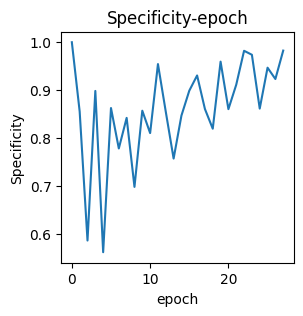

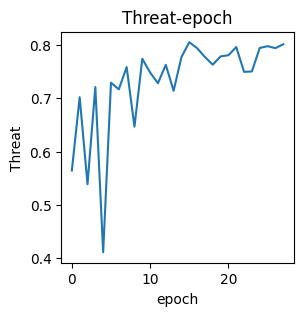

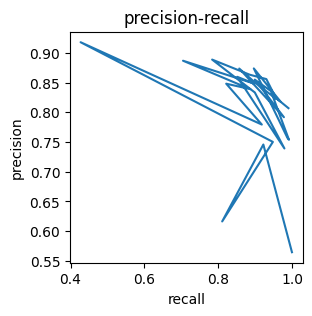

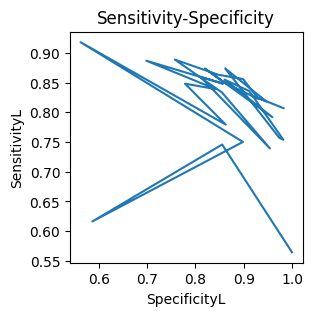

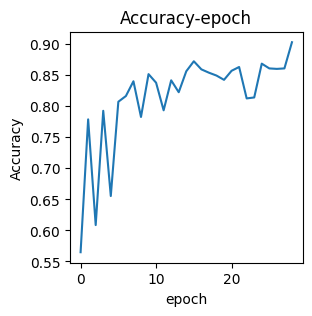

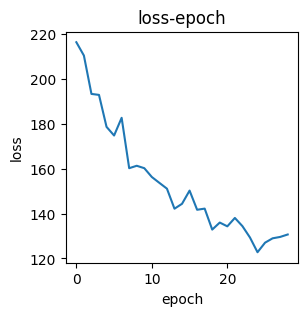

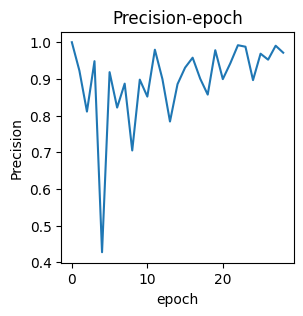

valid epoch[30/70]: 100%|██████████| 326/326 [00:06<00:00, 49.04it/s]
[epoch 30] loss: 0.394  accuracy: 0.896  Precision: 0.959  Recall: 0.869  F1: 0.912031  Sensitivity: 0.869  Specificity: 0.939  Threat: 0.838


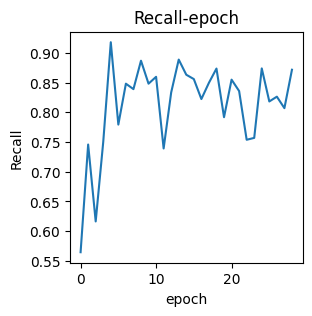

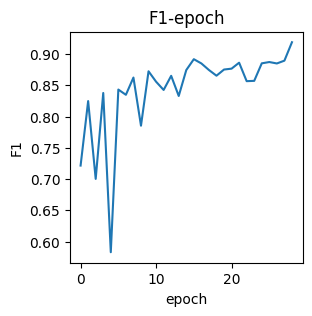

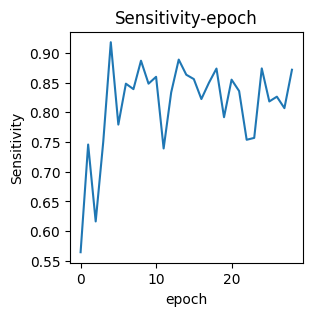

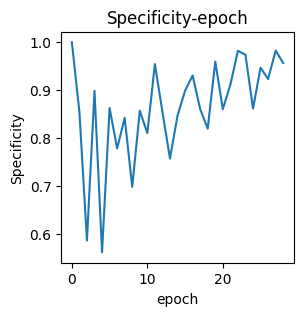

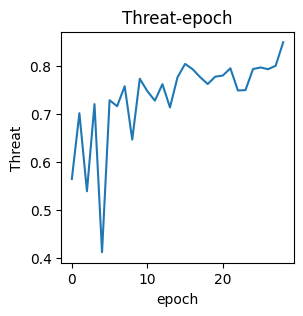

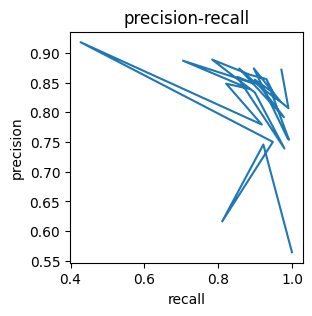

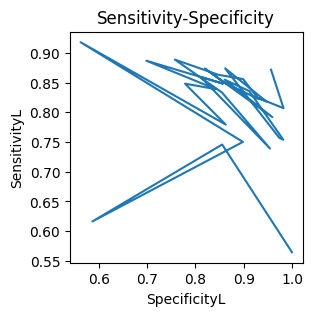

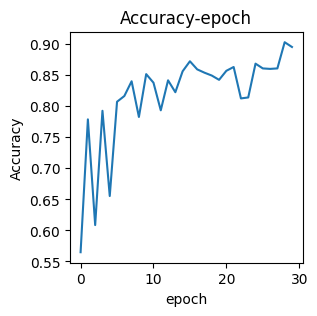

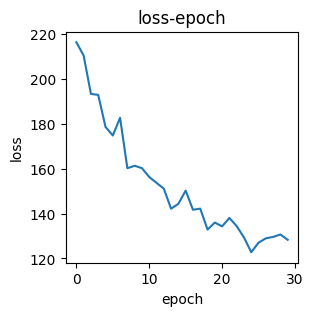

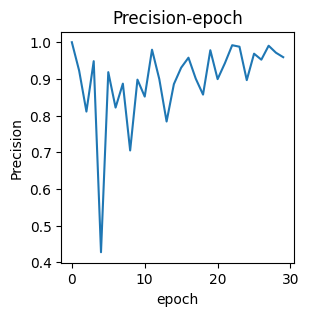

valid epoch[31/70]: 100%|██████████| 326/326 [00:06<00:00, 50.14it/s]
[epoch 31] loss: 0.333  accuracy: 0.848  Precision: 0.888  Recall: 0.849  F1: 0.868351  Sensitivity: 0.849  Specificity: 0.846  Threat: 0.767


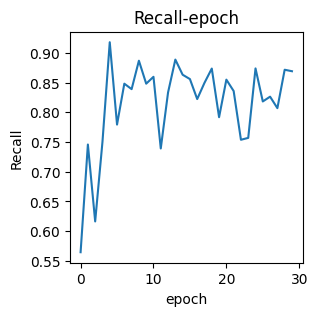

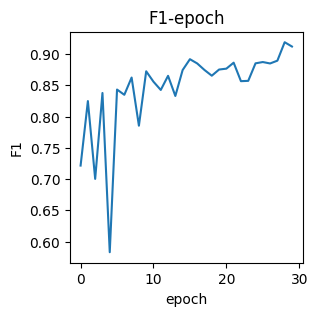

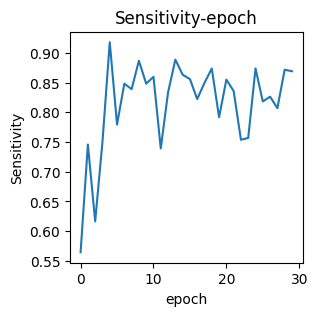

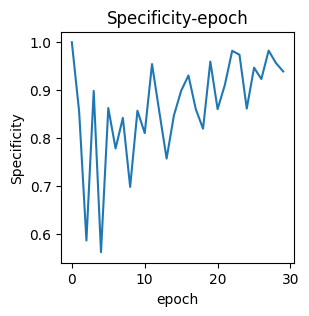

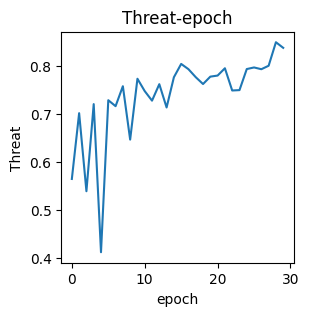

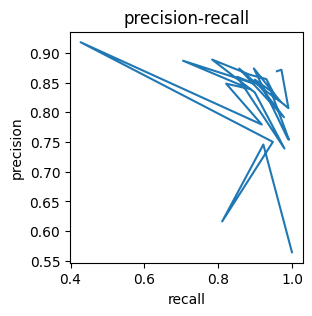

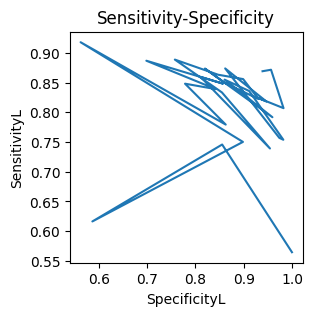

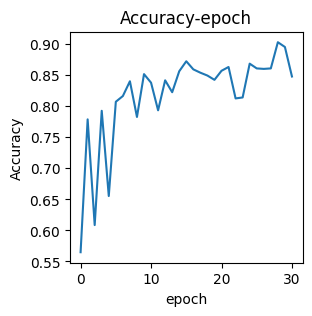

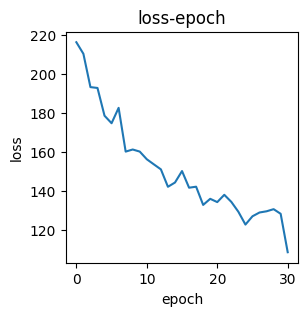

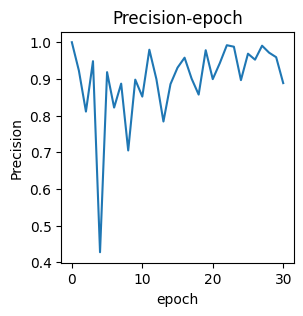

valid epoch[32/70]: 100%|██████████| 326/326 [00:06<00:00, 48.73it/s]
[epoch 32] loss: 0.364  accuracy: 0.893  Precision: 0.969  Recall: 0.859  F1: 0.910486  Sensitivity: 0.859  Specificity: 0.951  Threat: 0.836


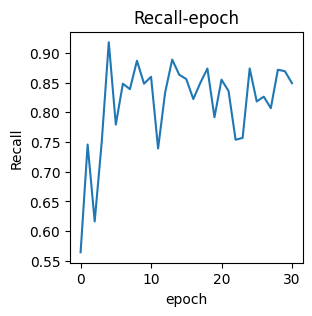

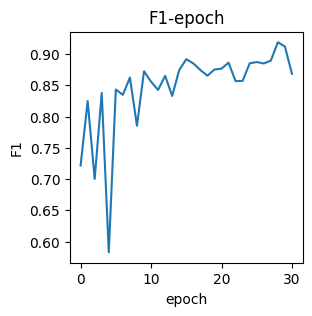

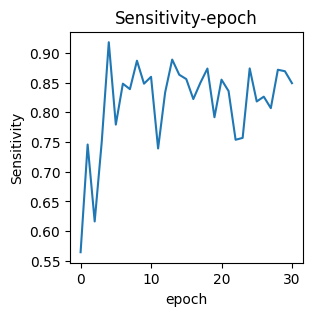

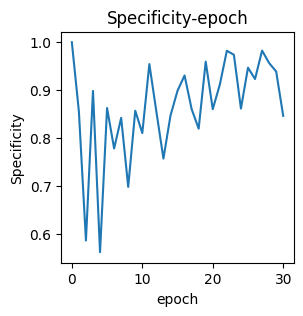

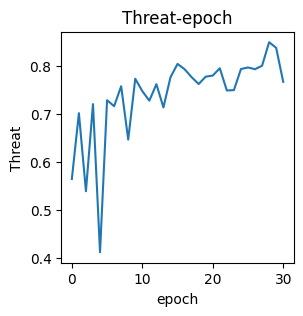

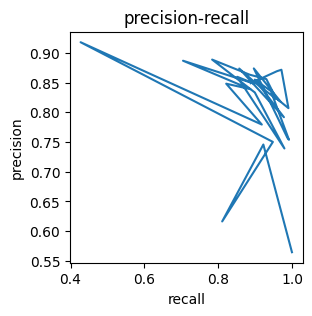

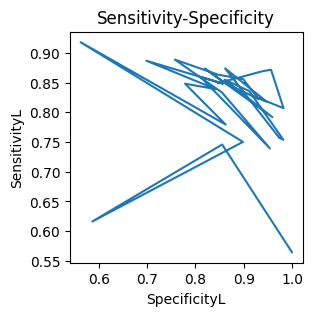

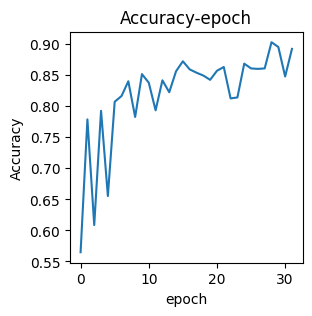

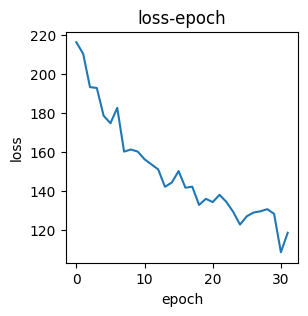

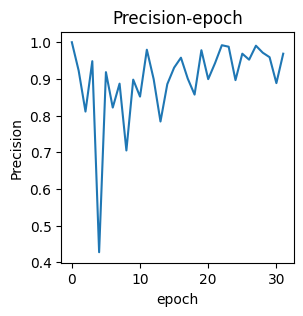

valid epoch[33/70]: 100%|██████████| 326/326 [00:06<00:00, 49.84it/s]
[epoch 33] loss: 0.336  accuracy: 0.929  Precision: 0.951  Recall: 0.926  F1: 0.938255  Sensitivity: 0.926  Specificity: 0.934  Threat: 0.884


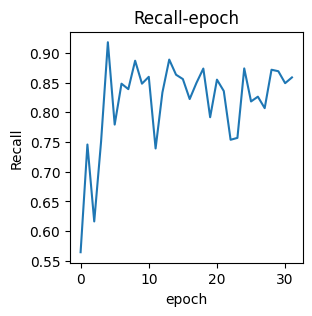

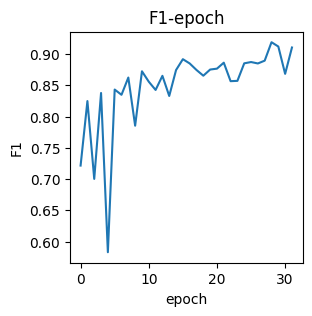

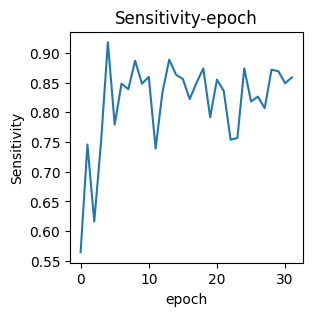

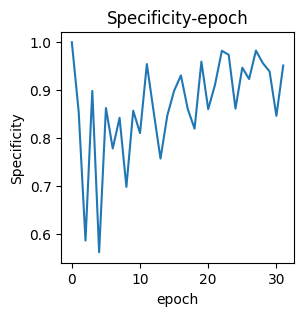

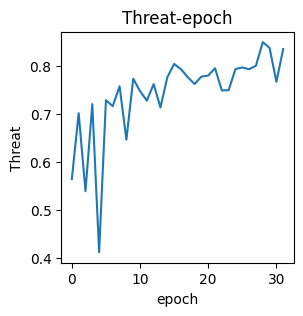

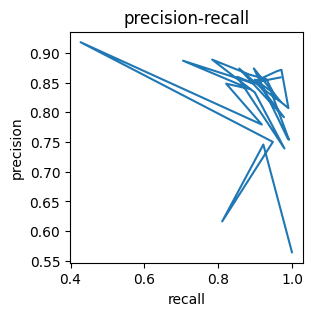

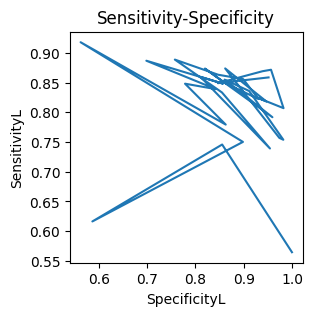

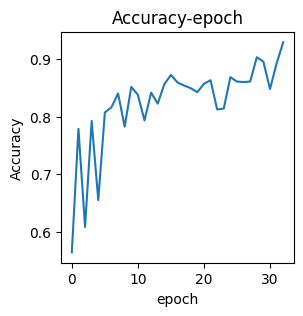

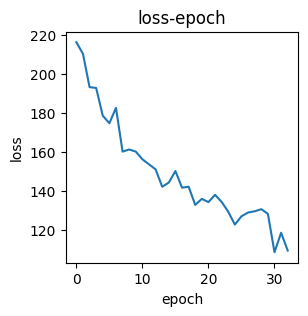

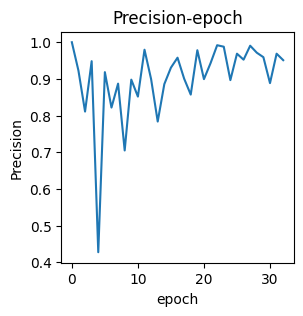

valid epoch[34/70]: 100%|██████████| 326/326 [00:06<00:00, 50.34it/s]
[epoch 34] loss: 0.337  accuracy: 0.873  Precision: 0.996  Recall: 0.819  F1: 0.898711  Sensitivity: 0.819  Specificity: 0.993  Threat: 0.816


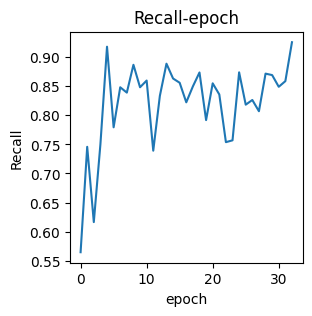

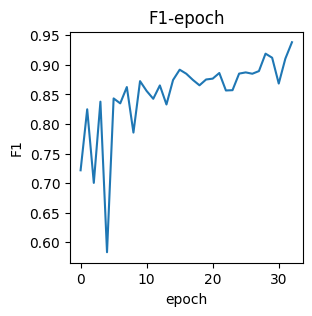

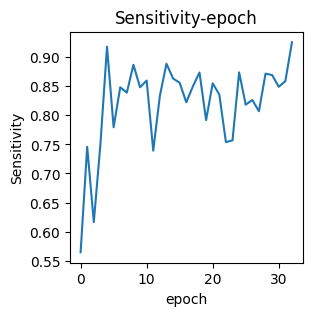

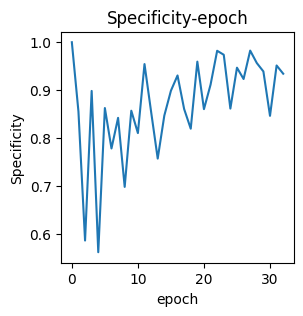

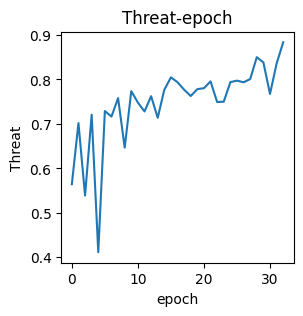

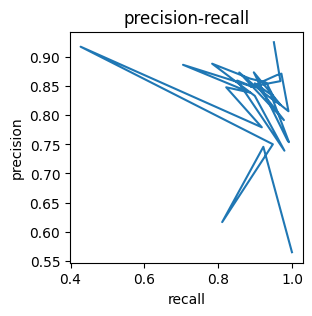

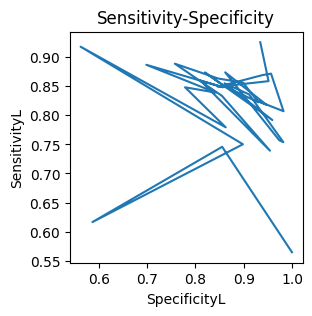

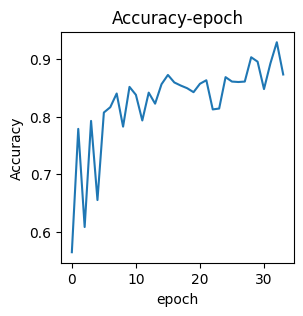

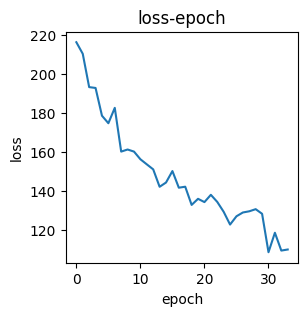

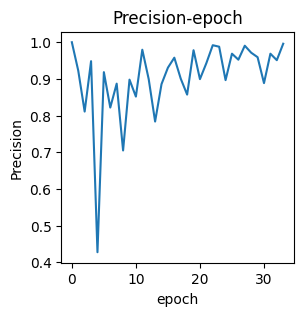

valid epoch[35/70]: 100%|██████████| 326/326 [00:06<00:00, 49.19it/s]
[epoch 35] loss: 0.370  accuracy: 0.811  Precision: 0.993  Recall: 0.752  F1: 0.855803  Sensitivity: 0.752  Specificity: 0.985  Threat: 0.748


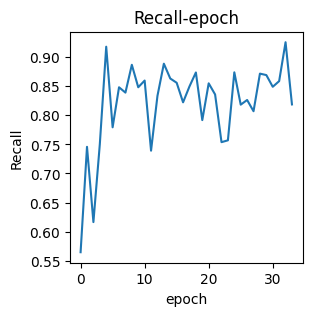

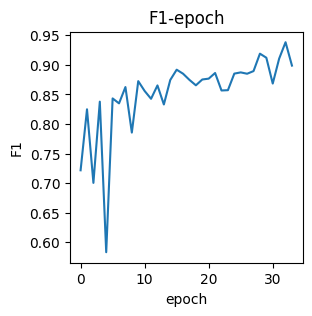

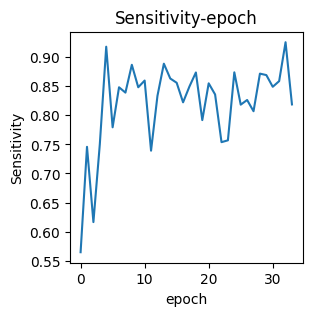

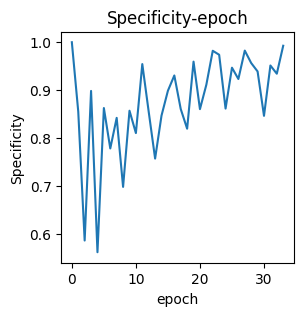

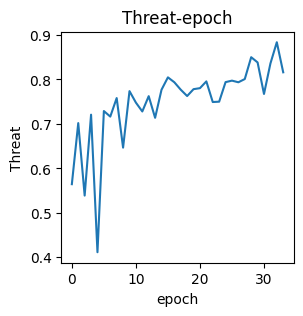

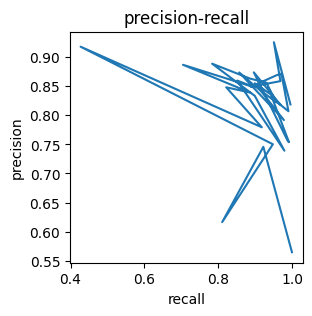

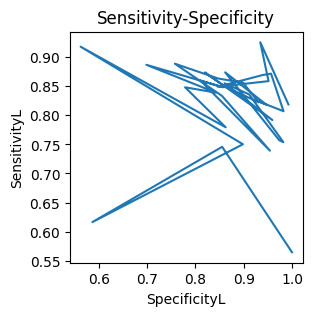

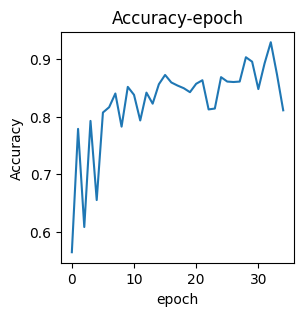

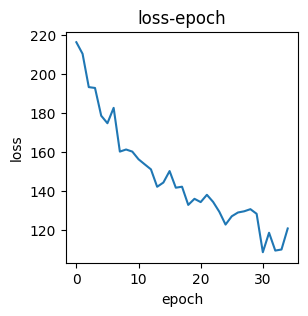

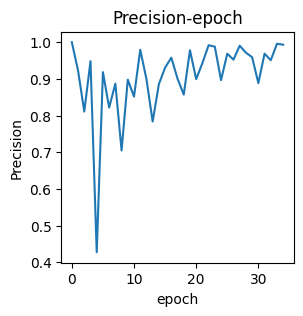

valid epoch[36/70]: 100%|██████████| 326/326 [00:06<00:00, 49.39it/s]
[epoch 36] loss: 0.319  accuracy: 0.850  Precision: 0.993  Recall: 0.793  F1: 0.882175  Sensitivity: 0.793  Specificity: 0.987  Threat: 0.789


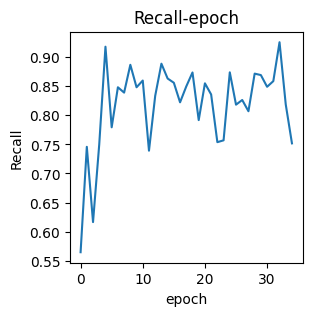

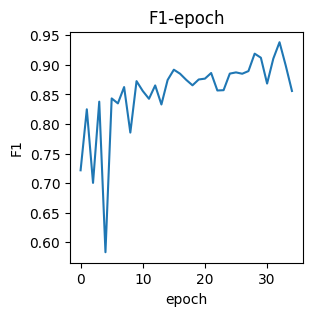

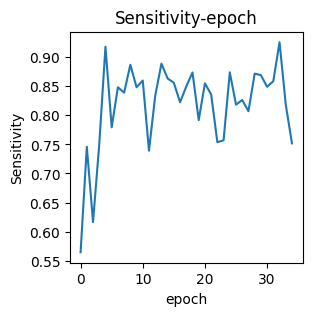

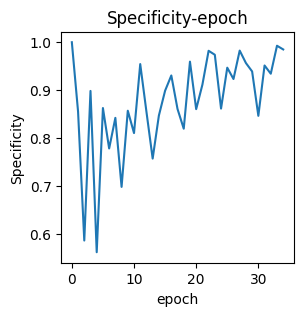

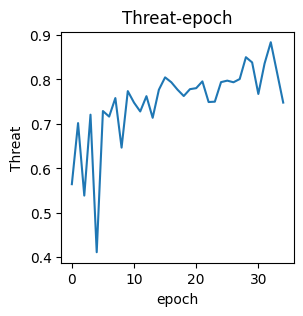

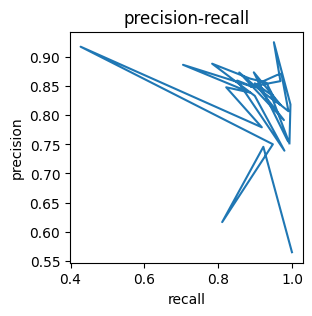

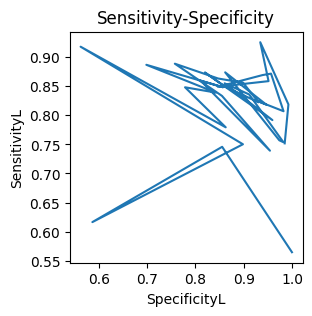

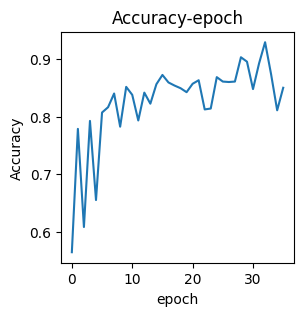

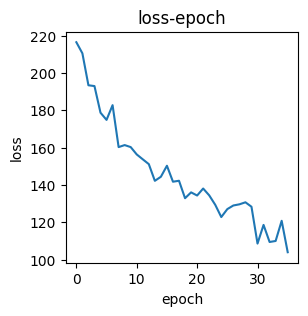

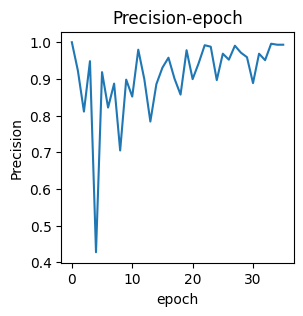

valid epoch[37/70]: 100%|██████████| 326/326 [00:06<00:00, 49.54it/s]
[epoch 37] loss: 0.336  accuracy: 0.817  Precision: 0.990  Recall: 0.758  F1: 0.858997  Sensitivity: 0.758  Specificity: 0.980  Threat: 0.753


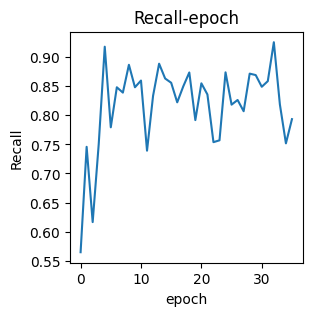

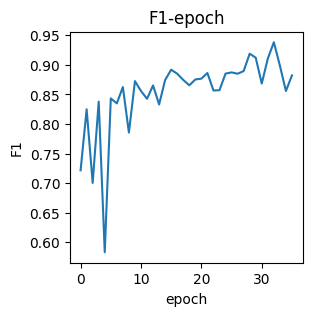

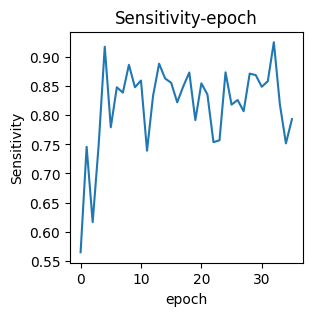

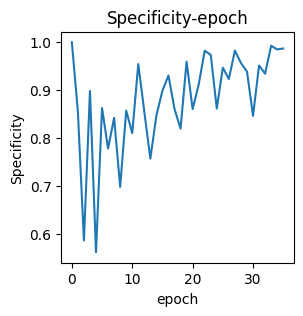

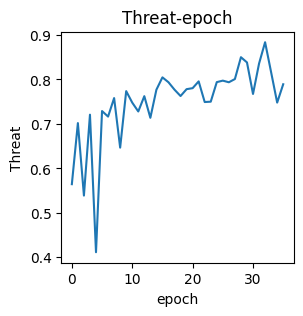

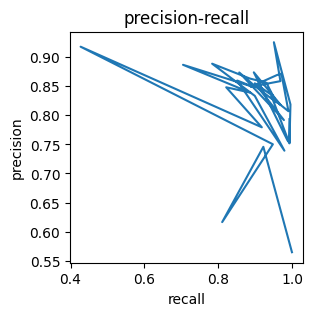

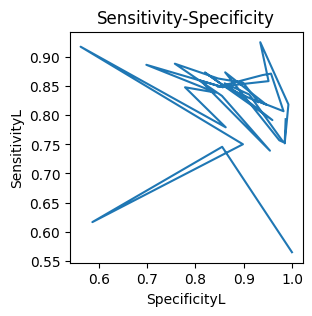

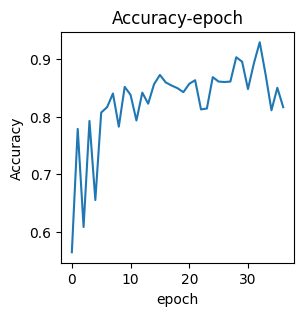

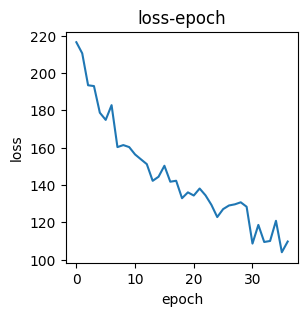

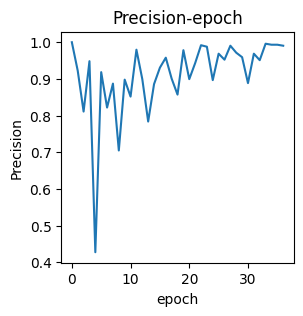

valid epoch[38/70]: 100%|██████████| 326/326 [00:06<00:00, 50.17it/s]
[epoch 38] loss: 0.288  accuracy: 0.942  Precision: 0.965  Recall: 0.934  F1: 0.949130  Sensitivity: 0.934  Specificity: 0.952  Threat: 0.903


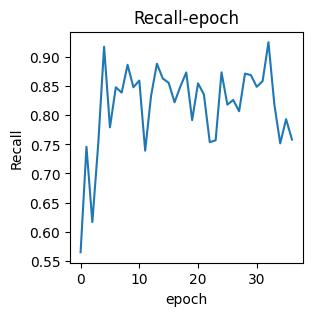

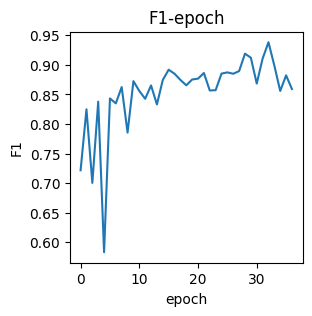

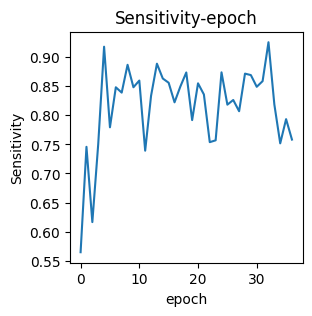

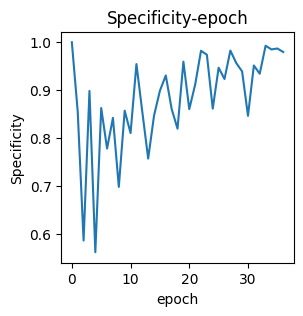

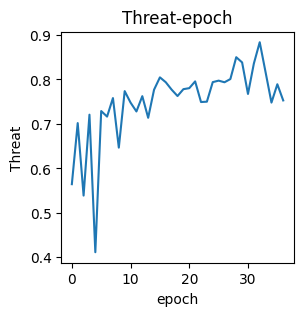

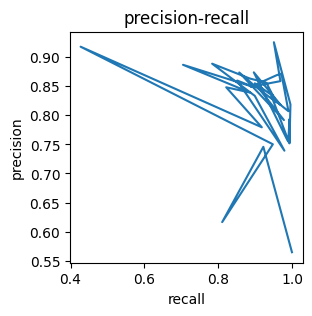

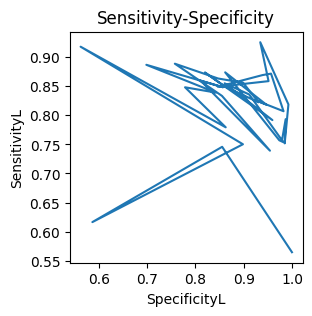

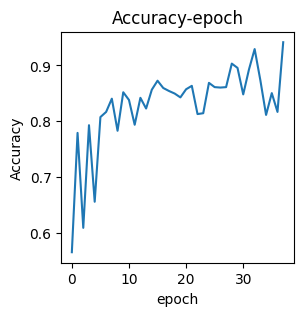

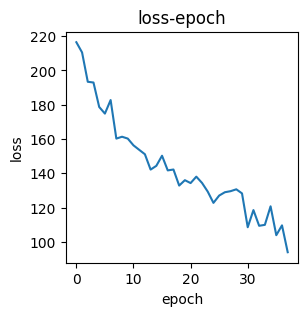

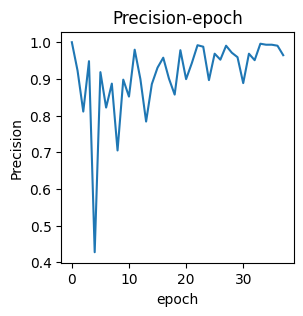

valid epoch[39/70]: 100%|██████████| 326/326 [00:06<00:00, 50.21it/s]
[epoch 39] loss: 0.322  accuracy: 0.889  Precision: 0.867  Recall: 0.933  F1: 0.898449  Sensitivity: 0.933  Specificity: 0.842  Threat: 0.816


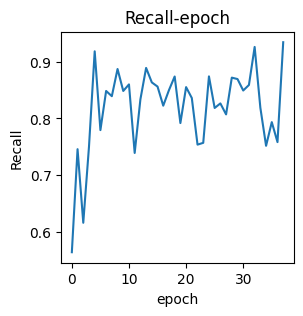

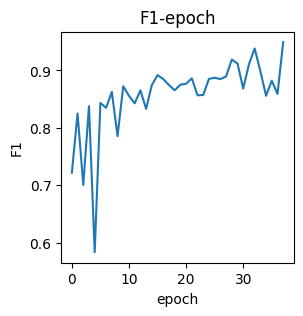

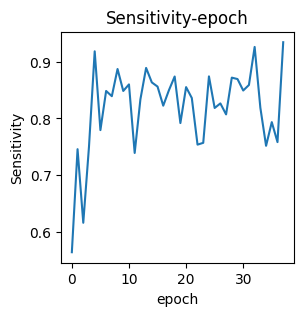

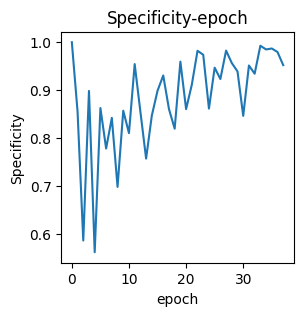

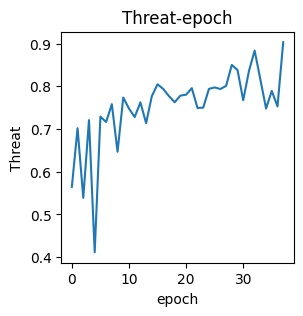

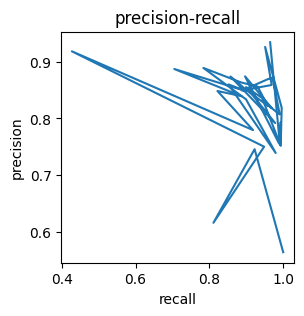

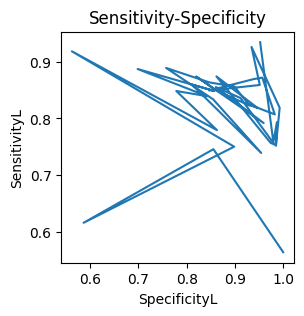

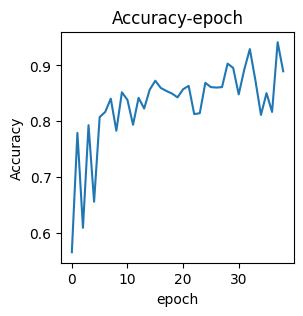

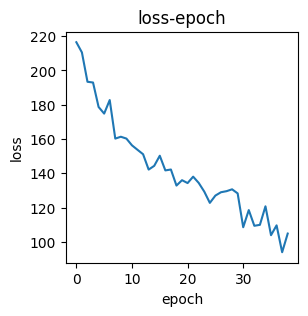

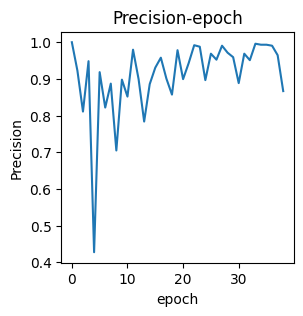

valid epoch[40/70]: 100%|██████████| 326/326 [00:06<00:00, 47.93it/s]
[epoch 40] loss: 0.316  accuracy: 0.934  Precision: 0.958  Recall: 0.928  F1: 0.942436  Sensitivity: 0.928  Specificity: 0.943  Threat: 0.891


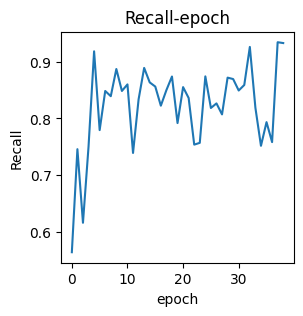

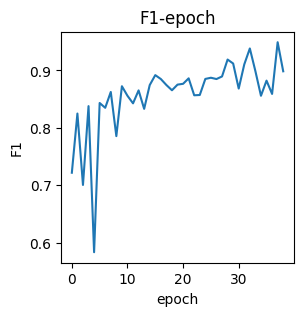

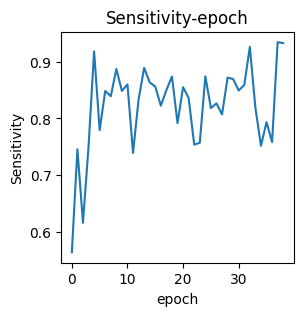

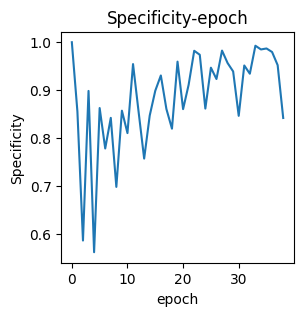

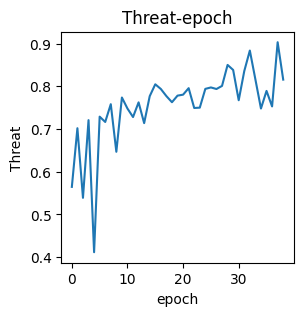

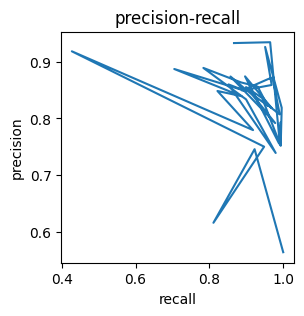

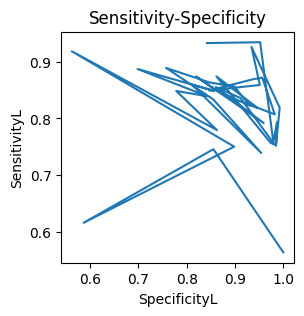

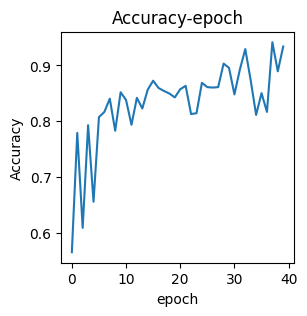

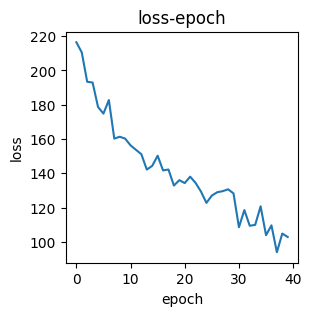

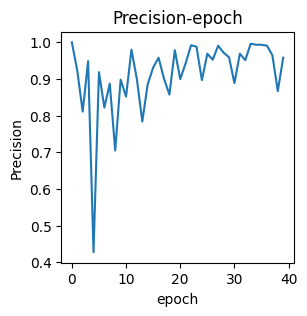

valid epoch[41/70]: 100%|██████████| 326/326 [00:06<00:00, 48.79it/s]
[epoch 41] loss: 0.317  accuracy: 0.919  Precision: 0.984  Recall: 0.886  F1: 0.932302  Sensitivity: 0.886  Specificity: 0.975  Threat: 0.873


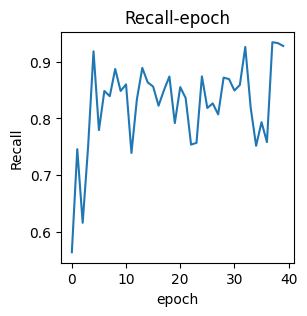

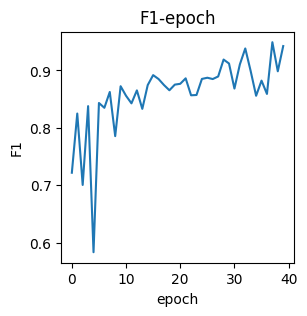

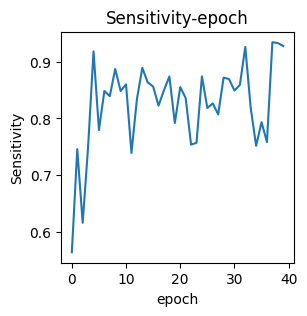

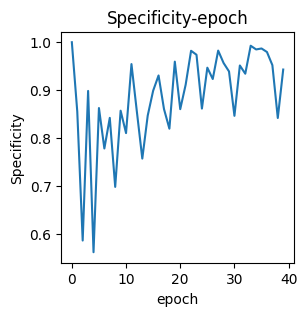

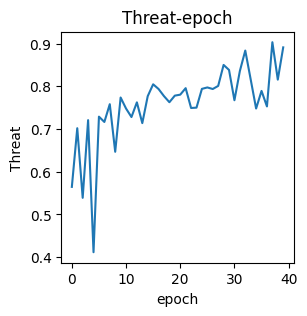

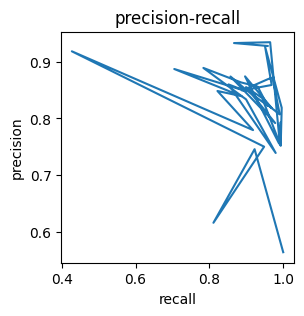

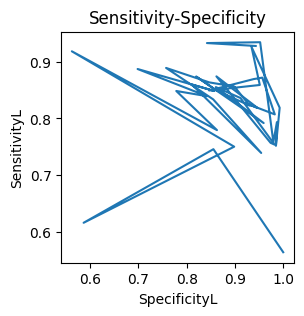

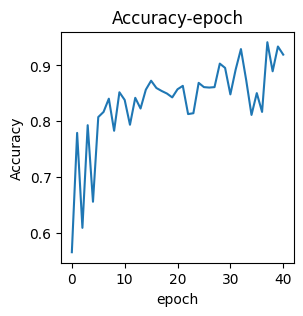

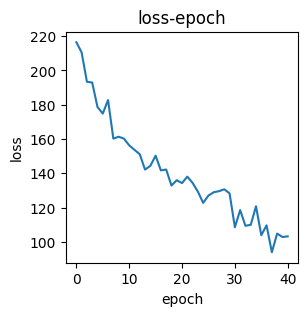

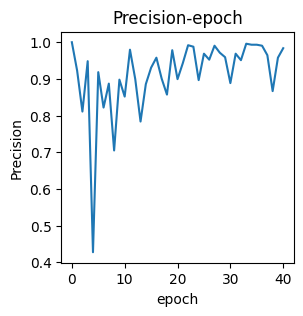

valid epoch[42/70]: 100%|██████████| 326/326 [00:06<00:00, 48.39it/s]
[epoch 42] loss: 0.320  accuracy: 0.929  Precision: 0.966  Recall: 0.913  F1: 0.938533  Sensitivity: 0.913  Specificity: 0.952  Threat: 0.884


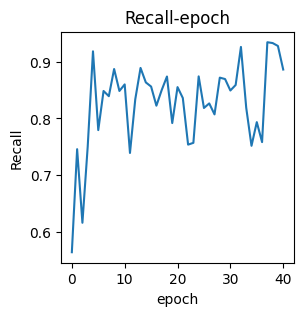

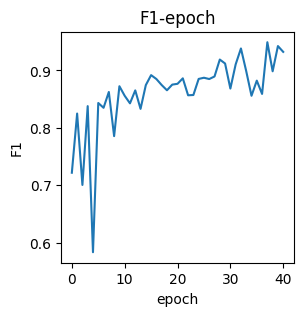

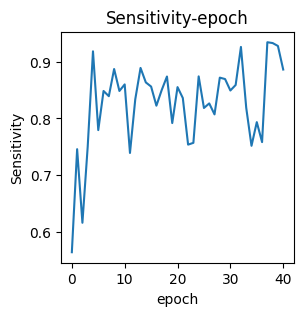

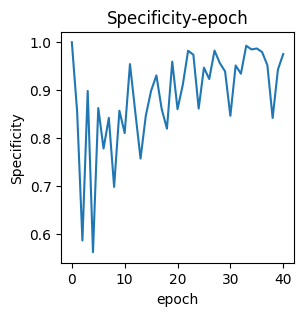

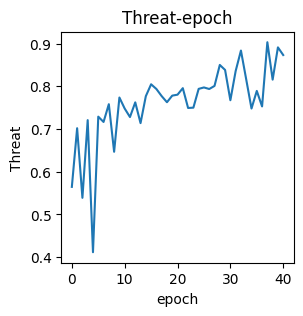

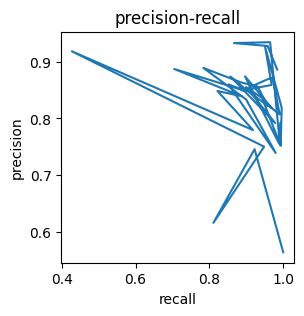

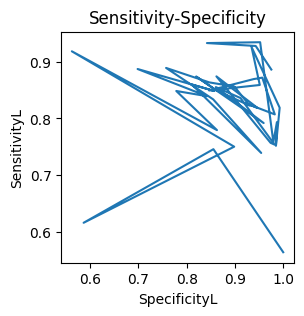

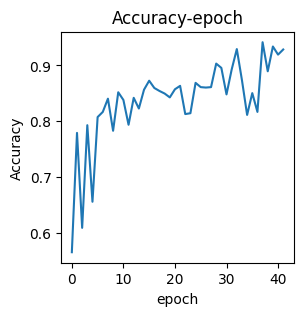

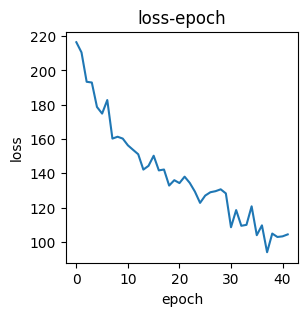

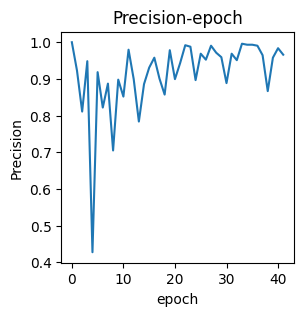

valid epoch[43/70]: 100%|██████████| 326/326 [00:06<00:00, 50.54it/s]
[epoch 43] loss: 0.304  accuracy: 0.911  Precision: 0.978  Recall: 0.878  F1: 0.925354  Sensitivity: 0.878  Specificity: 0.967  Threat: 0.861


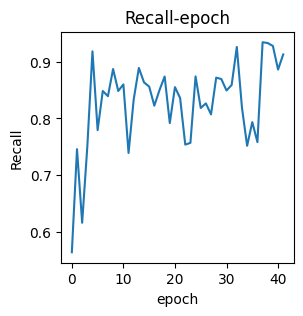

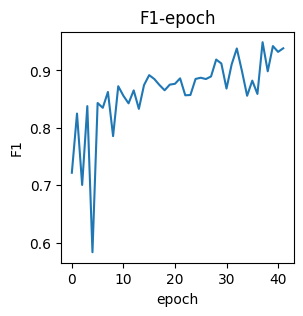

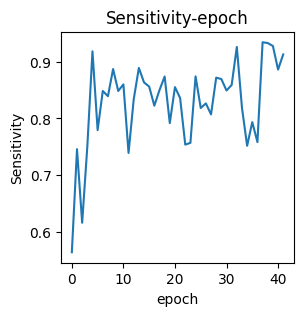

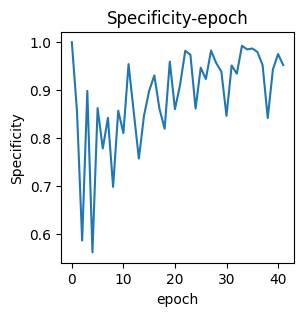

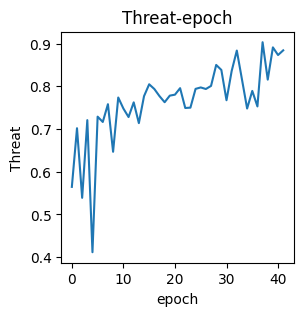

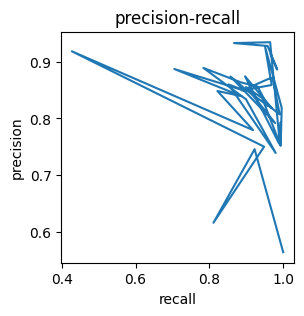

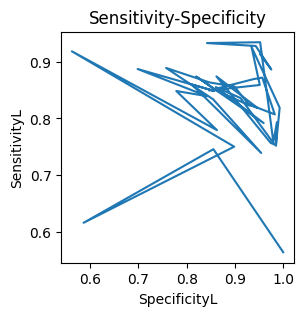

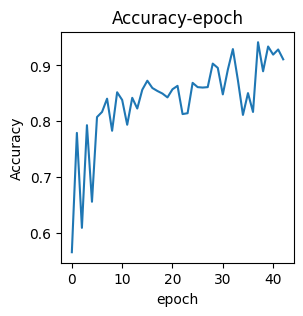

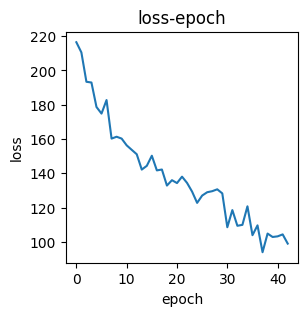

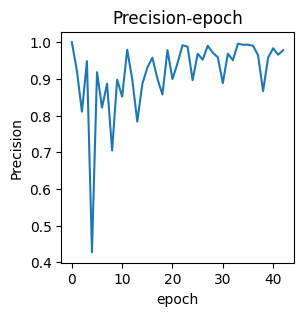

valid epoch[44/70]: 100%|██████████| 326/326 [00:06<00:00, 49.42it/s]
[epoch 44] loss: 0.328  accuracy: 0.905  Precision: 0.988  Recall: 0.863  F1: 0.921320  Sensitivity: 0.863  Specificity: 0.981  Threat: 0.854


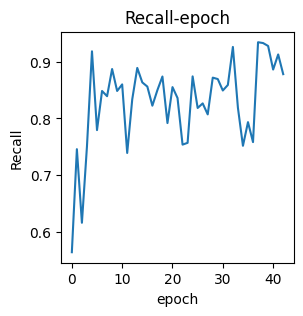

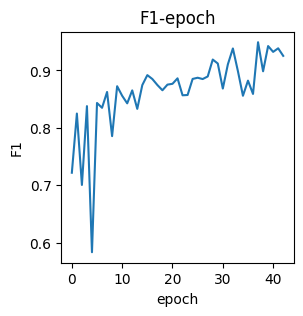

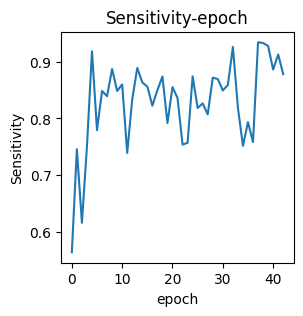

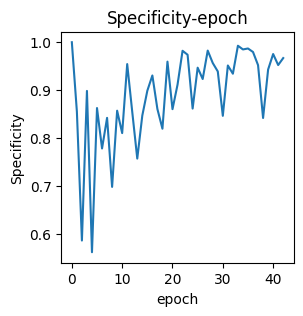

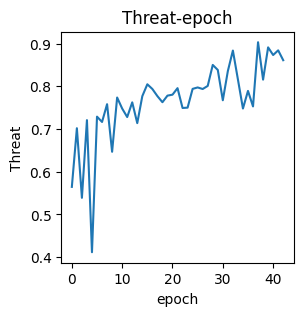

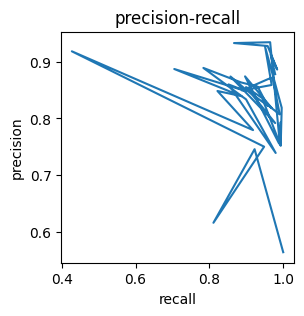

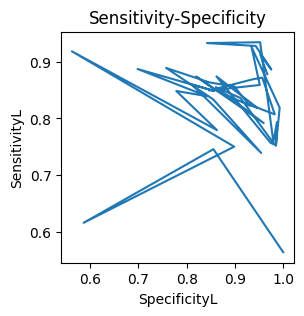

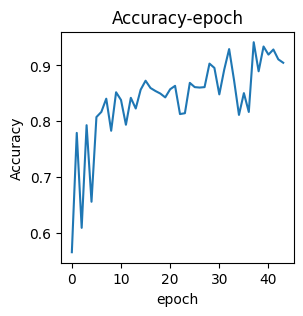

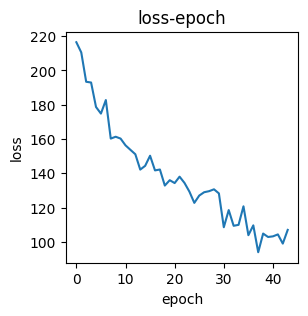

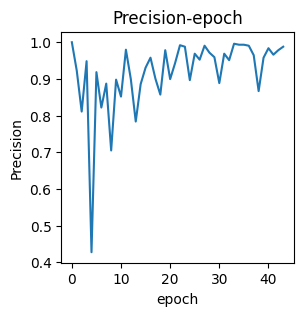

valid epoch[45/70]: 100%|██████████| 326/326 [00:06<00:00, 50.98it/s]
[epoch 45] loss: 0.287  accuracy: 0.941  Precision: 0.954  Recall: 0.942  F1: 0.947938  Sensitivity: 0.942  Specificity: 0.939  Threat: 0.901


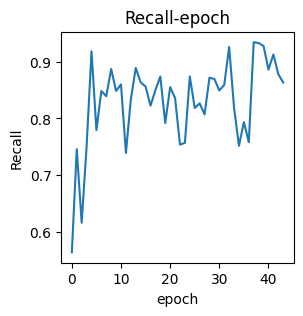

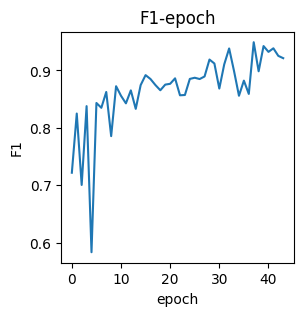

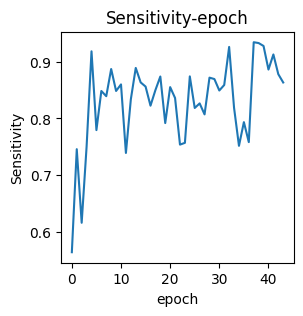

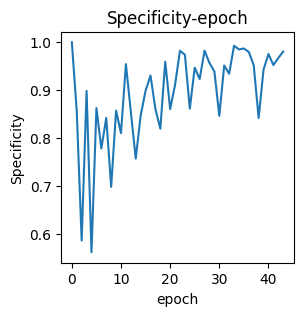

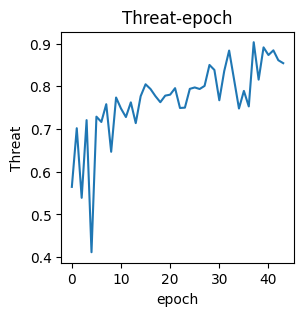

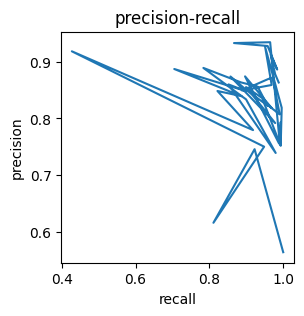

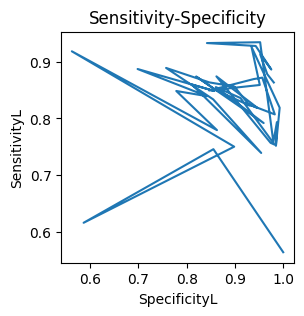

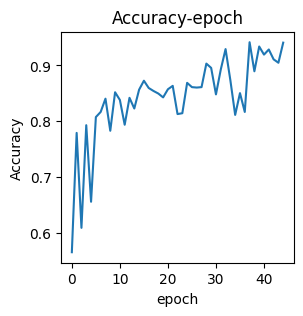

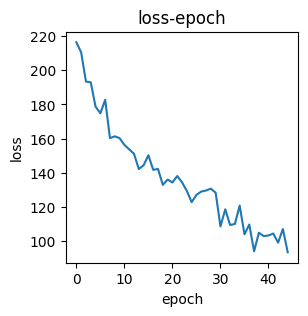

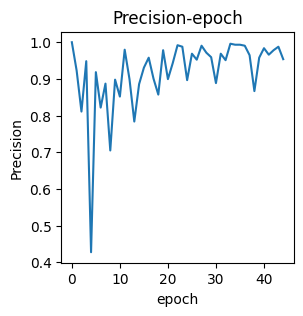

valid epoch[46/70]: 100%|██████████| 326/326 [00:06<00:00, 49.47it/s]
[epoch 46] loss: 0.313  accuracy: 0.933  Precision: 0.978  Recall: 0.910  F1: 0.942951  Sensitivity: 0.910  Specificity: 0.969  Threat: 0.892


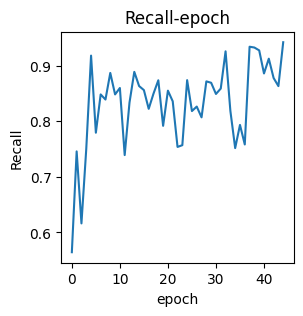

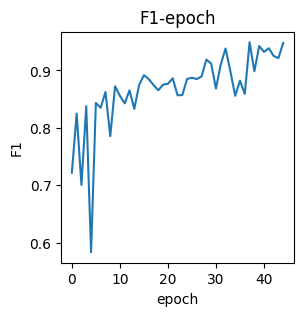

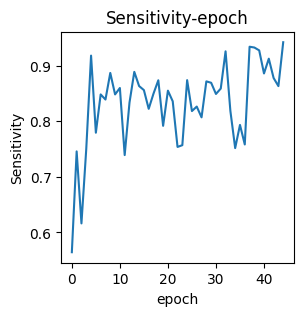

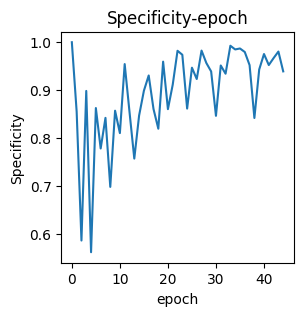

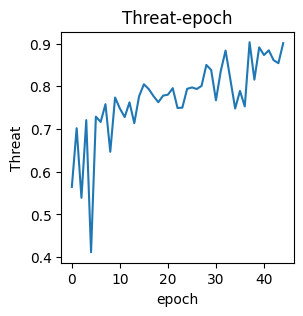

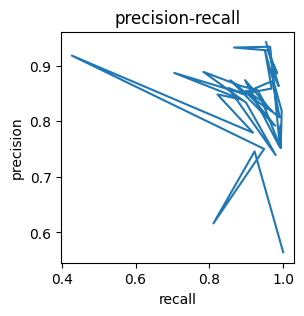

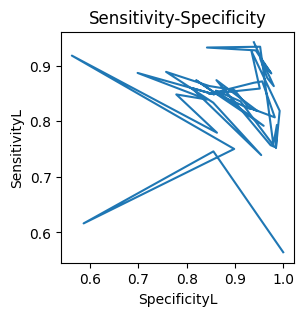

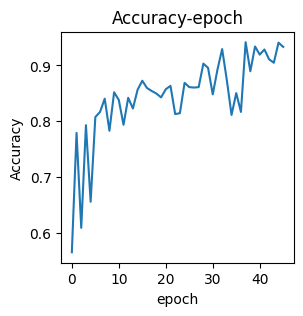

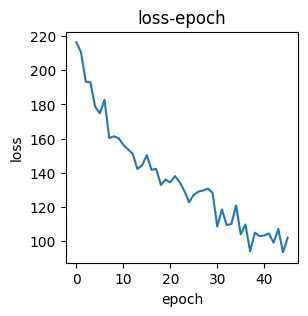

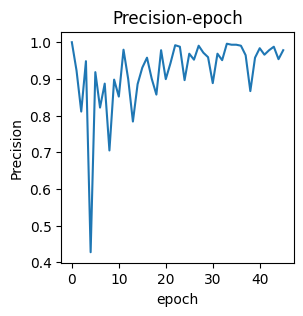

valid epoch[47/70]: 100%|██████████| 326/326 [00:06<00:00, 50.19it/s]
[epoch 47] loss: 0.278  accuracy: 0.869  Precision: 0.992  Recall: 0.815  F1: 0.895028  Sensitivity: 0.815  Specificity: 0.985  Threat: 0.810


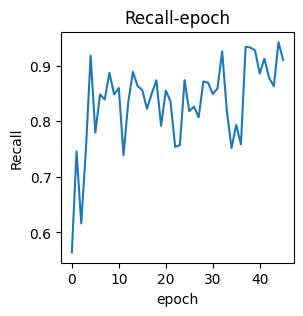

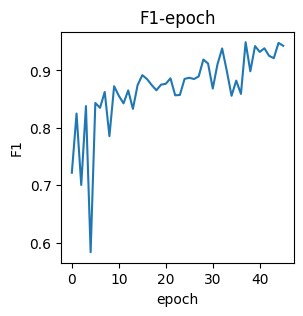

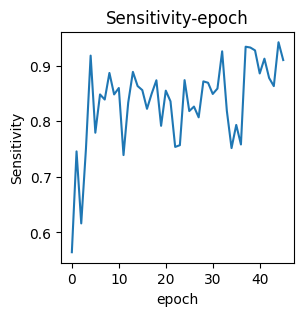

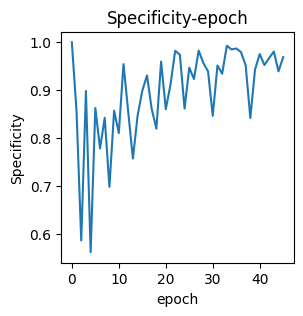

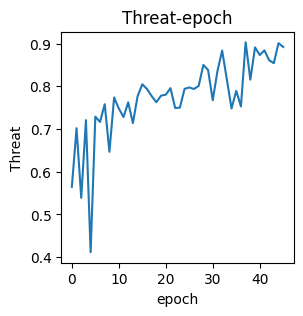

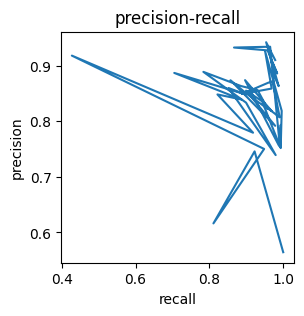

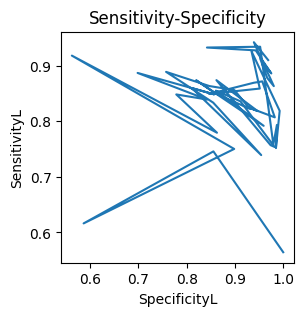

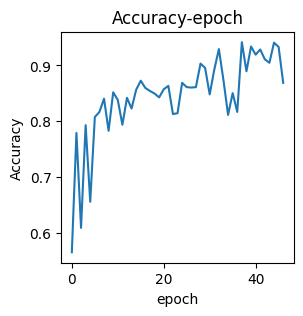

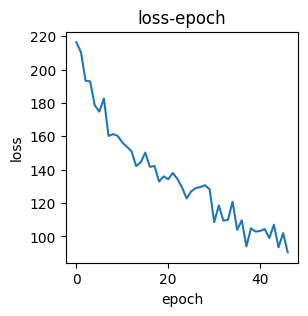

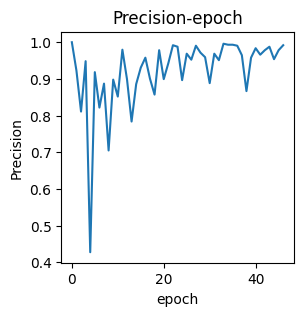

valid epoch[48/70]: 100%|██████████| 326/326 [00:06<00:00, 49.51it/s]
[epoch 48] loss: 0.289  accuracy: 0.952  Precision: 0.969  Recall: 0.947  F1: 0.957633  Sensitivity: 0.947  Specificity: 0.958  Threat: 0.919


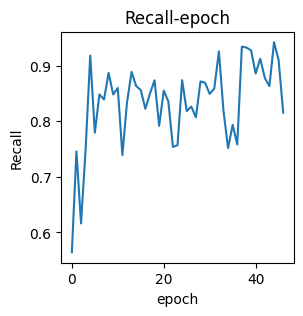

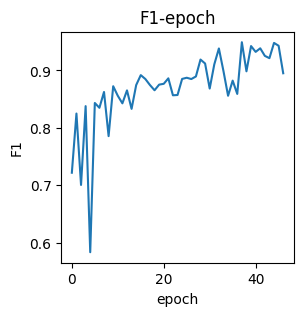

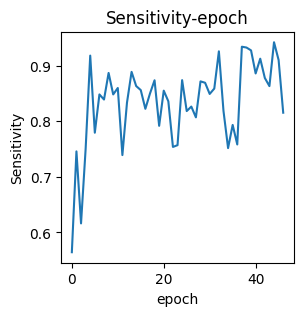

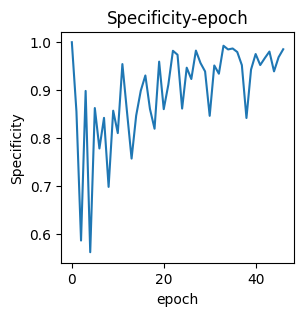

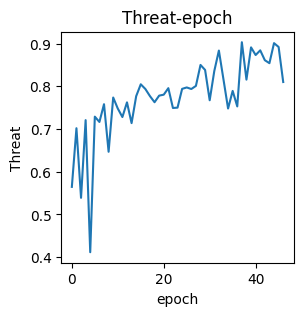

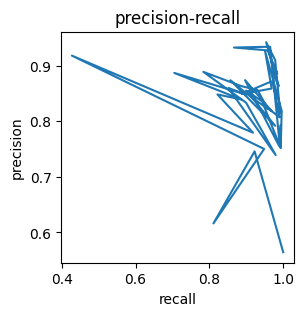

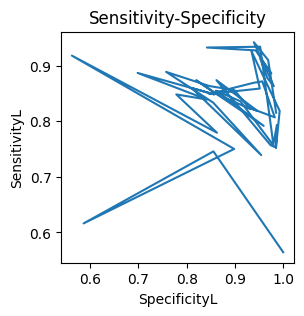

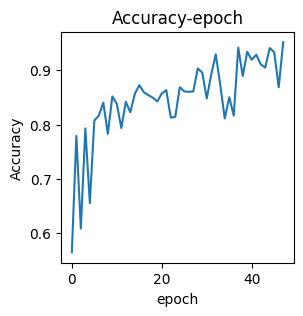

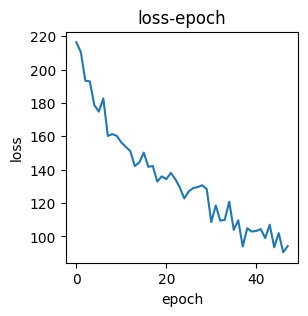

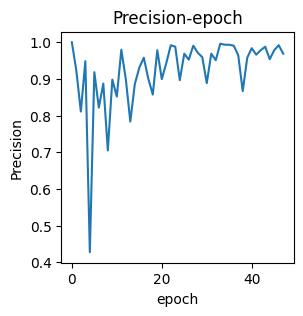

valid epoch[49/70]: 100%|██████████| 326/326 [00:06<00:00, 48.92it/s]
[epoch 49] loss: 0.279  accuracy: 0.940  Precision: 0.936  Recall: 0.957  F1: 0.946355  Sensitivity: 0.957  Specificity: 0.920  Threat: 0.898


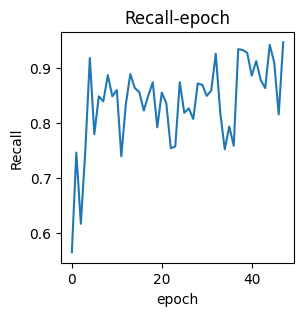

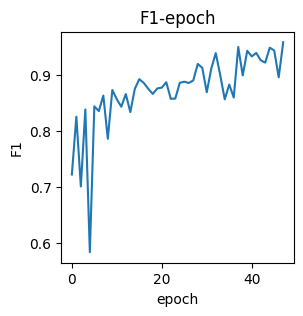

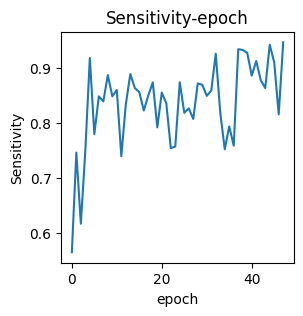

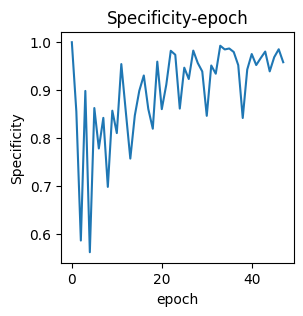

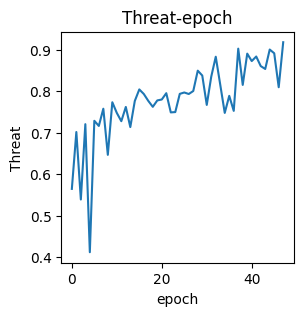

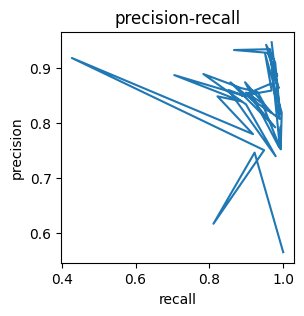

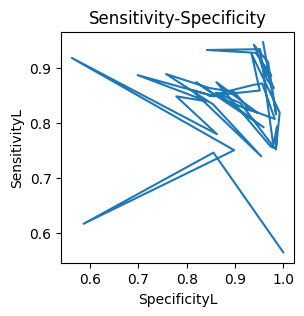

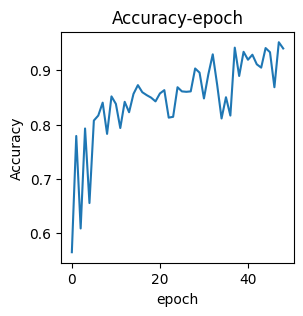

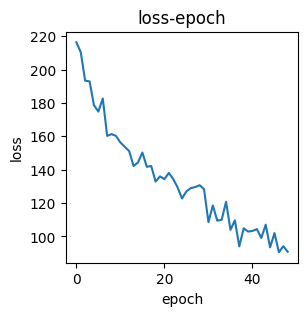

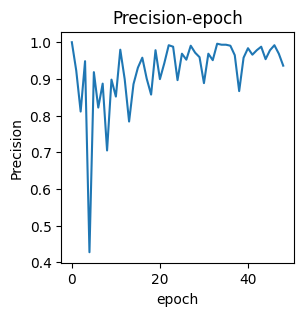

valid epoch[50/70]: 100%|██████████| 326/326 [00:06<00:00, 48.72it/s]
[epoch 50] loss: 0.292  accuracy: 0.939  Precision: 0.939  Recall: 0.953  F1: 0.945853  Sensitivity: 0.953  Specificity: 0.922  Threat: 0.897


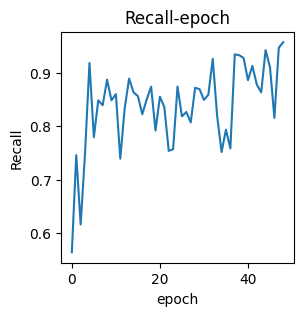

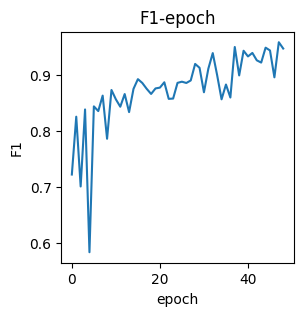

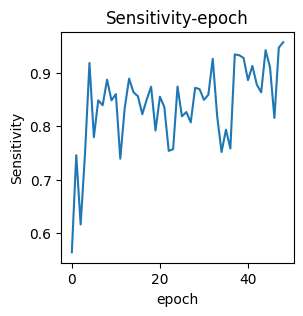

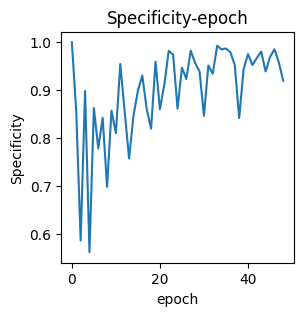

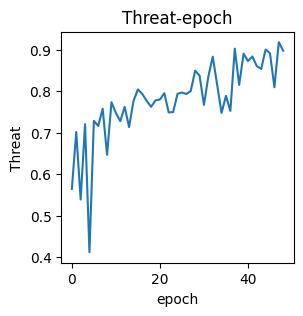

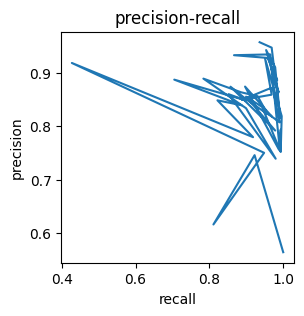

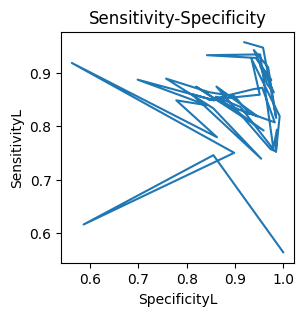

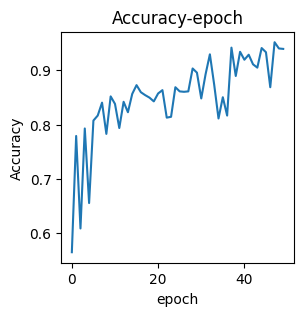

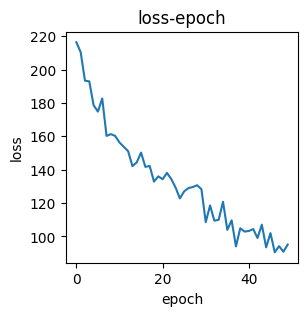

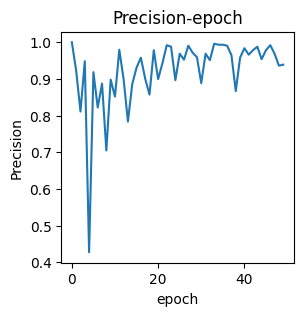

valid epoch[51/70]: 100%|██████████| 326/326 [00:06<00:00, 51.53it/s]
[epoch 51] loss: 0.278  accuracy: 0.911  Precision: 0.993  Recall: 0.868  F1: 0.926396  Sensitivity: 0.868  Specificity: 0.989  Threat: 0.863


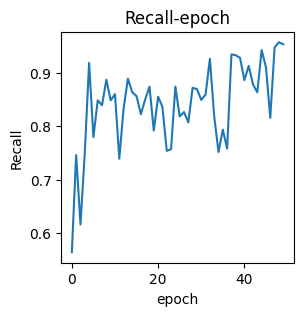

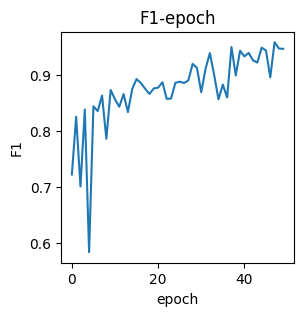

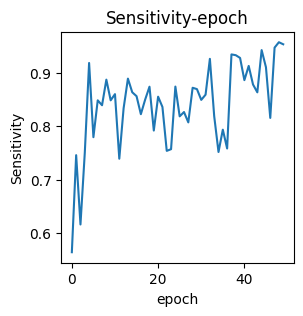

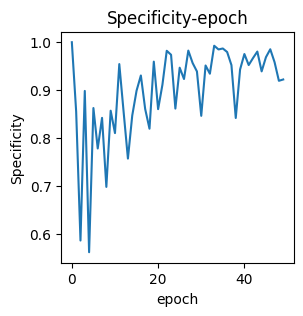

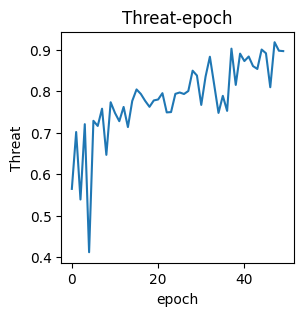

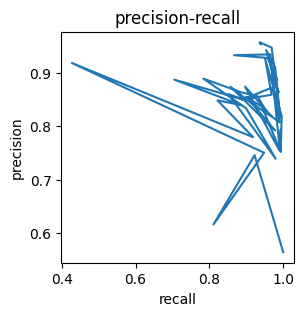

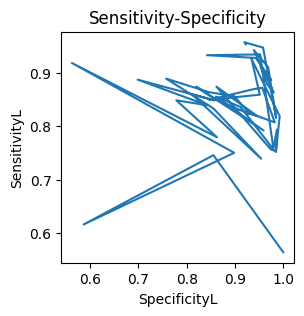

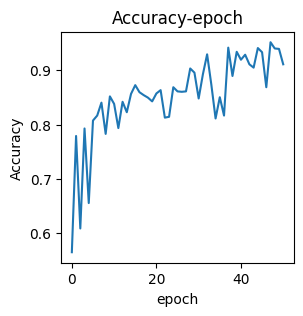

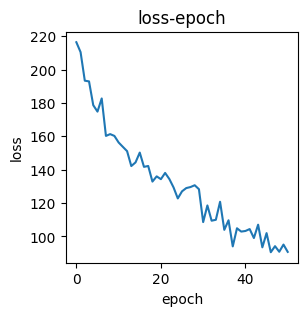

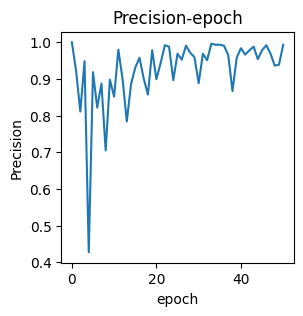

valid epoch[52/70]: 100%|██████████| 326/326 [00:06<00:00, 49.94it/s]
[epoch 52] loss: 0.270  accuracy: 0.942  Precision: 0.986  Recall: 0.918  F1: 0.950820  Sensitivity: 0.918  Specificity: 0.981  Threat: 0.906


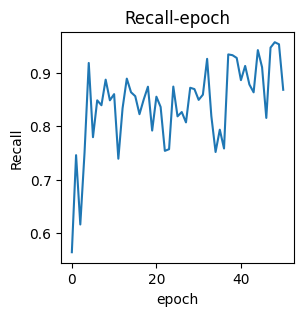

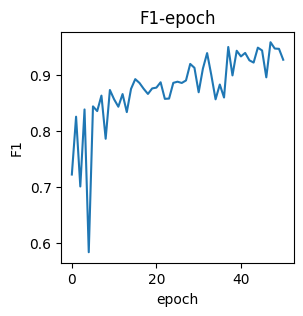

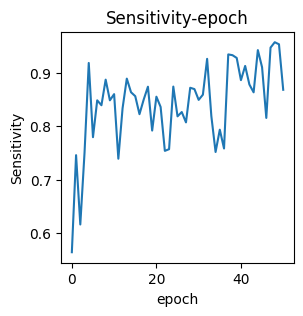

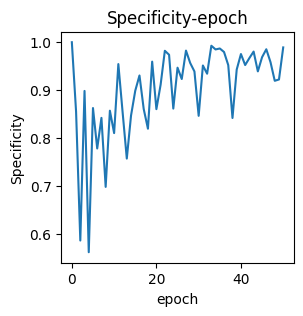

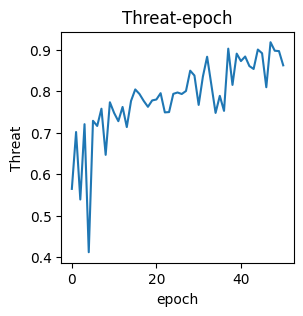

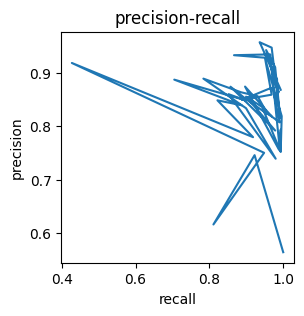

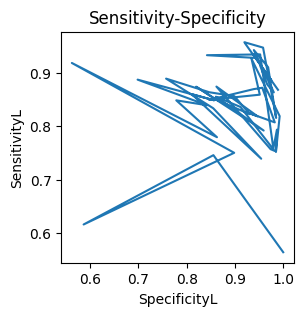

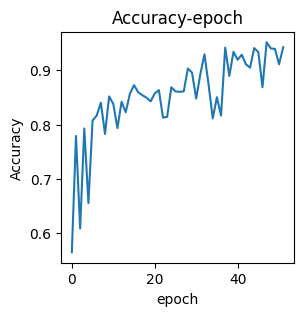

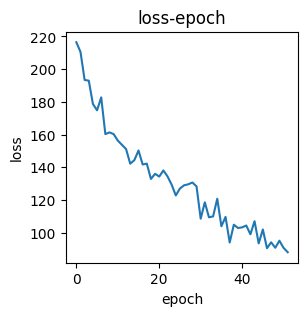

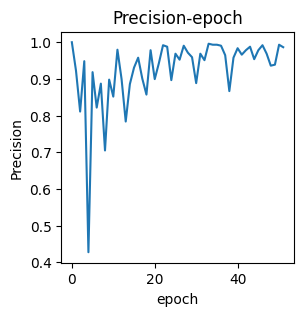

valid epoch[53/70]: 100%|██████████| 326/326 [00:06<00:00, 48.84it/s]
[epoch 53] loss: 0.260  accuracy: 0.927  Precision: 0.901  Recall: 0.968  F1: 0.933051  Sensitivity: 0.968  Specificity: 0.882  Threat: 0.875


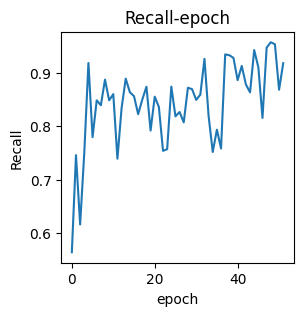

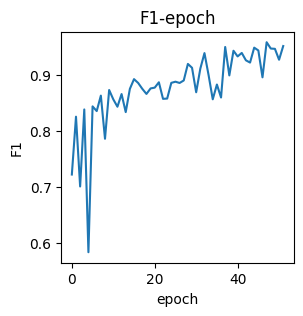

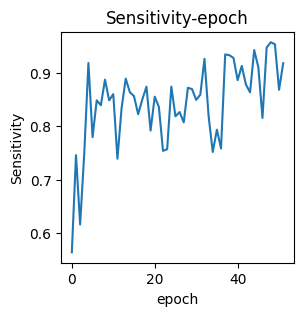

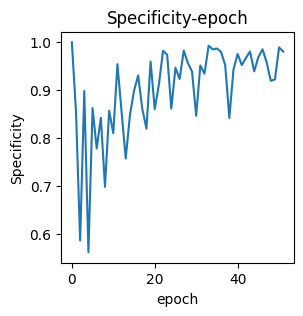

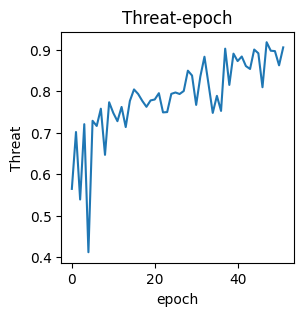

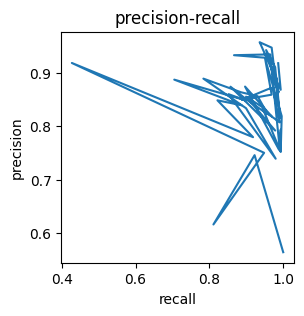

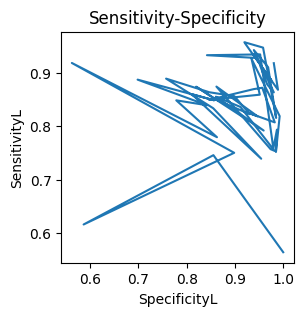

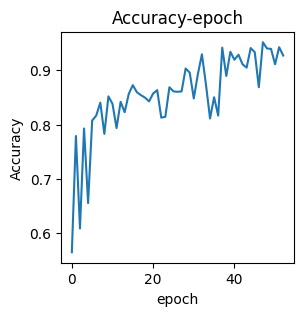

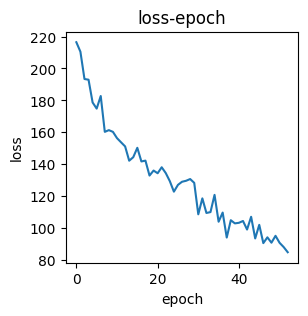

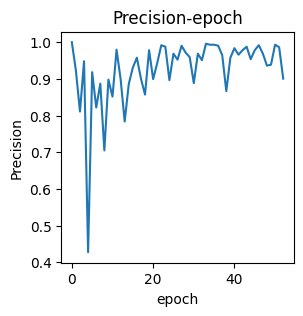

valid epoch[54/70]: 100%|██████████| 326/326 [00:06<00:00, 49.22it/s]
[epoch 54] loss: 0.273  accuracy: 0.902  Precision: 0.990  Recall: 0.857  F1: 0.919192  Sensitivity: 0.857  Specificity: 0.985  Threat: 0.850


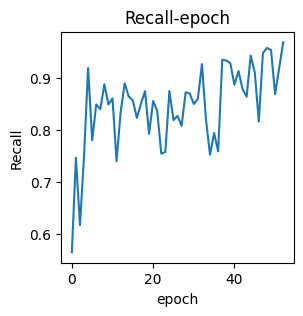

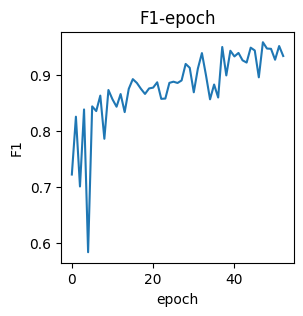

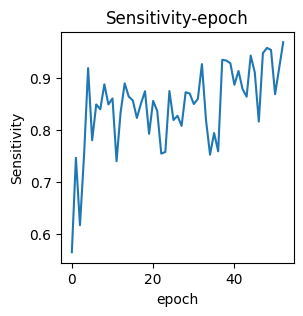

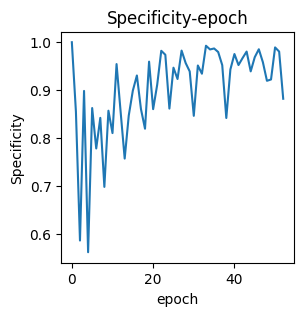

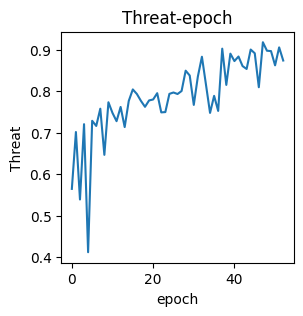

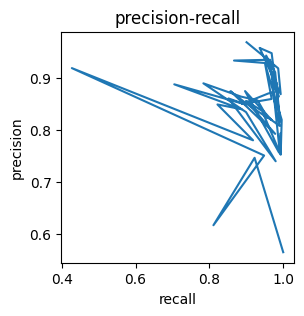

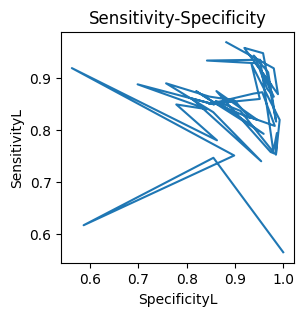

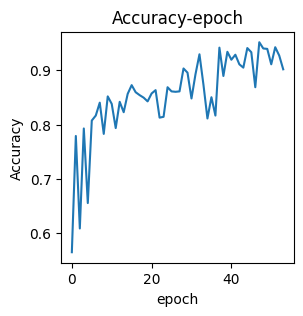

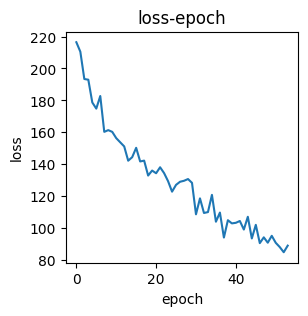

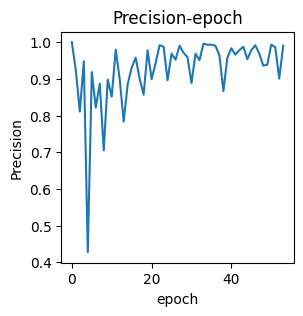

valid epoch[55/70]: 100%|██████████| 326/326 [00:06<00:00, 51.08it/s]
[epoch 55] loss: 0.281  accuracy: 0.895  Precision: 0.999  Recall: 0.844  F1: 0.914642  Sensitivity: 0.844  Specificity: 0.998  Threat: 0.843


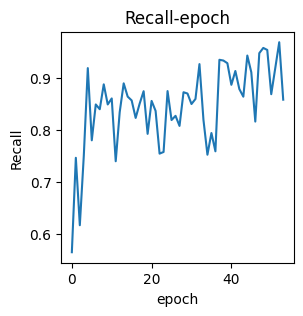

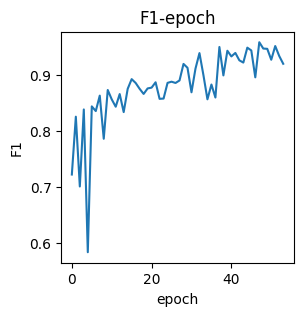

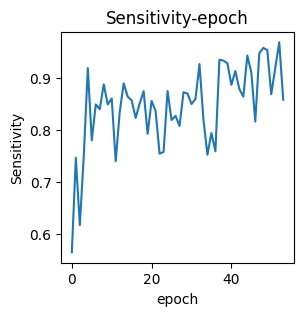

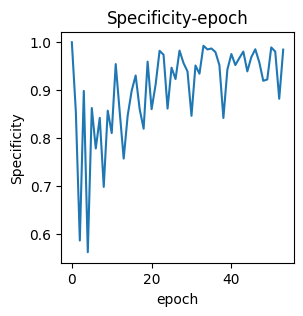

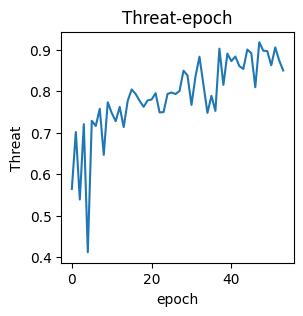

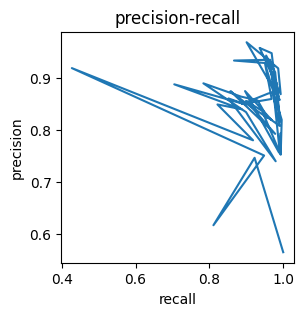

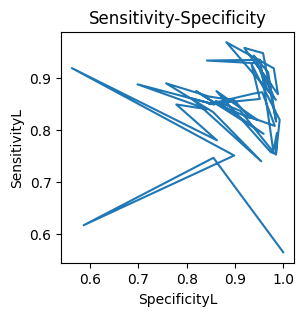

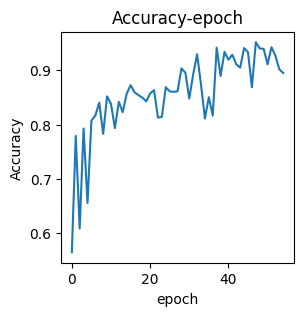

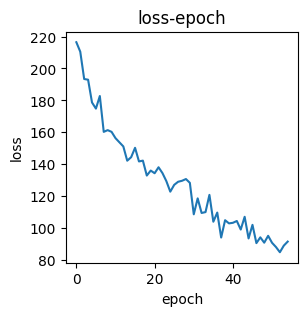

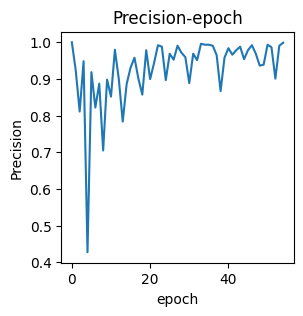

valid epoch[56/70]: 100%|██████████| 326/326 [00:06<00:00, 49.78it/s]
[epoch 56] loss: 0.245  accuracy: 0.926  Precision: 0.988  Recall: 0.892  F1: 0.937379  Sensitivity: 0.892  Specificity: 0.982  Threat: 0.882


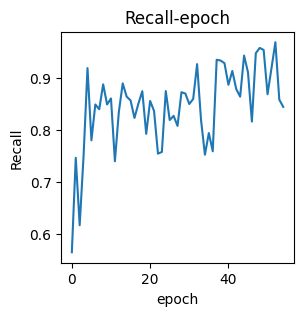

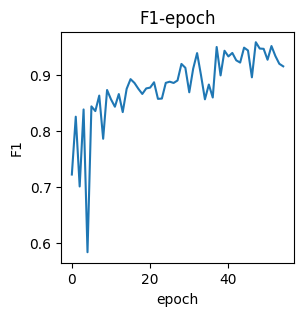

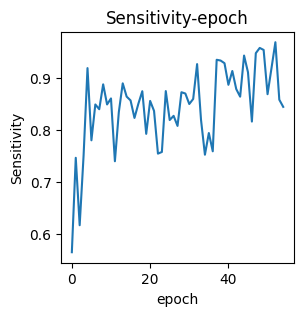

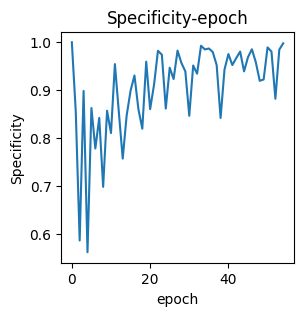

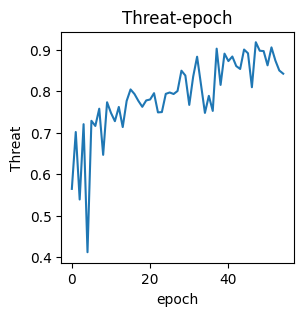

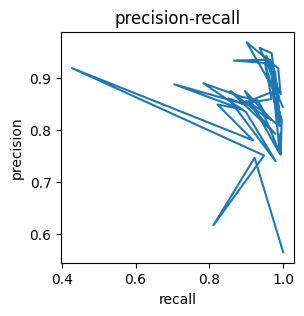

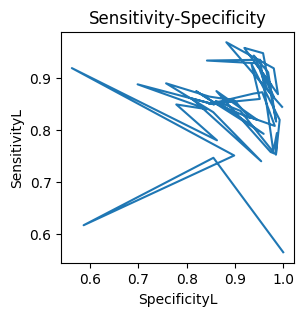

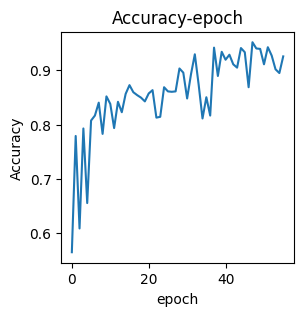

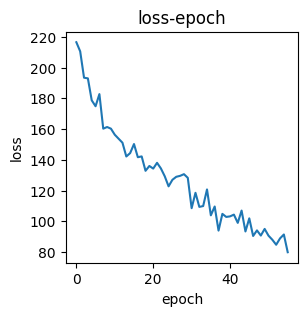

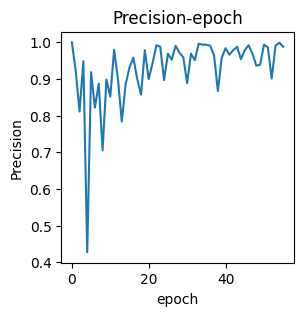

valid epoch[57/70]: 100%|██████████| 326/326 [00:06<00:00, 49.43it/s]
[epoch 57] loss: 0.293  accuracy: 0.940  Precision: 0.928  Recall: 0.965  F1: 0.945908  Sensitivity: 0.965  Specificity: 0.911  Threat: 0.897


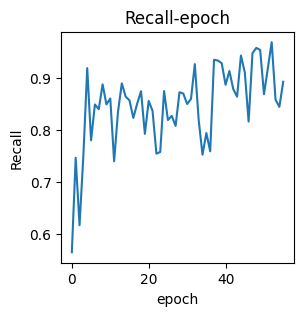

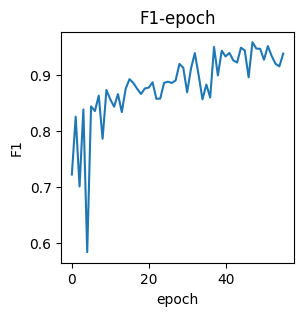

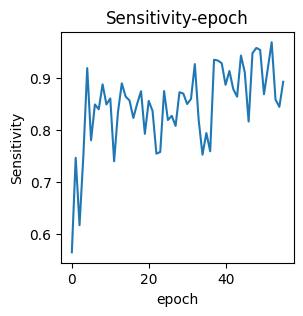

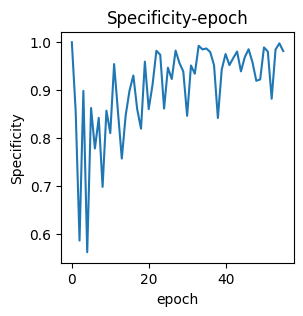

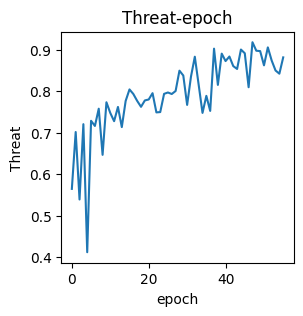

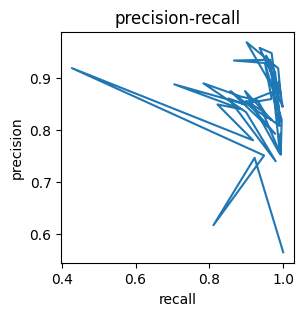

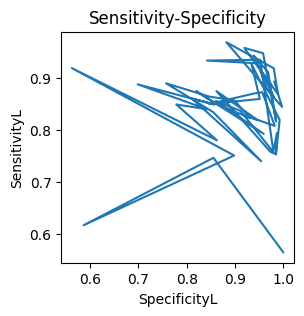

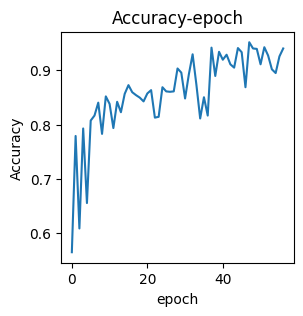

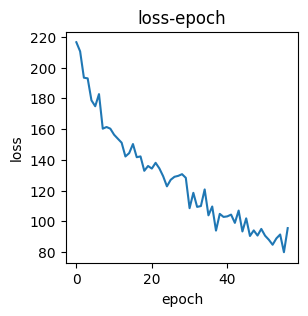

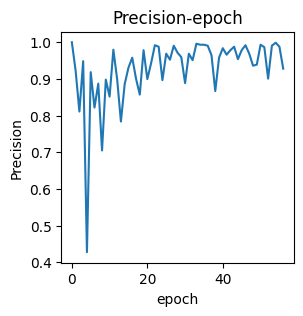

valid epoch[58/70]: 100%|██████████| 326/326 [00:06<00:00, 48.72it/s]
[epoch 58] loss: 0.251  accuracy: 0.946  Precision: 0.989  Recall: 0.920  F1: 0.953443  Sensitivity: 0.920  Specificity: 0.984  Threat: 0.911


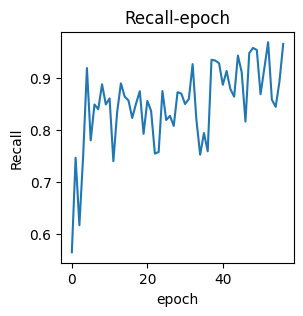

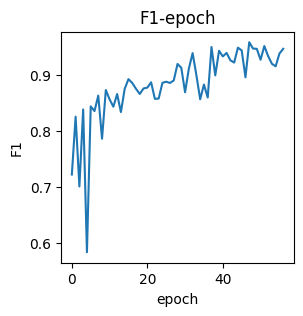

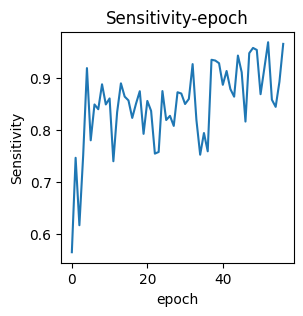

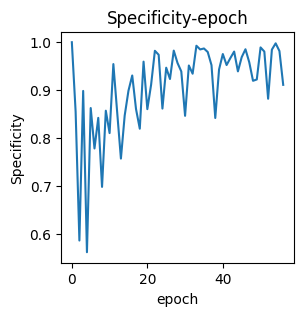

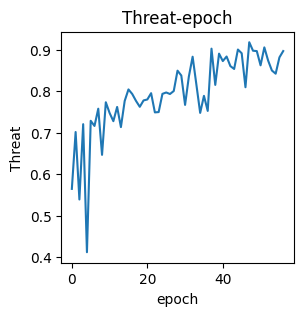

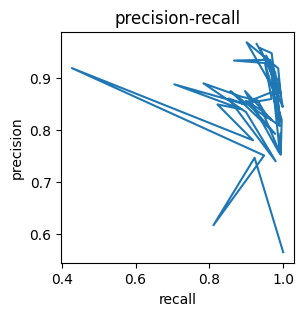

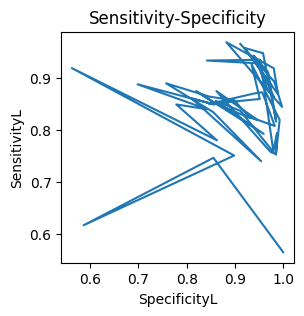

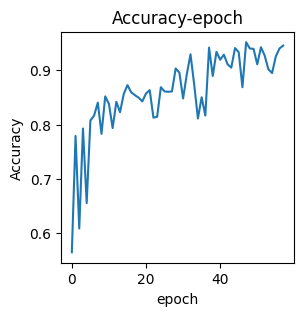

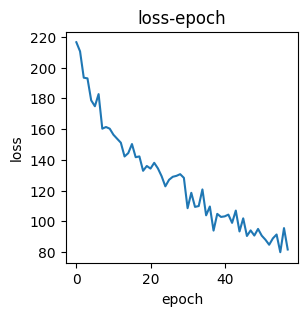

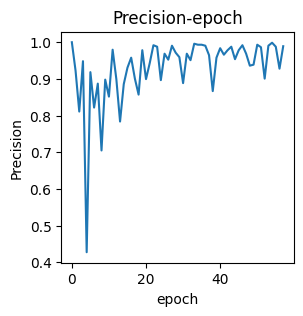

valid epoch[59/70]: 100%|██████████| 326/326 [00:06<00:00, 50.06it/s]
[epoch 59] loss: 0.258  accuracy: 0.952  Precision: 0.974  Recall: 0.943  F1: 0.958501  Sensitivity: 0.943  Specificity: 0.965  Threat: 0.920


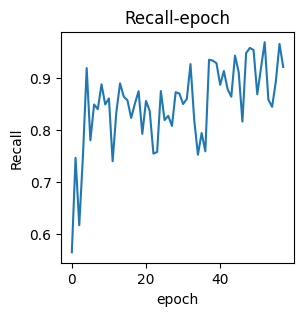

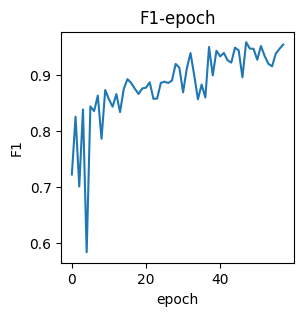

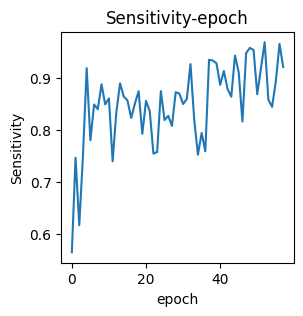

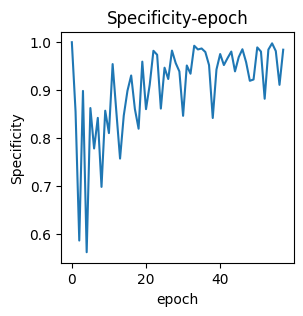

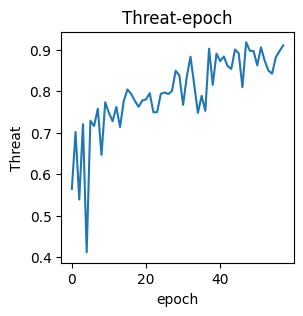

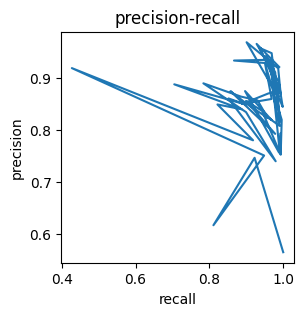

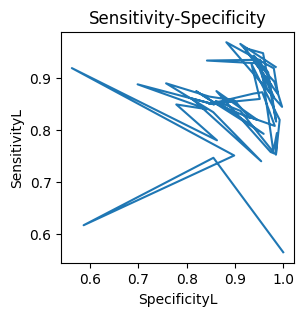

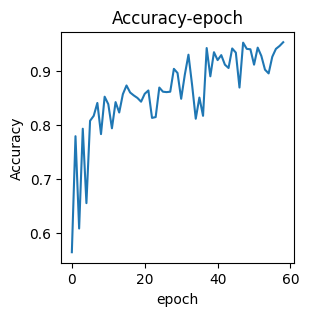

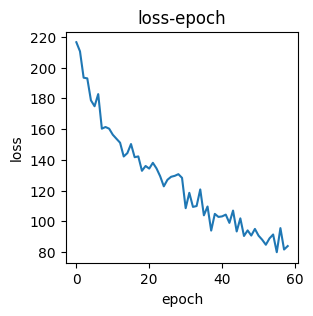

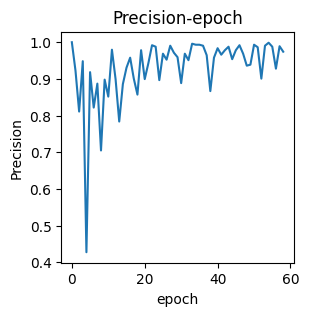

valid epoch[60/70]: 100%|██████████| 326/326 [00:06<00:00, 50.87it/s]
[epoch 60] loss: 0.245  accuracy: 0.962  Precision: 0.973  Recall: 0.961  F1: 0.966870  Sensitivity: 0.961  Specificity: 0.964  Threat: 0.936


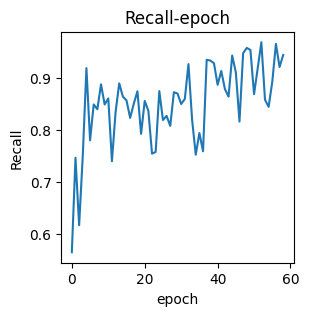

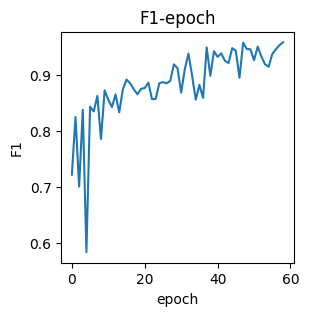

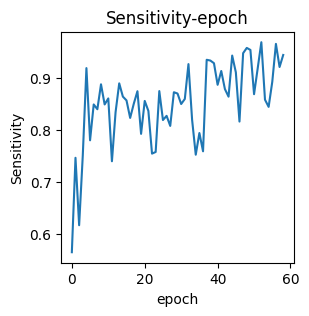

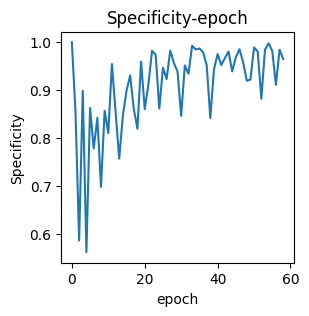

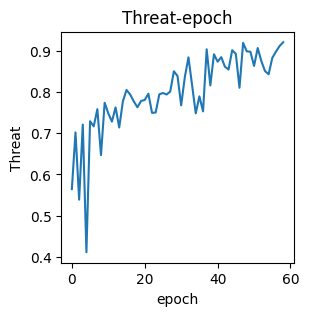

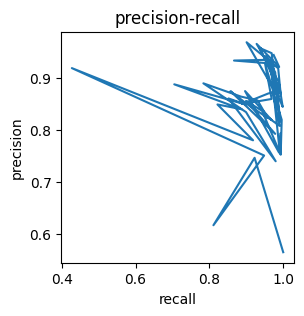

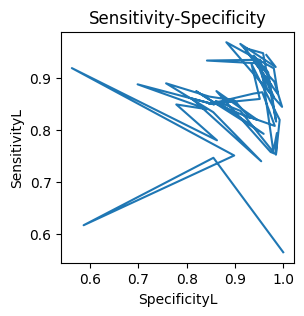

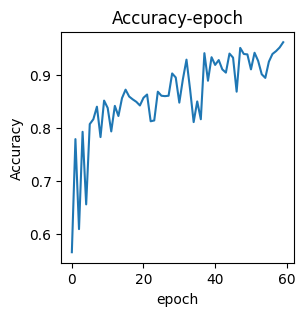

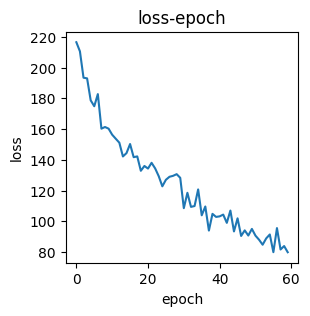

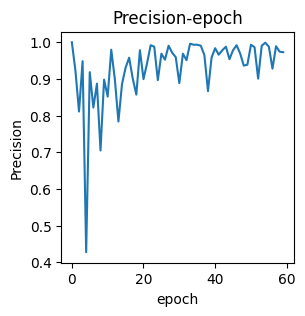

valid epoch[61/70]: 100%|██████████| 326/326 [00:06<00:00, 48.54it/s]
[epoch 61] loss: 0.232  accuracy: 0.952  Precision: 0.977  Recall: 0.940  F1: 0.957972  Sensitivity: 0.940  Specificity: 0.968  Threat: 0.919


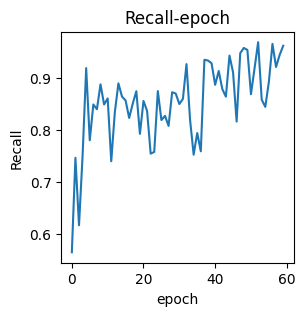

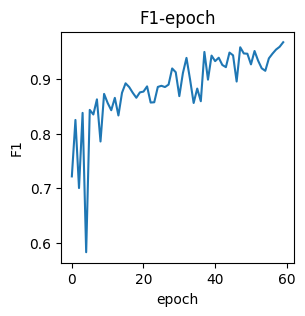

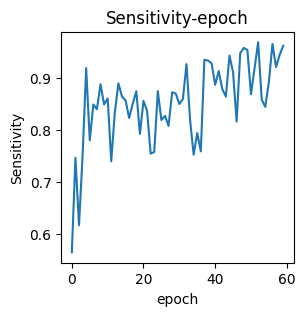

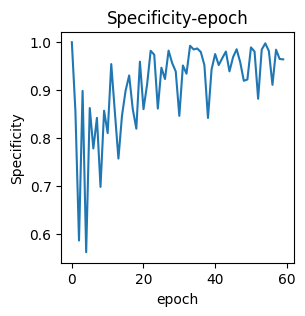

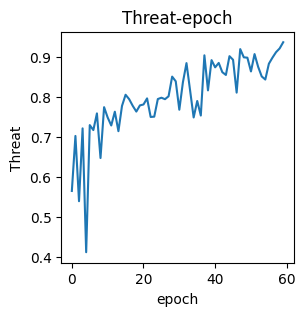

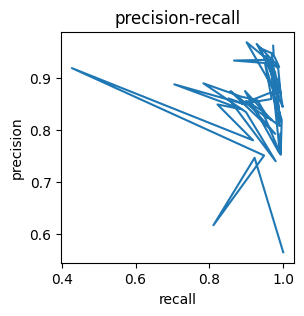

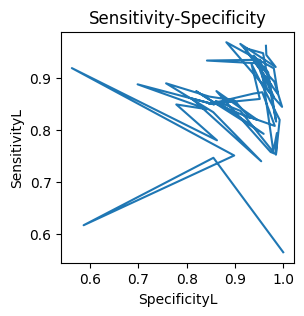

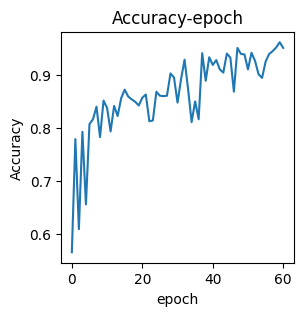

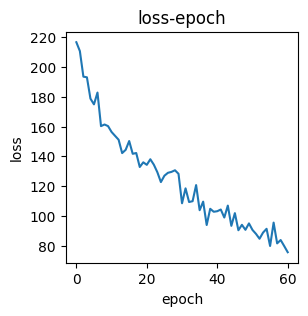

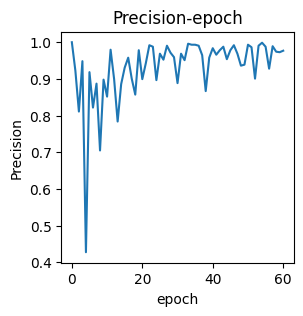

valid epoch[62/70]: 100%|██████████| 326/326 [00:06<00:00, 48.72it/s]
[epoch 62] loss: 0.257  accuracy: 0.949  Precision: 0.988  Recall: 0.926  F1: 0.955892  Sensitivity: 0.926  Specificity: 0.983  Threat: 0.916


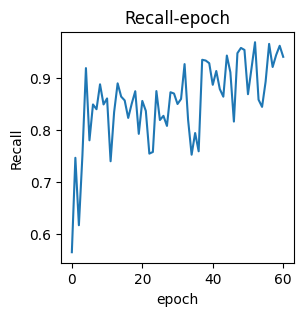

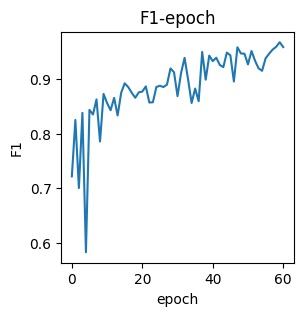

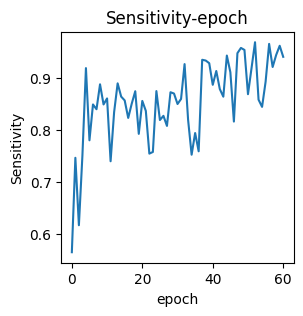

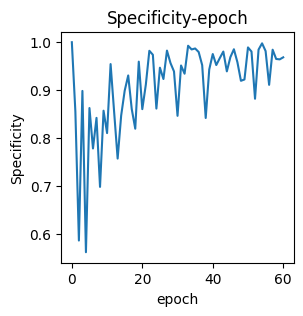

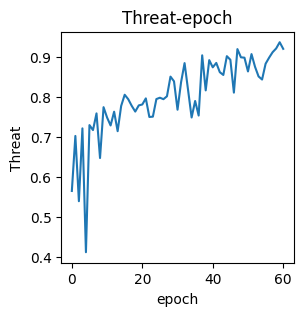

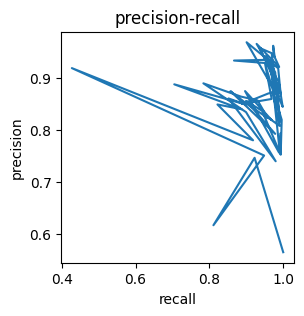

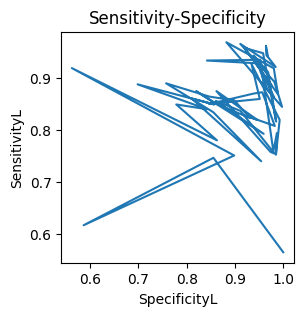

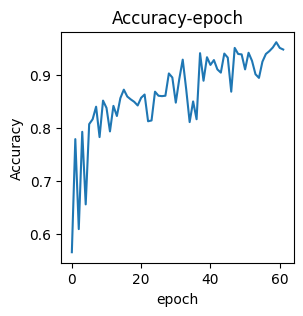

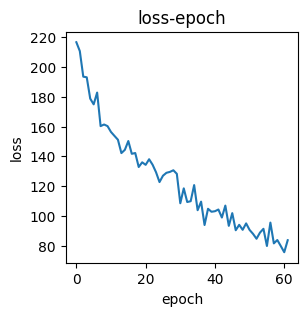

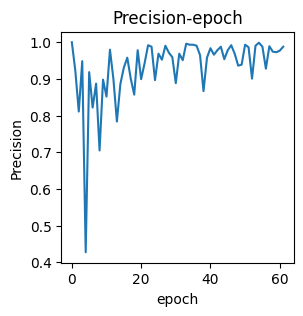

valid epoch[63/70]: 100%|██████████| 326/326 [00:06<00:00, 49.06it/s]
[epoch 63] loss: 0.234  accuracy: 0.945  Precision: 0.992  Recall: 0.917  F1: 0.952941  Sensitivity: 0.917  Specificity: 0.988  Threat: 0.910


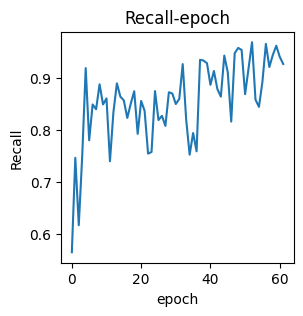

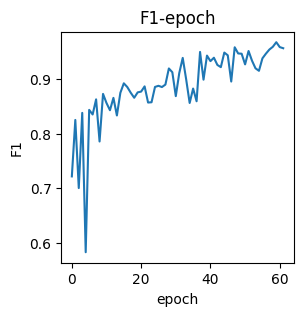

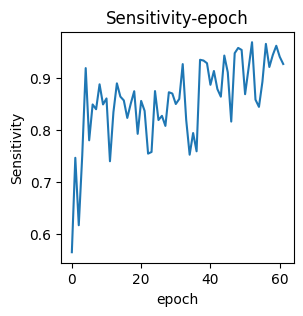

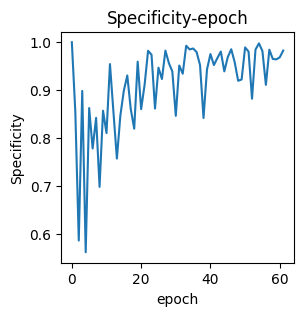

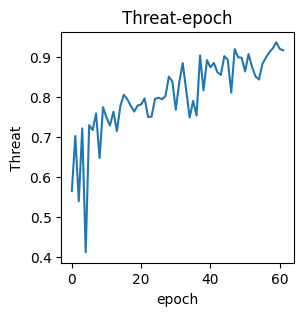

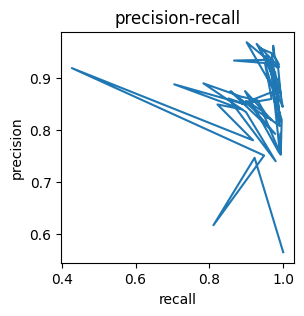

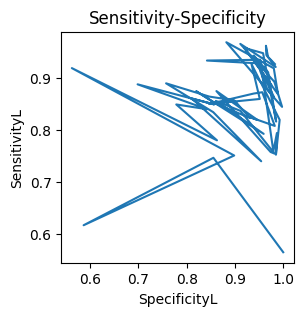

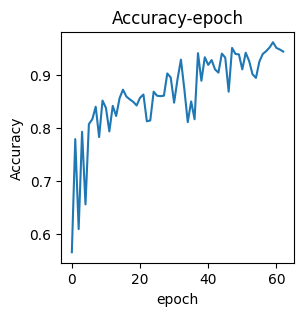

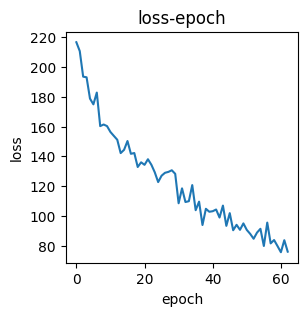

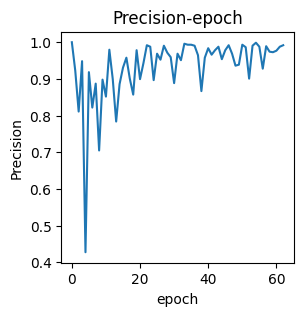

valid epoch[64/70]: 100%|██████████| 326/326 [00:06<00:00, 49.84it/s]
[epoch 64] loss: 0.221  accuracy: 0.966  Precision: 0.970  Recall: 0.970  F1: 0.970068  Sensitivity: 0.970  Specificity: 0.961  Threat: 0.942


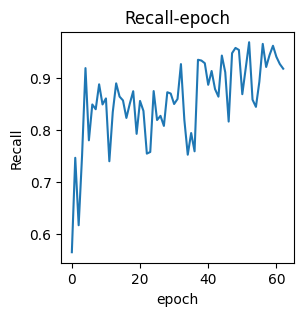

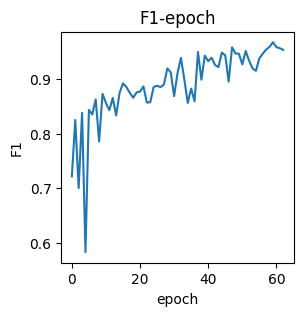

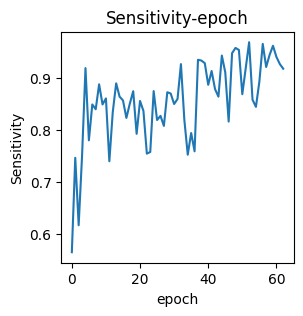

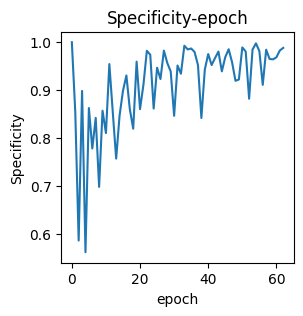

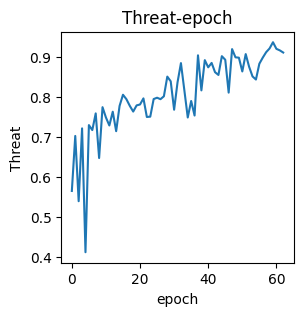

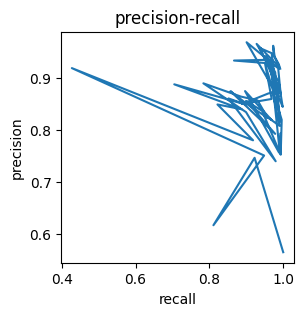

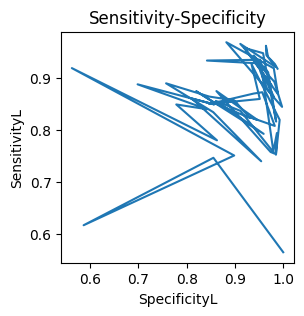

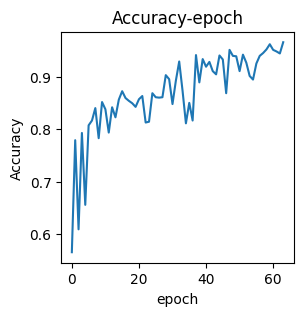

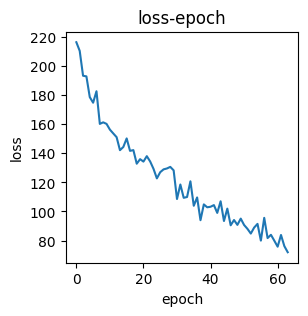

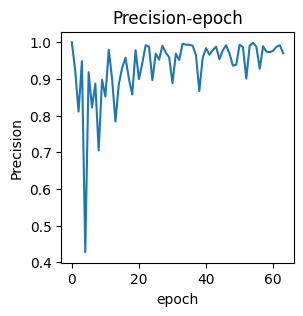

valid epoch[65/70]: 100%|██████████| 326/326 [00:06<00:00, 49.53it/s]
[epoch 65] loss: 0.243  accuracy: 0.910  Precision: 0.997  Recall: 0.864  F1: 0.926090  Sensitivity: 0.864  Specificity: 0.996  Threat: 0.862


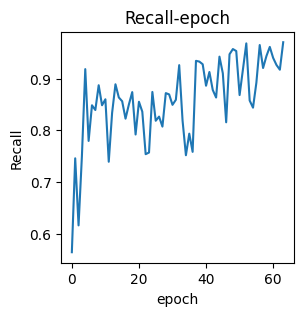

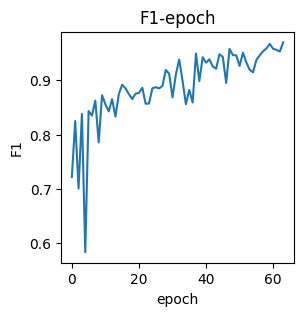

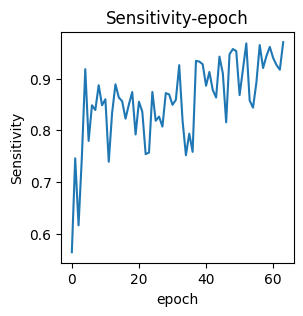

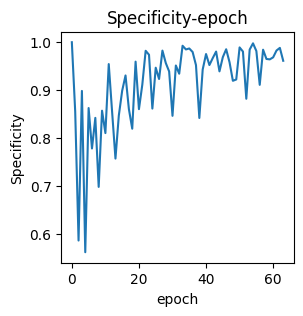

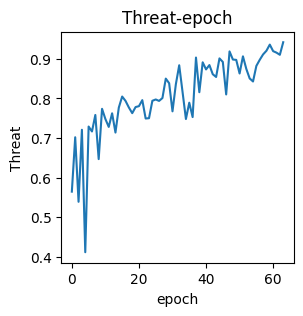

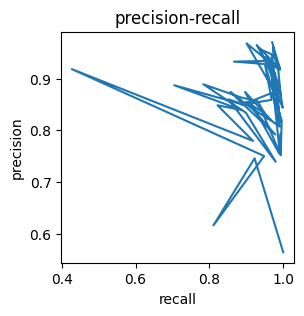

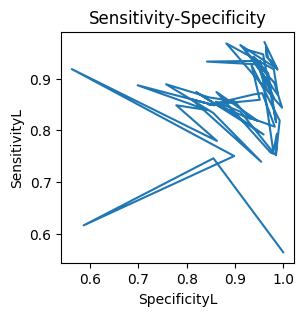

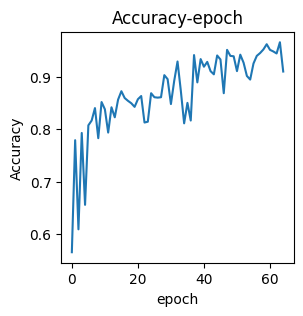

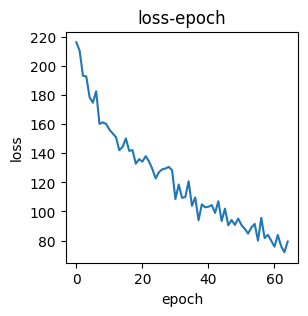

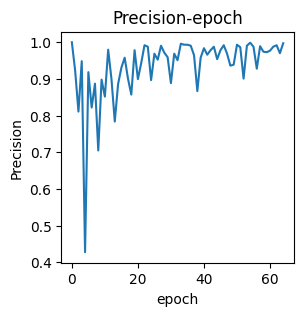

valid epoch[66/70]: 100%|██████████| 326/326 [00:06<00:00, 49.11it/s]
[epoch 66] loss: 0.239  accuracy: 0.935  Precision: 0.996  Recall: 0.899  F1: 0.945126  Sensitivity: 0.899  Specificity: 0.994  Threat: 0.896


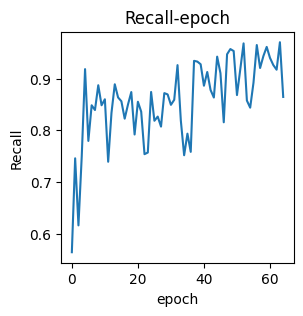

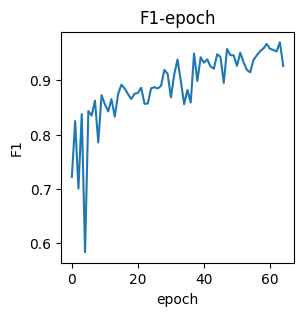

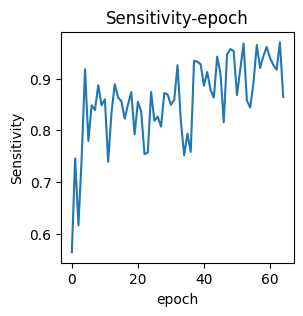

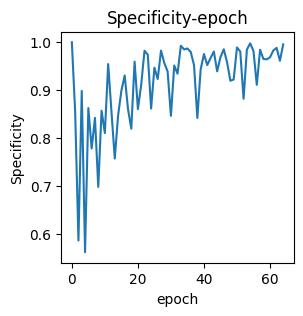

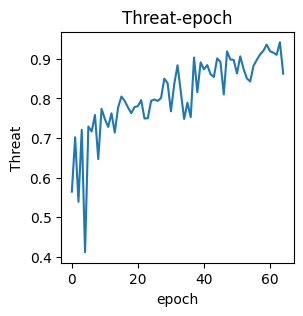

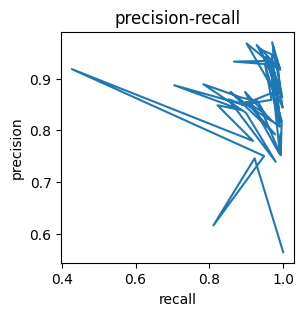

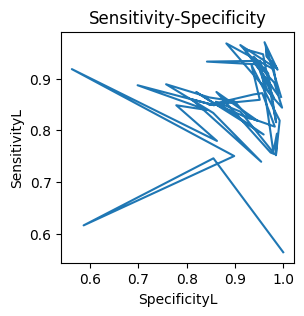

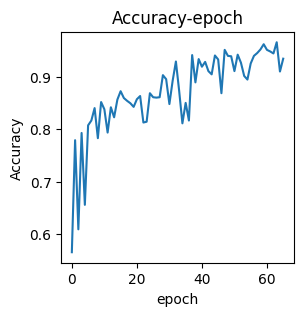

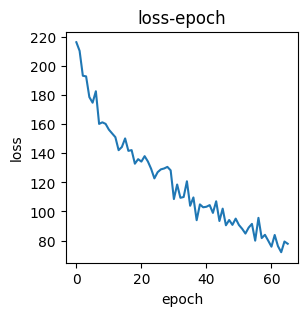

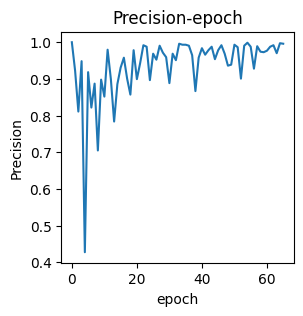

valid epoch[67/70]: 100%|██████████| 326/326 [00:06<00:00, 50.28it/s]
[epoch 67] loss: 0.234  accuracy: 0.922  Precision: 0.992  Recall: 0.884  F1: 0.934615  Sensitivity: 0.884  Specificity: 0.987  Threat: 0.877


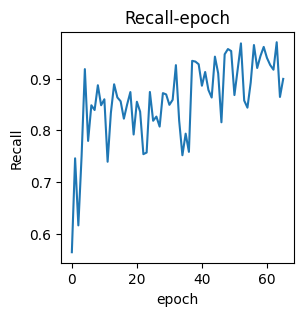

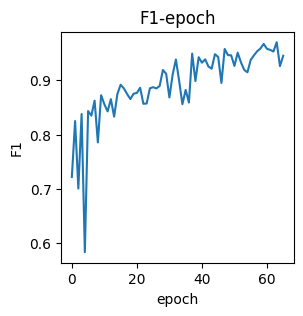

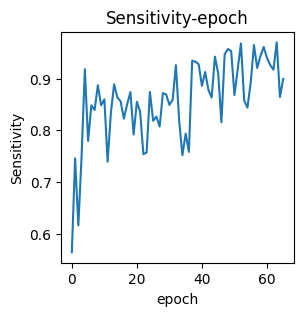

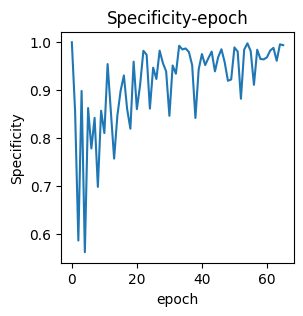

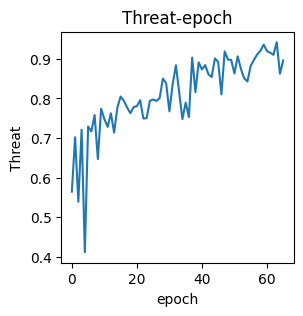

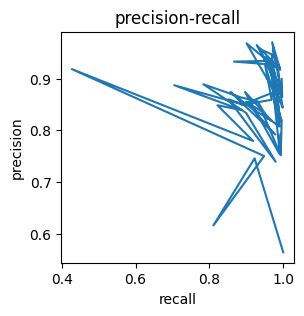

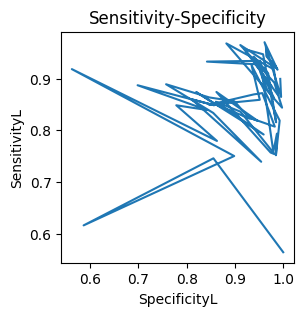

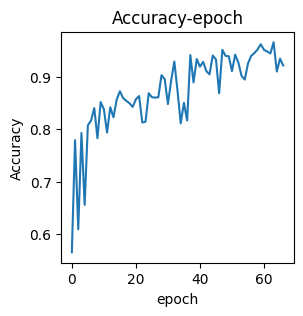

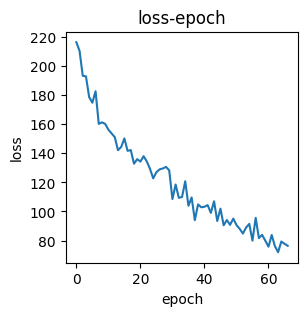

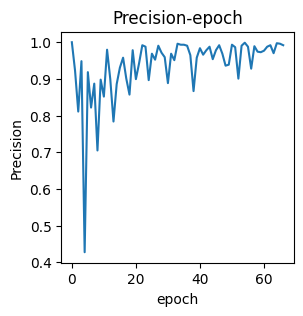

valid epoch[68/70]: 100%|██████████| 326/326 [00:06<00:00, 49.65it/s]
[epoch 68] loss: 0.227  accuracy: 0.960  Precision: 0.990  Recall: 0.942  F1: 0.965517  Sensitivity: 0.942  Specificity: 0.987  Threat: 0.933


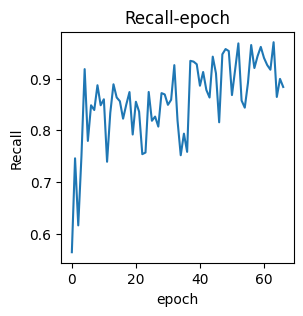

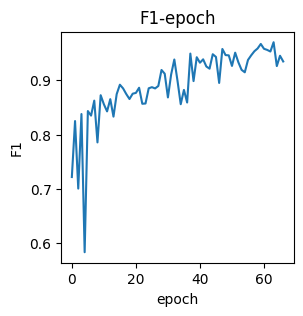

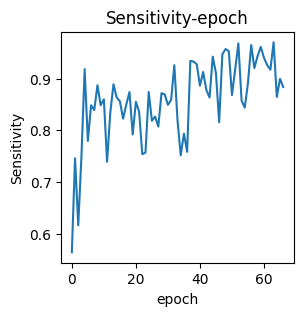

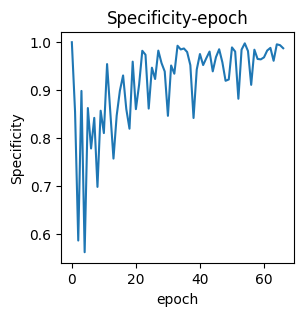

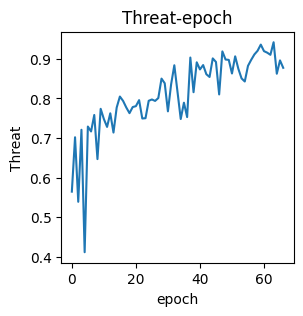

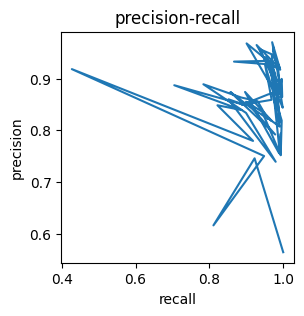

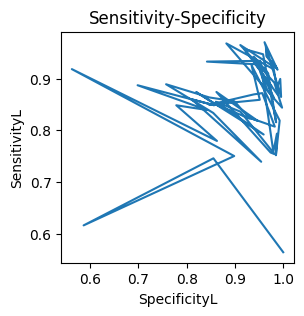

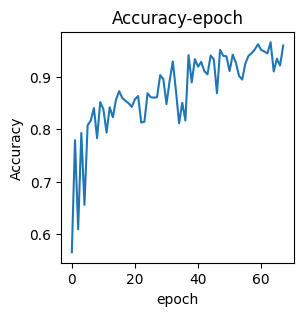

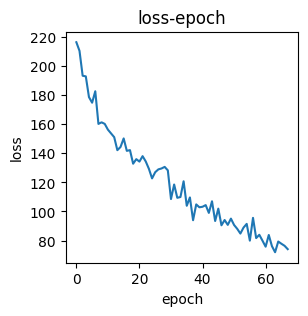

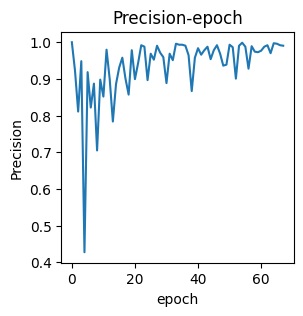

valid epoch[69/70]: 100%|██████████| 326/326 [00:06<00:00, 49.49it/s]
[epoch 69] loss: 0.223  accuracy: 0.942  Precision: 0.996  Recall: 0.909  F1: 0.950649  Sensitivity: 0.909  Specificity: 0.994  Threat: 0.906


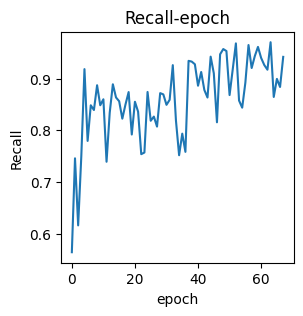

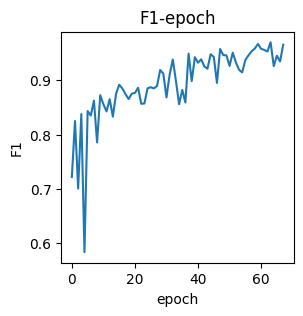

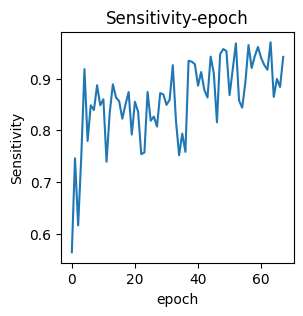

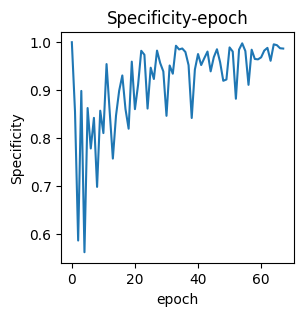

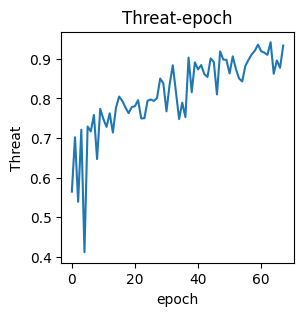

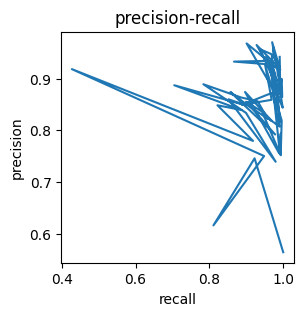

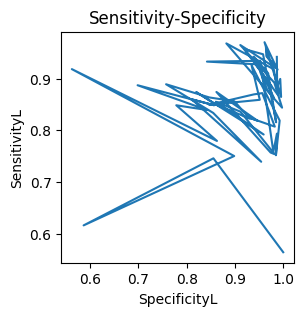

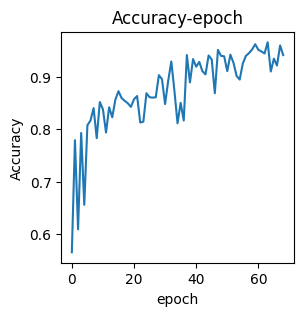

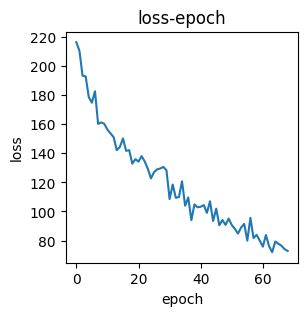

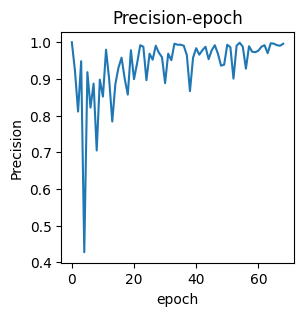

valid epoch[70/70]: 100%|██████████| 326/326 [00:06<00:00, 50.45it/s]
[epoch 70] loss: 0.219  accuracy: 0.960  Precision: 0.988  Recall: 0.944  F1: 0.965426  Sensitivity: 0.944  Specificity: 0.983  Threat: 0.933


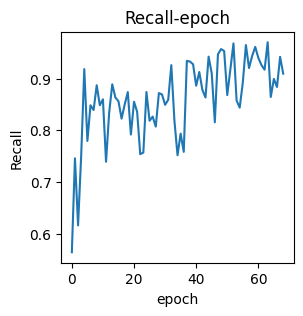

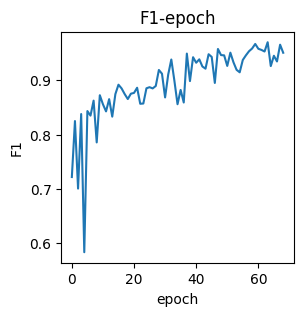

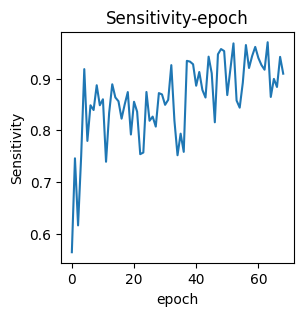

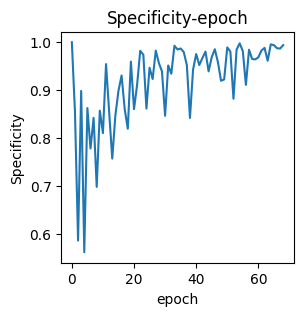

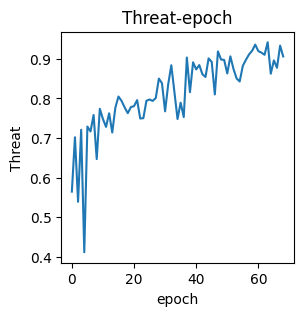

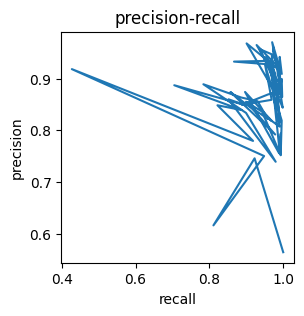

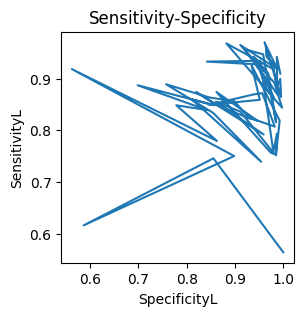

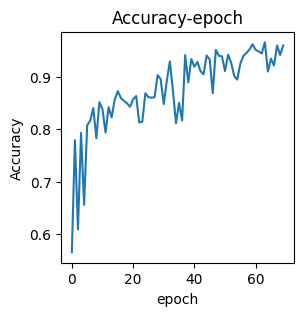

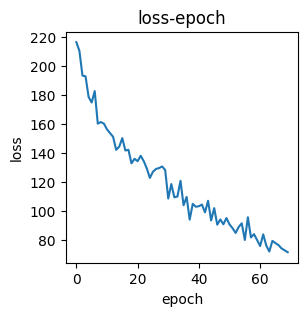

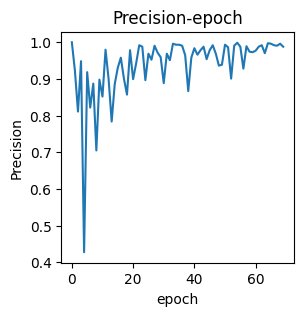

Finished Training


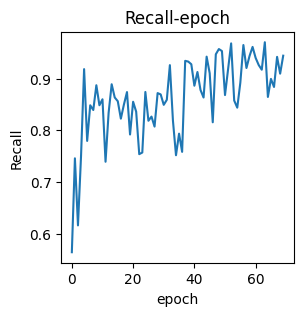

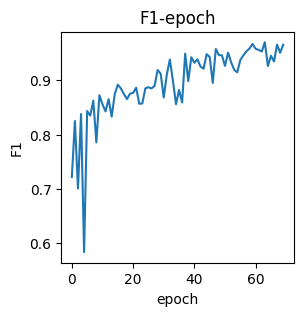

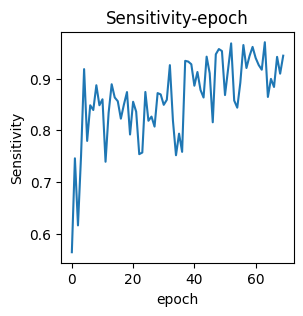

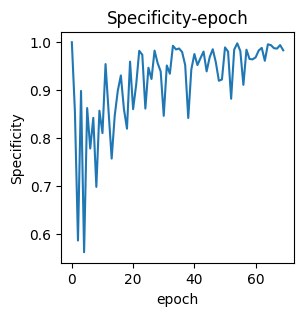

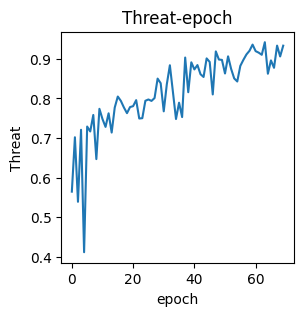

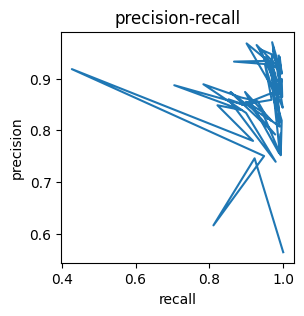

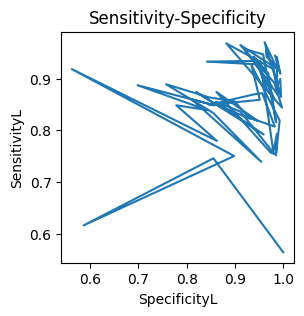

In [9]:
if __name__ == '__main__':
    main()
